<a href="https://colab.research.google.com/github/Druzhyninskyi/druzh_labs_pycharm/blob/master/DigitalSignals.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Цифрові сигнали (демонстрація) — Розділи 0–2
**Теми:** неперервні сигнали → дискретизація → aliasing  
**Інструменти:** `numpy`, `matplotlib`  

**Цілі:**
1. Побачити різницю між “майже неперервним” представленням і дискретними відліками.  
2. Зрозуміти роль частоти дискретизації `Fs` та теореми Найквіста–Шеннона (інтуїтивно).  
3. Побачити aliasing на синусах та на хвильовому пакеті (Gaussian-modulated sinusoid).  

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

plt.rcParams.update({
    "figure.figsize": (10, 4),
    "axes.grid": True,
    "lines.linewidth": 2,
    "font.size": 12
})

def stem(ax, x, y, color="C1", marker="o", basefmt=" ", label=None):
    """Легка заміна matplotlib.stem (щоб вигляд був охайний)."""
    ax.vlines(x, 0, y, color=color, alpha=0.7, linewidth=1)
    ax.plot(x, y, marker=marker, color=color, linestyle="None", label=label)

def fft_spectrum(x, Fs, n_fft=None, window=None):
    """
    Амплітудний спектр |X(f)| для реального сигналу x[n].
    Повертає частоти f (Гц) і модуль спектру mag.
    """
    x = np.asarray(x)
    N = x.size
    if window is not None:
        x = x * window(N)
    if n_fft is None:
        n_fft = int(2**np.ceil(np.log2(N)))  # next pow2
    X = np.fft.rfft(x, n=n_fft)
    f = np.fft.rfftfreq(n_fft, d=1/Fs)
    mag = np.abs(X) / N
    return f, mag

def plot_time_and_spectrum(t, x_t, Fs=None, x_n=None, n=None, title=""):
    """
    t, x_t: "майже неперервний" сигнал для графіка в часі
    Fs, x_n, n: (опційно) дискретний сигнал і його спектр
    """
    fig, axes = plt.subplots(1, 2, figsize=(12, 4))
    ax0, ax1 = axes

    ax0.plot(t, x_t, color="C0", label="x(t) (щільна сітка)")
    if (x_n is not None) and (n is not None) and (Fs is not None):
        t_s = n / Fs
        stem(ax0, t_s, x_n, color="C1", label="відліки x[n]")
    ax0.set_xlabel("t, c")
    ax0.set_ylabel("амплітуда")
    ax0.set_title(title + " — часова область")
    ax0.legend(loc="best")

    if (x_n is not None) and (Fs is not None):
        f, mag = fft_spectrum(x_n, Fs, n_fft=4096)
        ax1.plot(f, mag, color="C2")
        ax1.set_xlabel("f, Гц")
        ax1.set_ylabel("|X(f)| (умовн.)")
        ax1.set_title(title + " — спектр (FFT, rfft)")
        ax1.set_xlim(0, Fs/2)
    else:
        ax1.axis("off")

    plt.tight_layout()
    plt.show()

## 0. Вступ: три “рівні” сигналів

- **Неперервний сигнал**: $x(t)$, визначений для будь-якого часу $t \in \mathbb{R}$.  
  У ноутбуці ми не можемо реально мати нескінченно багато точок, тому використовуємо **дуже щільну сітку** як наближення.

- **Дискретний сигнал**: $x[n] = x(nT_s)$, де $T_s = 1/F_s$ — період дискретизації, $F_s$ — частота дискретизації.

- **Цифровий сигнал**: дискретний сигнал, значення якого ще й **квантуються**.  
  Квантування буде в наступних розділах — тут поки зосередимося лише на дискретизації.

In [ ]:
# "майже неперервний" час: дуже щільна сітка
t_min, t_max = 0, 2.0
N_cont = 1_000
t = np.linspace(t_min, t_max, N_cont)

# приклади частот дискретизації для відліків
Fs_list = [20, 50, 200]  # Гц

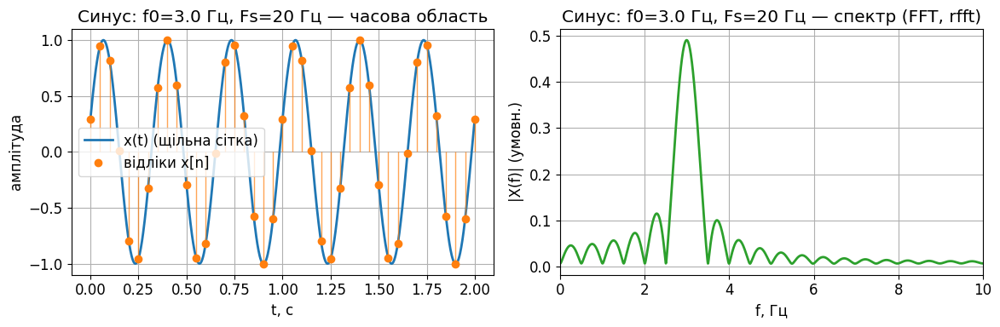

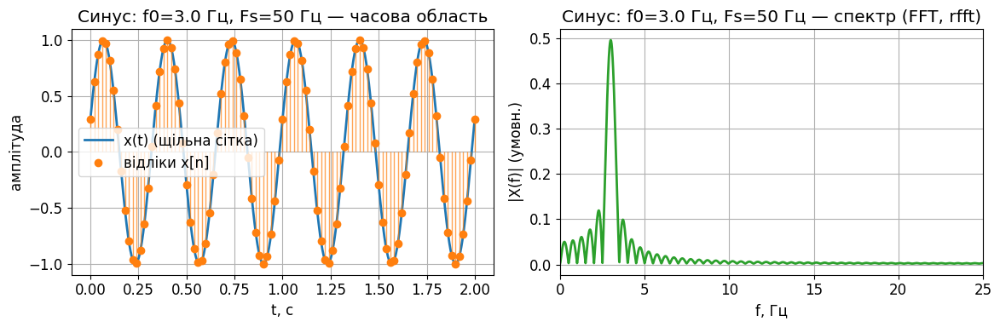

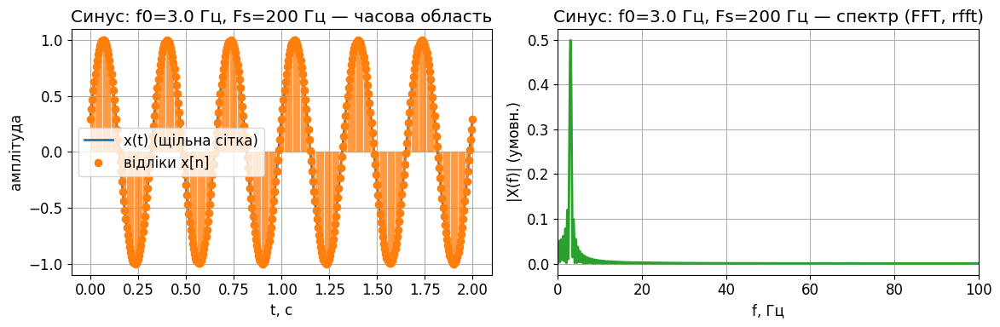

In [ ]:
A = 1.0
f0 = 3.0   # Гц
phi = 0.3  # рад

x_t = A * np.sin(2*np.pi*f0*t + phi)

for Fs in Fs_list:
    n = np.arange(int((t_max - t_min) * Fs) + 1)
    t_s = t_min + n / Fs
    x_n = A * np.sin(2*np.pi*f0*t_s + phi)
    plot_time_and_spectrum(
        t, x_t,
        Fs=Fs, x_n=x_n, n=n,
        title=f"Синус: f0={f0} Гц, Fs={Fs} Гц"
    )

## 1.2 Гаусів сигнал

Гаусоїда — ключовий приклад:
$$
g(t)=\exp\left(-\frac{t^2}{2\sigma^2}\right)
$$

Властивості:

- **локалізована** в часі (швидко спадає)
- **нескінченно гладка**
- має простий аналітичний спектр (побачимо у розділі Фур’є)
- важлива для інтерполяції: гладкість ⇒ швидко “вмирають” високі частоти ⇒ дуже мала похибка для тригонометричної інтерполяції

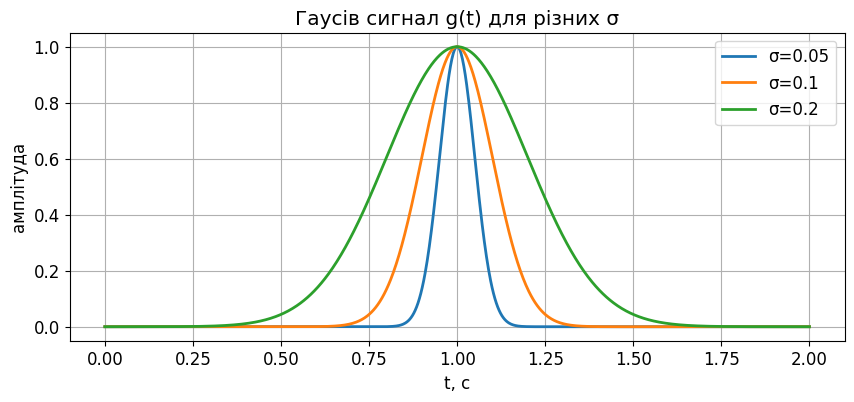

In [ ]:
sigmas = [0.05, 0.1, 0.2]
fig, ax = plt.subplots(figsize=(10, 4))
t0 = (t_min + t_max) * 0.5

for s in sigmas:
    g = np.exp(-((t - t0)**2)/(2*s*s))
    ax.plot(t, g, label=f"σ={s}")

ax.set_title("Гаусів сигнал g(t) для різних σ")
ax.set_xlabel("t, c")
ax.set_ylabel("амплітуда")
ax.legend()
plt.show()


## 1.3 Хвильовий пакет (модульований синус)

Класика DSP/фізики сигналів:
$$
x(t) = \exp\left(-\frac{t^2}{2\sigma^2}\right)\cos(2\pi f_c t)
$$

- огинаюча визначає тривалість у часі  
- несуча \(f_c\) визначає основну частоту спектра  
- чудово підходить для демонстрації співвідношення “тривалість ↔ ширина спектра”

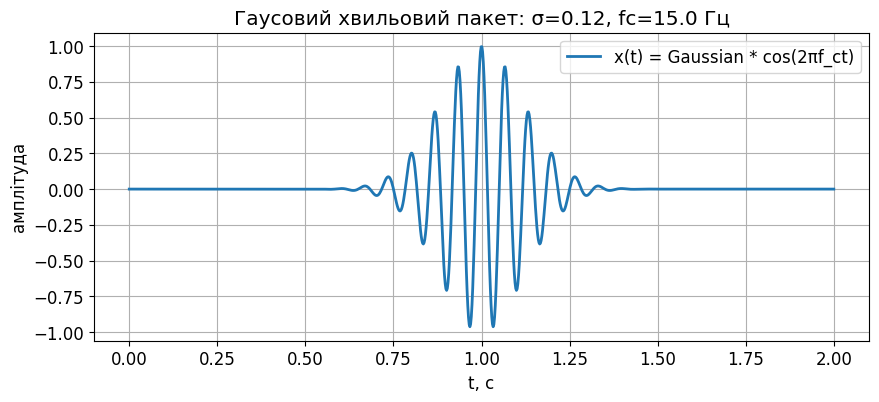

In [ ]:
sigma = 0.12
fc = 15.0

packet = np.exp(-((t-t0)**2)/(2*sigma*sigma)) * np.cos(2*np.pi*fc*t)

fig, ax = plt.subplots(figsize=(10, 4))
ax.plot(t, packet, label="x(t) = Gaussian * cos(2πf_ct)")
ax.set_title(f"Гаусовий хвильовий пакет: σ={sigma}, fc={fc} Гц")
ax.set_xlabel("t, c")
ax.set_ylabel("амплітуда")
ax.legend()
plt.show()

## 2.1 Дискретизація: від x(t) до x[n]

Дискретизація:
$$
x[n] = x(nT_s), \quad T_s=\frac{1}{F_s}
$$

Інтуїція теореми Найквіста–Шеннона:

- якщо сигнал має максимальну частоту $f_{\max}$, то **для коректного відновлення** треба  
  $$
  F_s > 2 f_{\max}
  $$

- якщо `Fs` замала — виникає **aliasing**: високі частоти “маскуються” під нижчі  

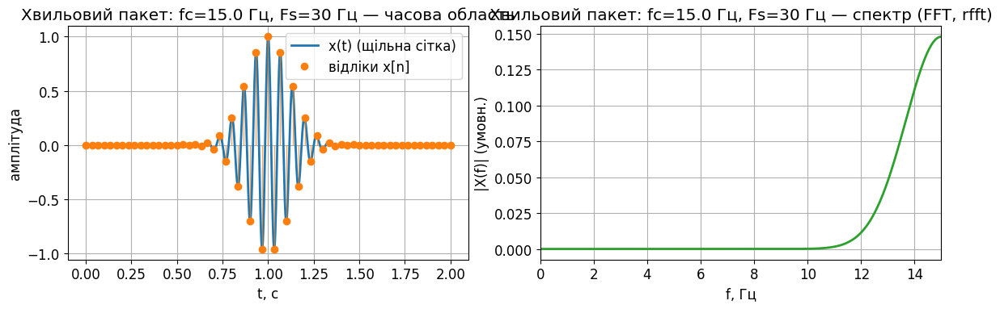

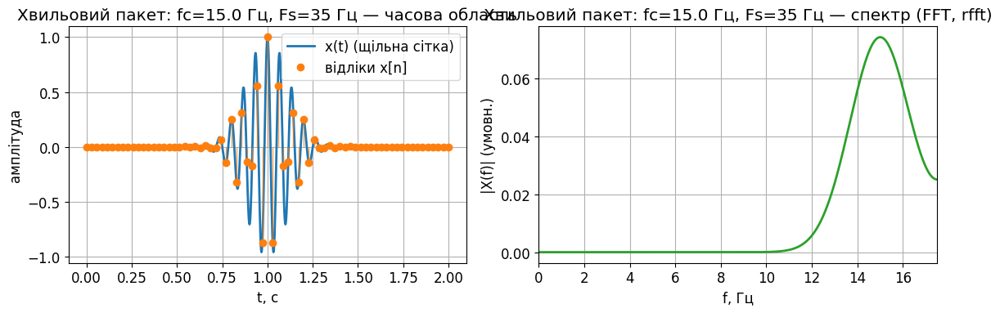

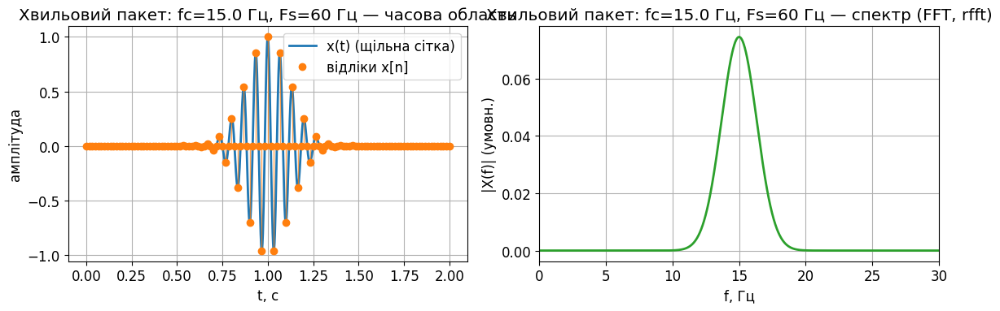

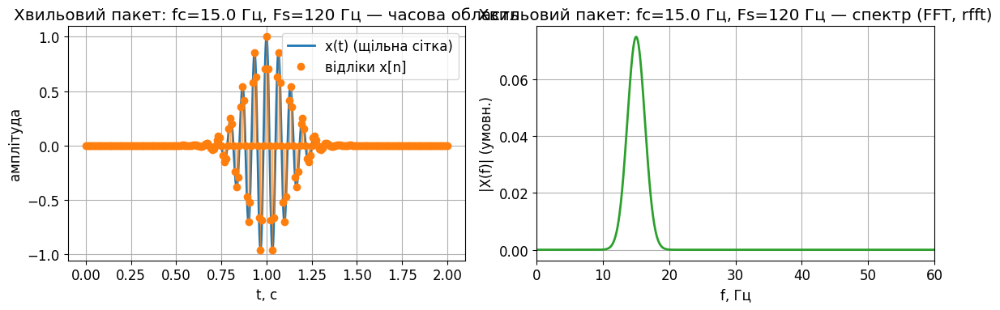

In [ ]:
x_t = packet  # з попереднього розділу

for Fs in [30, 35, 60, 120]:
    n = np.arange(int((t_max - t_min) * Fs) + 1)
    t_s = t_min + n / Fs - t0
    x_n = np.exp(-(t_s**2)/(2*sigma*sigma)) * np.cos(2*np.pi*fc*t_s)

    plot_time_and_spectrum(
        t, x_t,
        Fs=Fs, x_n=x_n, n=n,
        title=f"Хвильовий пакет: fc={fc} Гц, Fs={Fs} Гц"
    )

## 2.2 Aliasing: синуси, що дають однакові відліки

Для синусоїди:
$$
x[n] = \sin\left(2\pi \frac{f_0}{F_s} n + \varphi\right)
$$

Якщо замінити \(f_0\) на  
$$
f_0' = f_0 + kF_s
$$  
або  
$$
f_0' = |kF_s - f_0|,
$$  
то **відліки можуть збігатися**.

Практично:
$$
f_{\text{alias}} = \left|f_0 - \text{round}\left(\frac{f_0}{F_s}\right)F_s\right|
$$

Далі частота автоматично "зводиться" у діапазон  
$$
0 \le f \le F_s/2.
$$

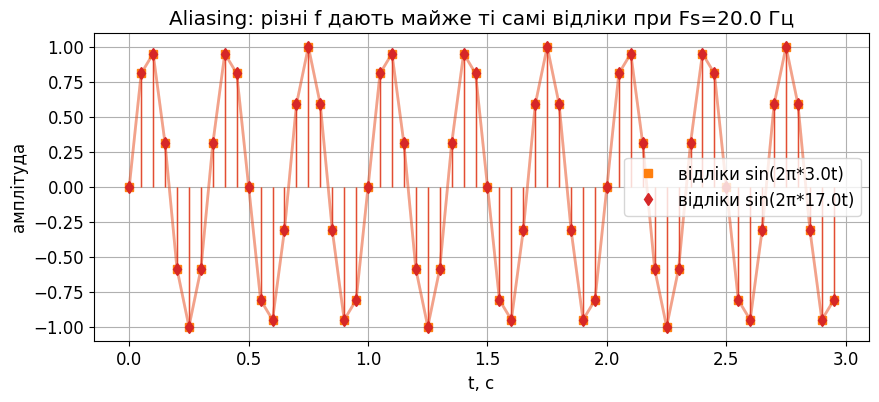

max|x_low - x_high| = 2.2648549702353193e-14


In [ ]:
Fs = 20.0      # Гц
f_low = 3.0    # Гц
f_high = Fs - f_low  # 17 Гц, "аліаситься" в 3 Гц для дискретних відліків

# дискретна вісь
n = np.arange(0, 60)
t_s = n / Fs

x_low = np.sin(2*np.pi*f_low*t_s)
x_high = -np.sin(2*np.pi*f_high*t_s)

fig, ax = plt.subplots(figsize=(10, 4))
stem(ax, t_s, x_low, color="C1", marker="s", label=f"відліки sin(2π*{f_low}t)")
ax.plot(t_s, x_low, color="C1", alpha=0.3)

stem(ax, t_s, x_high, color="C3", marker="d", label=f"відліки sin(2π*{f_high}t)")
ax.plot(t_s, x_high, color="C3", alpha=0.3)

ax.set_title(f"Aliasing: різні f дають майже ті самі відліки при Fs={Fs} Гц")
ax.set_xlabel("t, c")
ax.set_ylabel("амплітуда")
ax.legend()
plt.show()

# Порівняємо різницю
print("max|x_low - x_high| =", np.max(np.abs(x_low - x_high)))

## 2.3 Aliasing у спектрі

FFT дискретного сигналу покаже пік на **аліасній частоті**,  
а не на “справжній” аналоговій частоті, якщо частота дискретизації `Fs` замала.

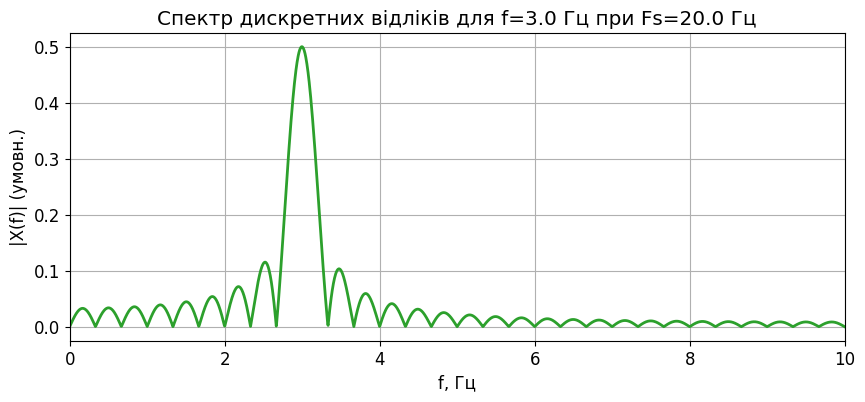

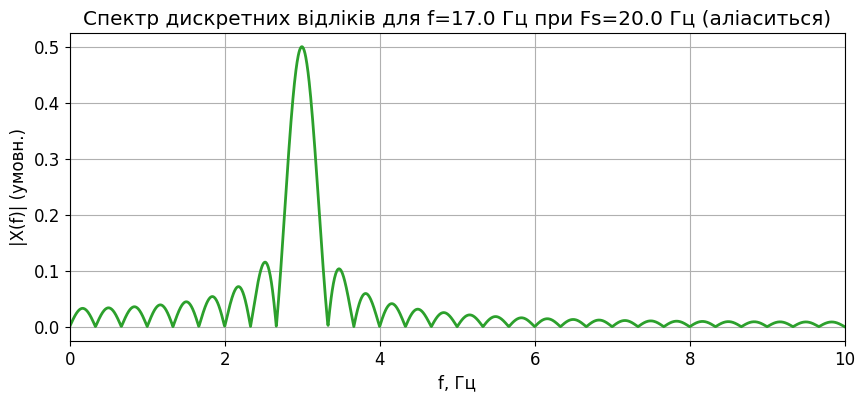

In [ ]:
def show_spectrum_only(x, Fs, title=""):
    f, mag = fft_spectrum(x, Fs, n_fft=4096)
    plt.figure(figsize=(10, 4))
    plt.plot(f, mag, color="C2")
    plt.title(title)
    plt.xlabel("f, Гц")
    plt.ylabel("|X(f)| (умовн.)")
    plt.xlim(0, Fs/2)
    plt.grid(True)
    plt.show()

show_spectrum_only(x_low, Fs, title=f"Спектр дискретних відліків для f={f_low} Гц при Fs={Fs} Гц")
show_spectrum_only(x_high, Fs, title=f"Спектр дискретних відліків для f={f_high} Гц при Fs={Fs} Гц (аліаситься)")

## 2.4 Недодискретизація: хвильовий пакет

Хвильовий пакет має спектральний вміст навколо $f_c$, але через огинаючу має також “хвости”.  
Якщо `Fs` недостатня, частина спектра “загорнеться” назад ➝ форма сигналу після відбору відліків може вводити в оману.

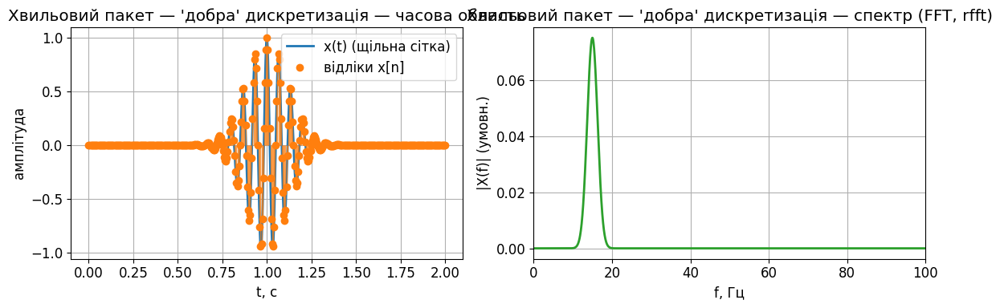

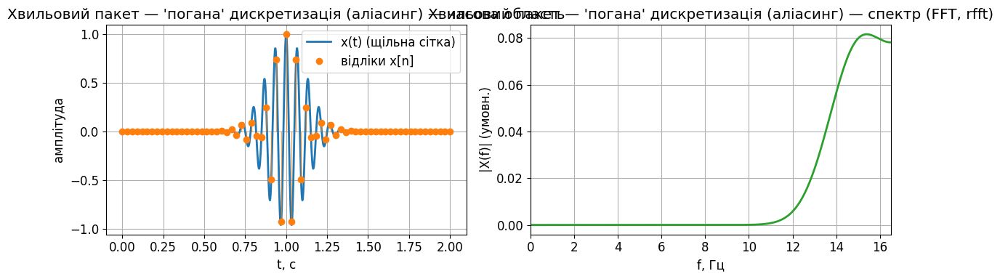

In [ ]:
Fs_good = 200  # добре (набагато більше 2*fc)
Fs_bad  = 33   # погано для fc=15 (на межі Найквіста)

def sample_packet(Fs):
    n = np.arange(int((t_max - t_min) * Fs) + 1)
    t_s = t_min + n / Fs - t0
    x_n = np.exp(-(t_s**2)/(2*sigma*sigma)) * np.cos(2*np.pi*fc*t_s)
    return n, t_s, x_n

n_g, tsg, xg = sample_packet(Fs_good)
n_b, tsb, xb = sample_packet(Fs_bad)

plot_time_and_spectrum(t, packet, Fs=Fs_good, x_n=xg, n=n_g, title="Хвильовий пакет — 'добра' дискретизація")
plot_time_and_spectrum(t, packet, Fs=Fs_bad,  x_n=xb, n=n_b, title="Хвильовий пакет — 'погана' дискретизація (аліасинг)")

## Підсумок (Розділ 2)

- Дискретизація перетворює $x(t)$ у $x[n]$ і робить сигнал придатним для цифрової обробки.
- Якщо `Fs` недостатня, виникає **aliasing**: різні аналогові частоти можуть давати однакові відліки.
- Це видно і в часовій області (відліки), і в частотній (FFT-піки з’являються не на тих частотах).

### Міні-вправи
1. Підберіть частоти `f0`, які дають однакові відліки при фіксованому `Fs`.  
2. Змініть `fc` у хвильовому пакеті і підберіть `Fs`, коли сигнал “ламається”.  
3. Візуально дослідіть, як зміна `sigma` впливає на ширину спектру.  

# 3. Квантування і шум квантування

Після дискретизації (перехід від $x(t)$ до $x[n]$) наступний крок оцифрування — **квантування амплітуди**.

- **Дискретний сигнал**: значення $x[n]$ можуть бути довільними (дійсними).
- **Цифровий сигнал**: значення $x_q[n]$ належать **скінченній множині рівнів**.

Квантування завжди вносить похибку:

$$
e[n] = x_q[n] - x[n].
$$

Цю похибку часто інтерпретують як **шум квантування**. У цьому розділі ми:
1) реалізуємо рівномірне квантування,
2) подивимося на похибку в часі,
3) оцінимо її статистику,
4) дослідимо спектр і SNR як функцію бітності.

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def uniform_quantize(x, bits, x_min=-1.0, x_max=1.0, mode="midtread", clip=True):
    """
    Рівномірне квантування в діапазоні [x_min, x_max].

    bits: кількість біт
    mode:
      - "midtread": рівень 0 існує (типово для округлення), корисно для сигналів з нулем
      - "midrise" : перехід через 0 без рівня 0 (рідше в демо)

    Повертає:
      xq: квантизований сигнал
      e : похибка квантування
      Delta: крок квантування
      levels: масив рівнів (для довідки)
    """
    x = np.asarray(x, dtype=float)
    L = 2**bits  # кількість рівнів

    if clip:
        xc = np.clip(x, x_min, x_max)
    else:
        xc = x.copy()

    # Крок квантування (для повного діапазону)
    Delta = (x_max - x_min) / (L - 1) if mode == "midtread" else (x_max - x_min) / L

    if mode == "midtread":
        # Рівні включають кінці; округлення до найближчого рівня
        # Переносимо в індекси рівнів 0..L-1
        idx = np.round((xc - x_min) / Delta)
        idx = np.clip(idx, 0, L-1)
        xq = x_min + idx * Delta
        levels = x_min + np.arange(L) * Delta
    elif mode == "midrise":
        # Рівні посередині інтервалів
        # idx 0..L-1 відповідає рівню x_min + (idx+0.5)*Delta
        Delta = (x_max - x_min) / L
        idx = np.floor((xc - x_min) / Delta)
        idx = np.clip(idx, 0, L-1)
        xq = x_min + (idx + 0.5) * Delta
        levels = x_min + (np.arange(L) + 0.5) * Delta
    else:
        raise ValueError("mode must be 'midtread' or 'midrise'")

    e = xq - x
    return xq, e, Delta, levels

def mse(x, y):
    x = np.asarray(x); y = np.asarray(y)
    return np.mean((x - y)**2)

def snr_db(signal, noise):
    Ps = np.mean(signal**2)
    Pn = np.mean(noise**2)
    return 10*np.log10(Ps / Pn) if Pn > 0 else np.inf

def plot_quantization(t, x, xq, e, title=""):
    fig, axes = plt.subplots(2, 1, figsize=(12, 6), sharex=True)
    ax0, ax1 = axes

    ax0.plot(t, x, label="x[n] (оригінал)", color="C0")
    ax0.plot(t, xq, label="x_q[n] (квантизований)", color="C1", alpha=0.9)
    ax0.set_title(title + " — сигнал і квантизована версія")
    ax0.set_ylabel("амплітуда")
    ax0.legend()

    ax1.plot(t, e, label="e[n] = x_q[n] - x[n]", color="C3")
    ax1.axhline(0, color="k", linewidth=1, alpha=0.6)
    ax1.set_title(title + " — похибка квантування")
    ax1.set_xlabel("t, c")
    ax1.set_ylabel("похибка")
    ax1.legend()

    plt.tight_layout()
    plt.show()

def fft_mag(x, Fs, n_fft=4096):
    X = np.fft.rfft(x, n=n_fft)
    f = np.fft.rfftfreq(n_fft, d=1/Fs)
    mag = np.abs(X) / len(x)
    return f, mag

def plot_spectrum_compare(Fs, x, xq, e, title=""):
    f1, m1 = fft_mag(x, Fs)
    f2, m2 = fft_mag(xq, Fs)
    f3, m3 = fft_mag(e, Fs)

    fig, ax = plt.subplots(figsize=(12, 4))
    ax.plot(f1, m1, label="|X(f)|", color="C0")
    ax.plot(f2, m2, label="|Xq(f)|", color="C1", alpha=0.9)
    ax.plot(f3, m3, label="|E(f)|", color="C3", alpha=0.9)
    ax.set_xlim(0, Fs/2)
    ax.set_xlabel("f, Гц")
    ax.set_ylabel("амплітуда (умовн.)")
    ax.set_title(title + " — спектри (FFT)")
    ax.legend()
    ax.grid(True)
    plt.tight_layout()
    plt.show()

## 3.1 Рівномірне квантування: модель і крок

Нехай сигнал нормовано до діапазону $[x_{\min}, x_{\max}]$, наприклад $[-1, 1]$.

Для $b$ біт кількість рівнів $L = 2^b$.

Для "midtread" (рівень 0 існує) крок квантування приблизно:

$$
\Delta \approx \frac{x_{\max} - x_{\min}}{L-1}.
$$

Квантування можна розглядати як операцію округлення до найближчого рівня, а похибка квантування:

$$
e[n] = x_q[n] - x[n]
$$

лежить (за відсутності saturating/clip) приблизно в межах:

$$
-\frac{\Delta}{2} \le e[n] \le \frac{\Delta}{2}.
$$

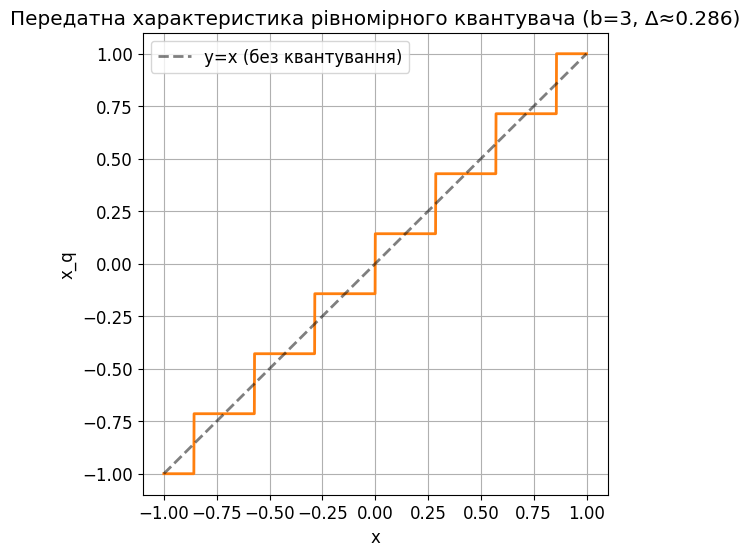

In [ ]:
# Передатна характеристика квантувача (x -> xq)
x_min, x_max = -1, 1
bits = 3
xx = np.linspace(x_min, x_max, 2000)
xq, e, Delta, levels = uniform_quantize(xx, bits, x_min=x_min, x_max=x_max, mode="midtread", clip=True)

plt.figure(figsize=(6, 6))
plt.plot(xx, xq, color="C1")
plt.plot(xx, xx, color="k", alpha=0.5, linestyle="--", label="y=x (без квантування)")
plt.title(f"Передатна характеристика рівномірного квантувача (b={bits}, Δ≈{Delta:.3f})")
plt.xlabel("x")
plt.ylabel("x_q")
plt.legend()
plt.grid(True)
plt.show()

## 3.2 Приклад: квантування синусоїди та похибка

Почнемо з простого сигналу — синусоїди, нормованої до $[-1, 1]$:

$$
x(t) = \sin(2\pi f_0 t).
$$

Квантування породжує похибку $e[n]$, яка:
- має обмежену амплітуду (приблизно $\pm \Delta/2$),
- часто виглядає як "шум", але може бути **корельованою** з сигналом (особливо для простих гармонік і малої кількості біт).

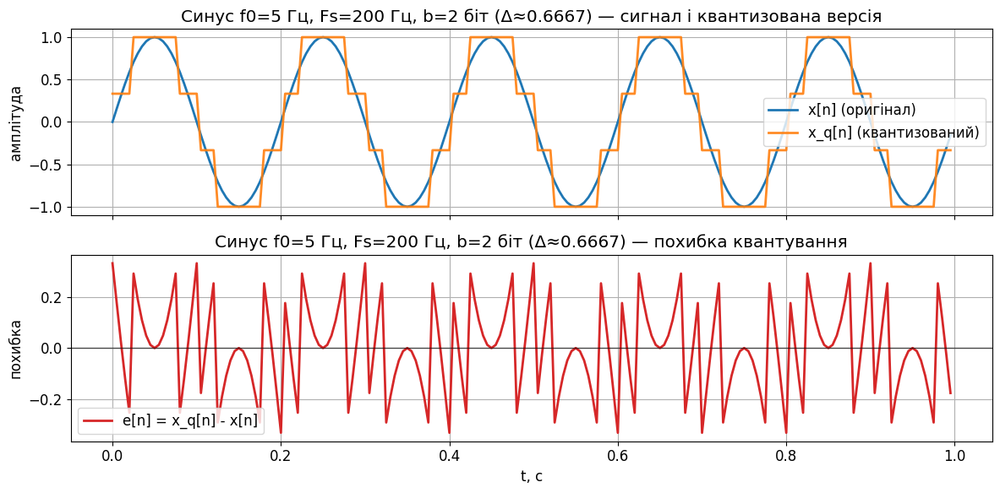

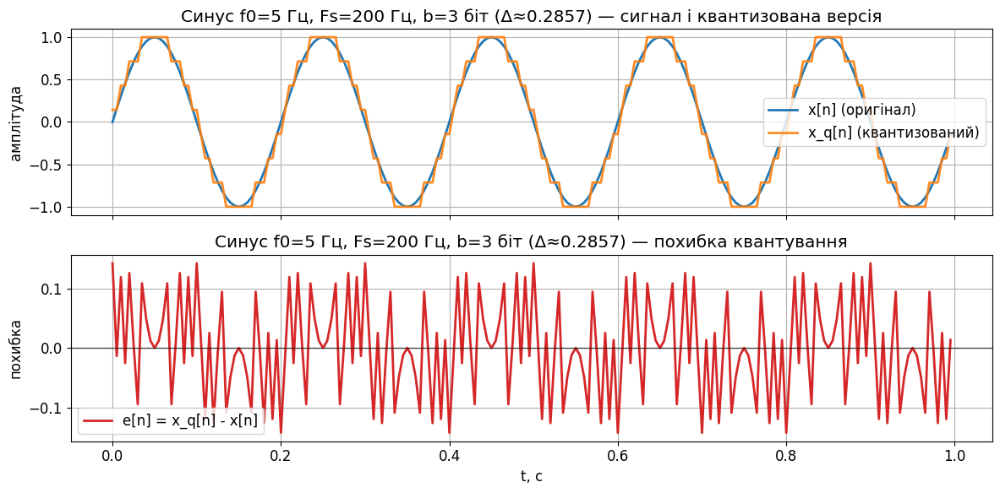

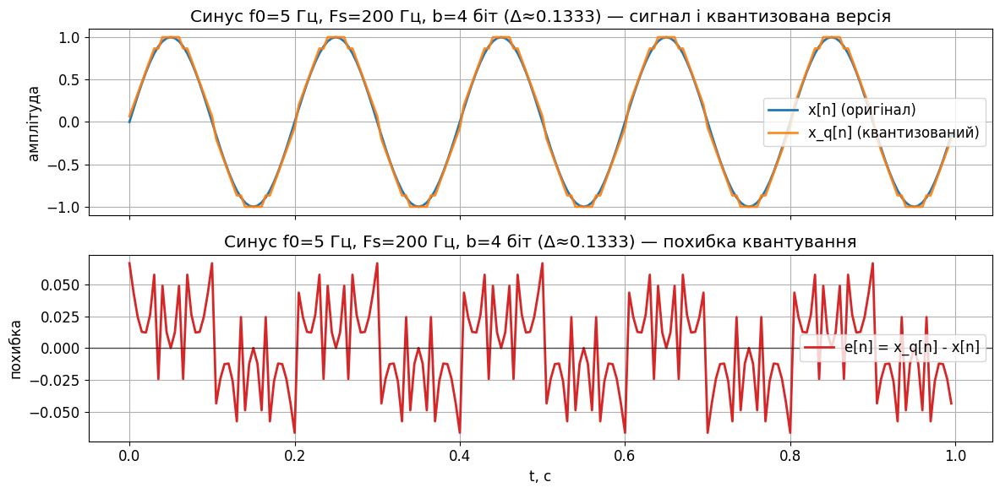

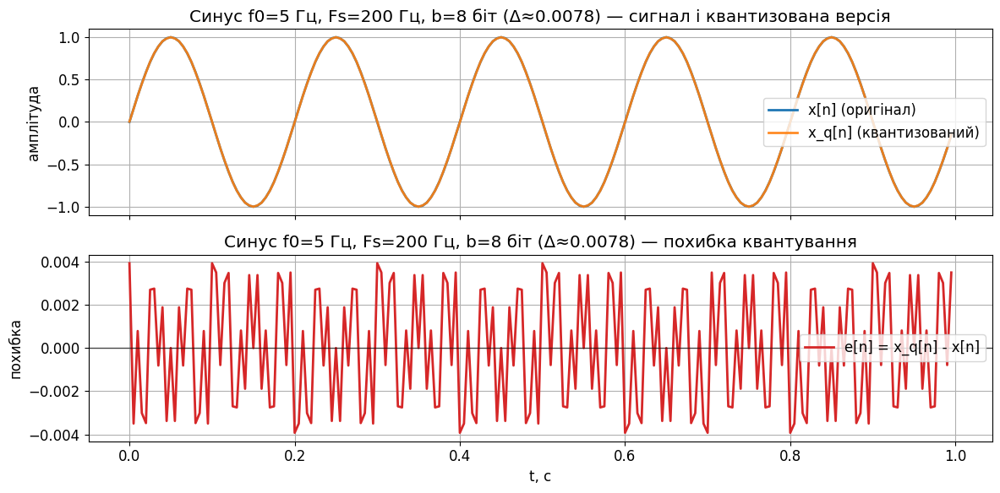

In [ ]:
Fs = 200
t = np.arange(0, 1.0, 1/Fs)
f0 = 5

x = np.sin(2*np.pi*f0*t)

for bits in [2, 3, 4, 8]:
    xq, e, Delta, _ = uniform_quantize(x, bits, x_min=-1, x_max=1, mode="midtread", clip=True)
    plot_quantization(t, x, xq, e, title=f"Синус f0={f0} Гц, Fs={Fs} Гц, b={bits} біт (Δ≈{Delta:.4f})")

## 3.3 Статистика похибки квантування та "модель білого шуму"

Часто використовують спрощену модель:

- похибка $e[n]$ приблизно рівномірно розподілена на $[-\Delta/2, \Delta/2]$,
- і приблизно некорельована з сигналом (за певних умов: "достатньо складний" сигнал, достатньо біт, або застосовано дізеринг).

Для рівномірного розподілу дисперсія:

$$
\mathrm{Var}(e) = \frac{\Delta^2}{12}.
$$

Ця формула корисна для оцінки шуму квантування і SNR.

Δ = 0.13333333333333333
Оцінка Var(e) з даних: 0.00146005406758599
Теорія Δ^2/12: 0.0014814814814814814


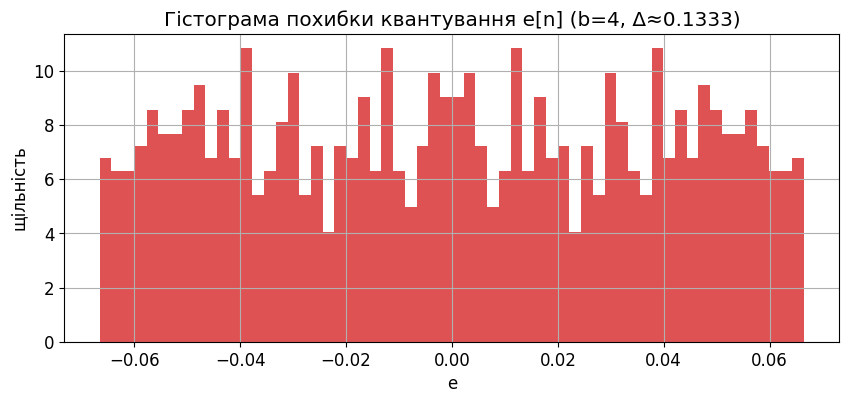

In [ ]:
Fs = 1000
t = np.arange(0, 1.0, 1/Fs)

# "складніший" сигнал: сума синусів + легка нелінійність (щоб зменшити регулярність)
x = 0.6*np.sin(2*np.pi*37*t) + 0.3*np.sin(2*np.pi*123*t + 0.1) + 0.1*np.sin(2*np.pi*211*t + 0.4)
x = np.tanh(1.2*x)  # легка нелінійність, лишаємо в [-1,1]

bits = 4
xq, e, Delta, _ = uniform_quantize(x, bits, x_min=-1, x_max=1, mode="midtread", clip=True)

print("Δ =", Delta)
print("Оцінка Var(e) з даних:", np.var(e))
print("Теорія Δ^2/12:", Delta**2/12)

plt.figure(figsize=(10, 4))
plt.hist(e, bins=60, density=True, alpha=0.8, color="C3")
plt.title(f"Гістограма похибки квантування e[n] (b={bits}, Δ≈{Delta:.4f})")
plt.xlabel("e")
plt.ylabel("щільність")
plt.grid(True)
plt.show()

## 3.4 SNR квантування та залежність від бітності

Для "доброї" моделі шуму квантування (рівномірний білий шум) існує класичний результат для синусоїди повної шкали:

$$
\mathrm{SNR}_{\mathrm{dB}} \approx 6.02\,b + 1.76.
$$

Тут $b$ — кількість біт.

У реальних демонстраціях:
- для малих $b$ і простих сигналів похибка може бути помітно **небілою** та **корельованою**,
- але тренд "кожен біт дає ~6 дБ" зазвичай добре видно.

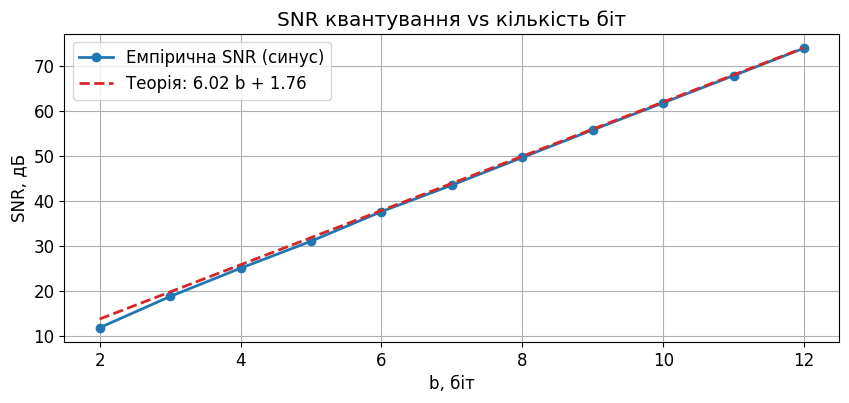

In [ ]:
Fs = 5000
t = np.arange(0, 1.0, 1/Fs)
f0 = 123.0

# синус майже full-scale, але не 1.0 щоб уникнути кліпінгу через округлення на межі
x = 0.98*np.sin(2*np.pi*f0*t)

bits_list = np.arange(2, 13)
snr_emp = []

for b in bits_list:
    xq, e, Delta, _ = uniform_quantize(x, b, x_min=-1, x_max=1, mode="midtread", clip=True)
    snr_emp.append(snr_db(x, e))

snr_emp = np.array(snr_emp)
snr_th = 6.02*bits_list + 1.76

plt.figure(figsize=(10, 4))
plt.plot(bits_list, snr_emp, "o-", label="Емпірична SNR (синус)", color="C0")
plt.plot(bits_list, snr_th, "--", label="Теорія: 6.02 b + 1.76", color="C3")
plt.title("SNR квантування vs кількість біт")
plt.xlabel("b, біт")
plt.ylabel("SNR, дБ")
plt.grid(True)
plt.legend()
plt.show()

## 3.5 Спектр квантувального шуму: білий чи структурований?

Модель "білий шум" не завжди працює для простих сигналів і малої бітності.

- Для синуса з малим $b$ похибка може мати гармоніки і виглядати як детерміноване спотворення.
- Для "складного" сигналу (або за наявності дізерингу) похибка часто ближча до білого шуму.

Далі порівняємо спектр похибки для:
1) чистого синуса,
2) "складнішого" сигналу.

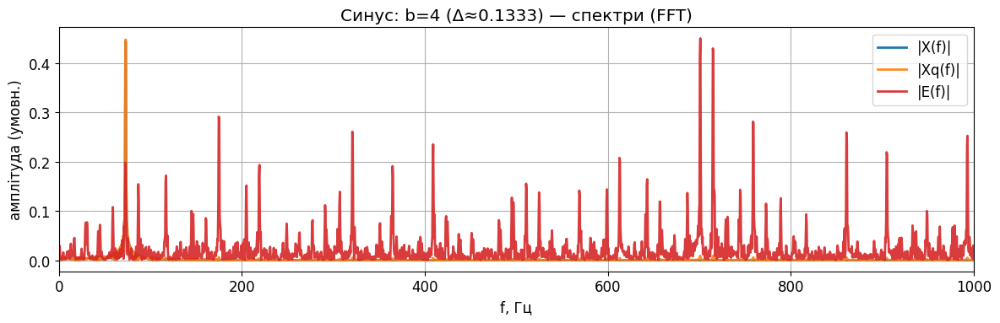

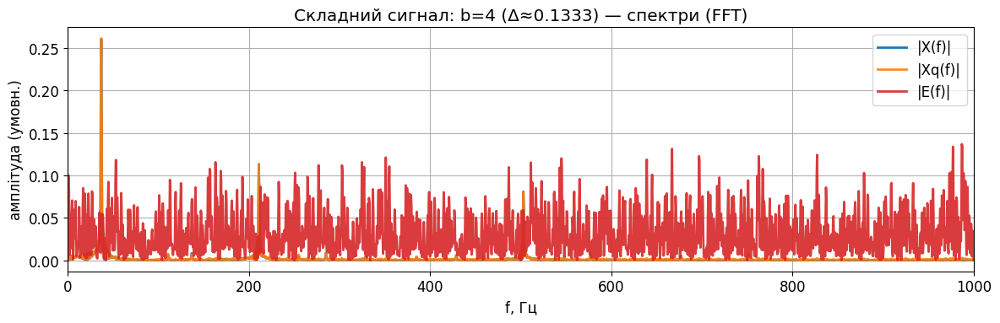

In [ ]:
Fs = 2000
t = np.arange(0, 1.0, 1/Fs)

# (1) Синус
x1 = 0.98*np.sin(2*np.pi*73*t)

# (2) Складніший сигнал
x2 = 0.55*np.sin(2*np.pi*37*t) + 0.25*np.sin(2*np.pi*211*t + 0.2) + 0.18*np.sin(2*np.pi*503*t + 1.0)
x2 = np.tanh(1.1*x2)

bits = 4

x1q, e1, Delta1, _ = uniform_quantize(x1, bits, x_min=-1, x_max=1, mode="midtread", clip=True)
x2q, e2, Delta2, _ = uniform_quantize(x2, bits, x_min=-1, x_max=1, mode="midtread", clip=True)

plot_spectrum_compare(Fs, x1, x1q, 50*e1, title=f"Синус: b={bits} (Δ≈{Delta1:.4f})")
plot_spectrum_compare(Fs, x2, x2q, 50*e2, title=f"Складний сигнал: b={bits} (Δ≈{Delta2:.4f})")

## 3.6 Дізеринг (опційно, але дуже повчально)

**Дізеринг** — додавання слабкого випадкового шуму перед квантуванням.

Ідея:
- зробити похибку квантування менш залежною від сигналу,
- перетворити регулярні спотворення на більш "шумоподібні".

Найпростіший варіант: додати шум, рівномірний на $[-\Delta/2, \Delta/2]$ перед квантуванням.

Порівняємо:
- квантування без дізерингу,
- квантування з дізерингом,
і подивимося на спектр похибки.

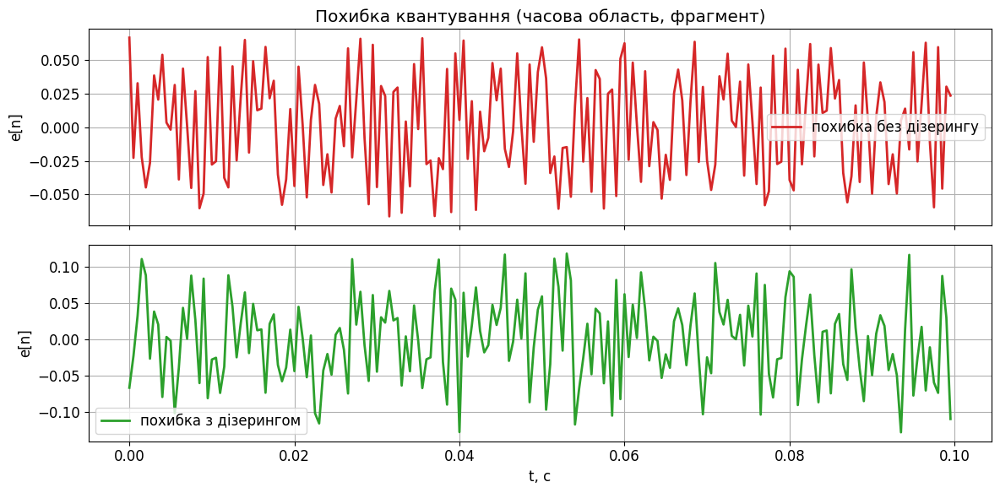

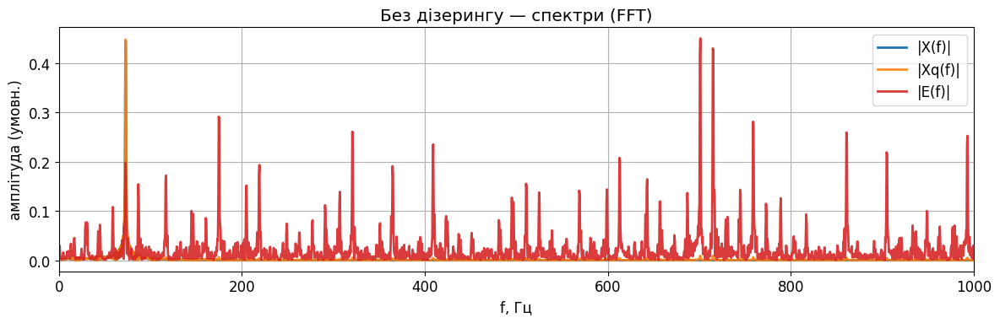

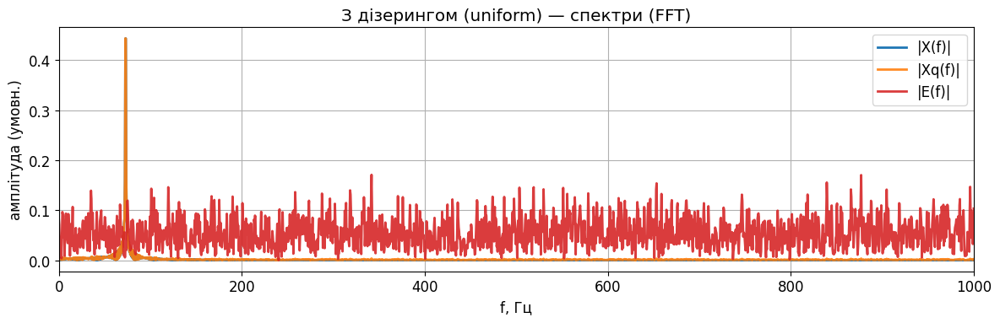

In [ ]:
Fs = 2000
t = np.arange(0, 1.0, 1/Fs)
x = 0.98*np.sin(2*np.pi*73*t)
bits = 4

# Без дізерингу
xq0, e0, Delta, _ = uniform_quantize(x, bits, x_min=-1, x_max=1, mode="midtread", clip=True)

# З дізерингом (uniform in [-Δ/2, Δ/2])
dither = (np.random.rand(len(x)) - 0.5) * Delta
x_d = x + dither
xq1, _, _, _ = uniform_quantize(x_d, bits, x_min=-1, x_max=1, mode="midtread", clip=True)
e1 = xq1 - x  # похибка відносно початкового "чистого" сигналу

# Часова область (малий фрагмент)
k = slice(0, 200)
fig, axes = plt.subplots(2, 1, figsize=(12, 6), sharex=True)

axes[0].plot(t[k], e0[k], label="похибка без дізерингу", color="C3")
axes[0].set_title("Похибка квантування (часова область, фрагмент)")
axes[0].set_ylabel("e[n]")
axes[0].legend()

axes[1].plot(t[k], e1[k], label="похибка з дізерингом", color="C2")
axes[1].set_xlabel("t, c")
axes[1].set_ylabel("e[n]")
axes[1].legend()
plt.tight_layout()
plt.show()

# Спектр
plot_spectrum_compare(Fs, x, xq0, 50*e0, title="Без дізерингу")
plot_spectrum_compare(Fs, x, xq1, 50*e1, title="З дізерингом (uniform)")

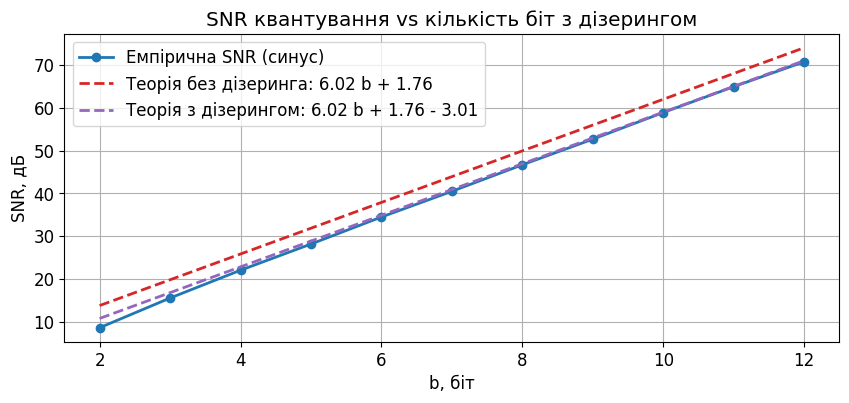

In [ ]:
Fs = 5000
t = np.arange(0, 1.0, 1/Fs)
f0 = 123.0

# синус майже full-scale, але не 1.0 щоб уникнути кліпінгу через округлення на межі
x = 0.98*np.sin(2*np.pi*f0*t)

bits_list = np.arange(2, 13)
snr_emp = []

for b in bits_list:
    xq0, e0, Delta, _ = uniform_quantize(x, b, x_min=-1, x_max=1, mode="midtread", clip=True)
    # З дізерингом (uniform in [-Δ/2, Δ/2])
    dither = (np.random.rand(len(x)) - 0.5) * Delta
    x_d = x + dither
    xq1, e1, _, _ = uniform_quantize(x_d, b, x_min=-1, x_max=1, mode="midtread", clip=True)
    e1 = xq1 - x  # похибка відносно початкового "чистого" сигналу
    snr_emp.append(snr_db(x, e1))

snr_emp = np.array(snr_emp)
snr_th = 6.02*bits_list + 1.76
snr_th_d = 6.02*bits_list + 1.76 - 3.01

plt.figure(figsize=(10, 4))
plt.plot(bits_list, snr_emp, "o-", label="Емпірична SNR (синус)", color="C0")
plt.plot(bits_list, snr_th, "--", label="Теорія без дізеринга: 6.02 b + 1.76", color="C3")
plt.plot(bits_list, snr_th_d, "--", label="Теорія з дізерингом: 6.02 b + 1.76 - 3.01", color="C4")
plt.title("SNR квантування vs кількість біт з дізерингом")
plt.xlabel("b, біт")
plt.ylabel("SNR, дБ")
plt.grid(True)
plt.legend()
plt.show()

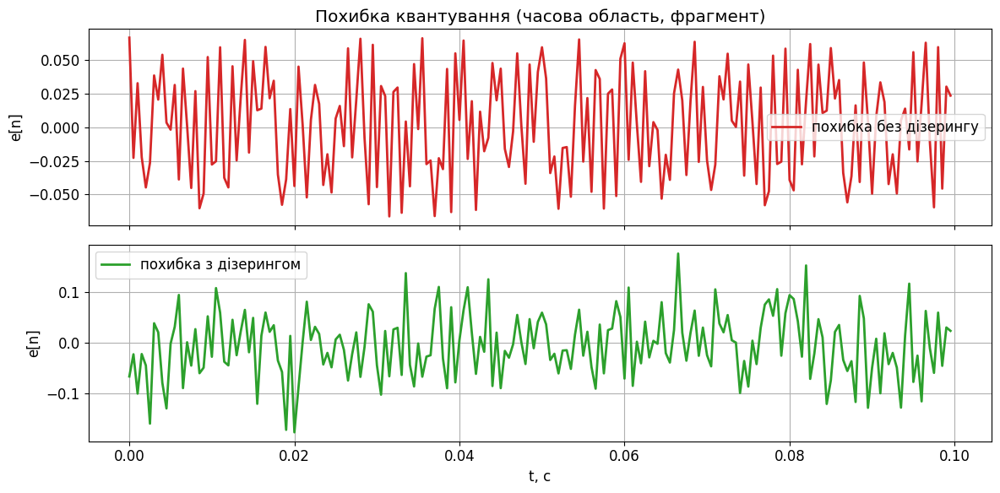

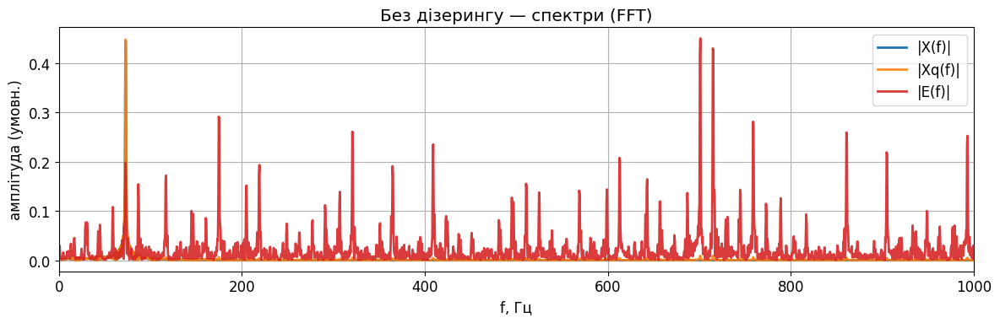

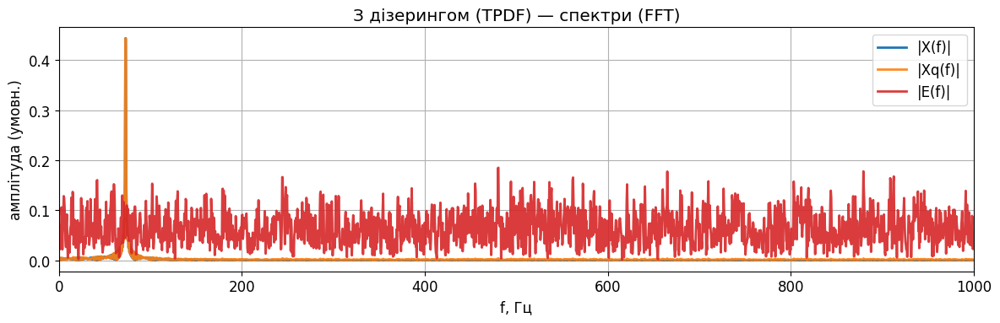

In [ ]:
Fs = 2000
t = np.arange(0, 1.0, 1/Fs)
x = 0.98*np.sin(2*np.pi*73*t)
bits = 4

# Без дізерингу
xq0, e0, Delta, _ = uniform_quantize(x, bits, x_min=-1, x_max=1, mode="midtread", clip=True)

# З дізерингом (TPDF)
dither = (np.random.rand(len(x)) - 0.5) + (np.random.rand(len(x)) - 0.5)
dither *= Delta
x_d = x + dither
xq1, _, _, _ = uniform_quantize(x_d, bits, x_min=-1, x_max=1, mode="midtread", clip=True)
e1 = xq1 - x  # похибка відносно початкового "чистого" сигналу

# Часова область (малий фрагмент)
k = slice(0, 200)
fig, axes = plt.subplots(2, 1, figsize=(12, 6), sharex=True)

axes[0].plot(t[k], e0[k], label="похибка без дізерингу", color="C3")
axes[0].set_title("Похибка квантування (часова область, фрагмент)")
axes[0].set_ylabel("e[n]")
axes[0].legend()

axes[1].plot(t[k], e1[k], label="похибка з дізерингом", color="C2")
axes[1].set_xlabel("t, c")
axes[1].set_ylabel("e[n]")
axes[1].legend()
plt.tight_layout()
plt.show()

# Спектр
plot_spectrum_compare(Fs, x, xq0, 50*e0, title="Без дізерингу")
plot_spectrum_compare(Fs, x, xq1, 50*e1, title="З дізерингом (TPDF)")

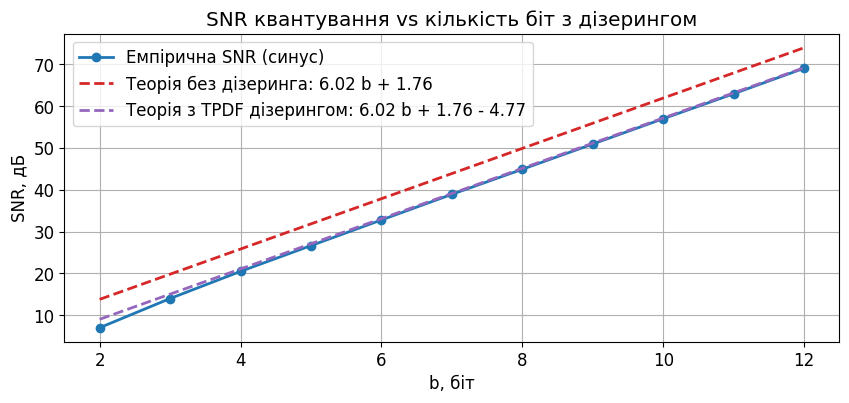

In [ ]:
Fs = 5000
t = np.arange(0, 1.0, 1/Fs)
f0 = 123.0

# синус майже full-scale, але не 1.0 щоб уникнути кліпінгу через округлення на межі
x = 0.98*np.sin(2*np.pi*f0*t)

bits_list = np.arange(2, 13)
snr_emp = []

for b in bits_list:
    xq0, e0, Delta, _ = uniform_quantize(x, b, x_min=-1, x_max=1, mode="midtread", clip=True)
    # З дізерингом (TPDF)
    dither = (np.random.rand(len(x)) - 0.5) + (np.random.rand(len(x)) - 0.5)
    dither *= Delta
    x_d = x + dither
    xq1, e1, _, _ = uniform_quantize(x_d, b, x_min=-1, x_max=1, mode="midtread", clip=True)
    e1 = xq1 - x  # похибка відносно початкового "чистого" сигналу
    snr_emp.append(snr_db(x, e1))

snr_emp = np.array(snr_emp)
snr_th = 6.02*bits_list + 1.76
snr_th_d = 6.02*bits_list + 1.76 - 4.77

plt.figure(figsize=(10, 4))
plt.plot(bits_list, snr_emp, "o-", label="Емпірична SNR (синус)", color="C0")
plt.plot(bits_list, snr_th, "--", label="Теорія без дізеринга: 6.02 b + 1.76", color="C3")
plt.plot(bits_list, snr_th_d, "--", label="Теорія з TPDF дізерингом: 6.02 b + 1.76 - 4.77", color="C4")
plt.title("SNR квантування vs кількість біт з дізерингом")
plt.xlabel("b, біт")
plt.ylabel("SNR, дБ")
plt.grid(True)
plt.legend()
plt.show()

## Підсумок (Розділ 3)

1) Квантування замінює дійсні значення $x[n]$ на найближчі рівні $x_q[n]$.

2) Похибка квантування $e[n] = x_q[n] - x[n]$:
- має амплітуду порядку $\pm \Delta/2$ (без кліпінгу),
- може бути схожа на шум, але інколи проявляється як регулярне спотворення (особливо для синуса при малому $b$).

3) У "ідеальній" моделі шуму квантування:

$$
\mathrm{Var}(e) \approx \frac{\Delta^2}{12}.
$$

4) Для синуса повної шкали:

$$
\mathrm{SNR}_{\mathrm{dB}} \approx 6.02\,b + 1.76.
$$

5) Дізеринг може "декорелювати" похибку від сигналу, перетворюючи гармонічні спотворення на більш шумоподібні компоненти.

# 4. Відновлення сигналу по відліках (інтерполяція)

Мета розділу — показати, як різні методи інтерполяції відновлюють неперервний сигнал з дискретних відліків, та порівняти їх якісно і кількісно.

Методи, які розглядаємо:
- **4.1 Кусково-стала (ZOH)** — модель ЦАП нульового порядку.
- **4.2 Лінійна інтерполяція** — простий і стабільний baseline.
- **4.3 Кубічний сплайн** — $C^2$-гладкий підхід із природними або заданими крайовими умовами.
- **4.4 Тригонометрична інтерполяція**:
  - **4.4.1 Sinc (Шеннон)** — ідеальна для смуговообмежених сигналів, нескінчечний ядровий фільтр.
  - **4.4.2 Zero-padding у DFT/IDFT** — періодична інтерполяція тригонометричним поліномом.

Сигнали для тесту:
- **Гаусоїда** (гладкий, локалізований; очікуємо експоненційно малу похибку для тригонометричної інтерполяції).
- **Гаусовий хвильовий пакет** (гладкий, вузькосмуговий).
- **Прямокутний імпульс** (розрив → ряби/перерегулювання).
- **Трикутник** (кусково-лінійний, кутові точки зламу).

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d, CubicSpline

plt.rcParams.update({
    "figure.figsize": (10, 4),
    "axes.grid": True,
    "lines.linewidth": 2,
    "font.size": 12
})

def mse(x, y):
    """Середньоквадратична похибка."""
    x = np.asarray(x); y = np.asarray(y)
    return np.mean((x - y)**2)

def max_err(x, y):
    """Максимальна абсолютна похибка."""
    x = np.asarray(x); y = np.asarray(y)
    return np.max(np.abs(x - y))

def zoh_interpolate(t_s, x_n, t_new):
    """
    Кусково-стала інтерполяція (Zero-Order Hold).
    Для кожного t_new повертаємо значення попереднього вузла.
    """
    t_s = np.asarray(t_s); x_n = np.asarray(x_n); t_new = np.asarray(t_new)
    idx = np.searchsorted(t_s, t_new, side='right') - 1
    idx = np.clip(idx, 0, len(x_n) - 1)
    return x_n[idx]

def sinc_interpolate_uniform(x_n, Fs, t_new, t0=0.0, L=20):
    """
    Sinc-інтерполяція (Шеннон) для рівномірної сітки t_n = t0 + n/Fs.
    Ядро обрізається до 2L+1 сусідів навколо кожного t_new.
    """
    x_n = np.asarray(x_n)
    t_new = np.asarray(t_new)
    n_star = (t_new - t0) * Fs
    n0 = np.floor(n_star).astype(int)

    out = np.zeros_like(t_new, dtype=float)
    for k in range(-L, L + 1):
        idx = n0 + k
        valid = (idx >= 0) & (idx < len(x_n))
        nn = idx[valid]
        s = n_star[valid] - nn
        w = np.sinc(s)  # sin(pi*s)/(pi*s)
        out[valid] += x_n[nn] * w
    return out

def fourier_interp_zero_padding(x_n, up, real=True):
    """
    Періодична тригонометрична інтерполяція через доповнення спектра нулями.
    Вхід: x_n (N відліків одного періоду), up — цілий фактор апсемплінгу.
    Вихід: x_up довжини M=N*up (періодично інтерпольовані відліки).
    """
    x_n = np.asarray(x_n)
    N = len(x_n)
    M = N * up

    if real:
        # Реально-значний сигнал: rfft/irfft з коректною довжиною частотного вектора
        X = np.fft.rfft(x_n)
        K_up = M // 2 + 1
        X_up = np.zeros(K_up, dtype=complex)
        copy_len = min(len(X), K_up)
        X_up[:copy_len] = X[:copy_len]
        x_up = np.fft.irfft(X_up, n=M)
        return x_up

    # Загальний комплексний випадок (fft/ifft + центроване нульове доповнення)
    X = np.fft.fft(x_n)
    X_shift = np.fft.fftshift(X)
    X_up_shift = np.zeros(M, dtype=complex)
    start = M // 2 - len(X_shift) // 2
    X_up_shift[start:start + len(X_shift)] = X_shift
    X_up = np.fft.ifftshift(X_up_shift)
    x_up = np.fft.ifft(X_up)
    return x_up

def fourier_interp_zero_padding_fixed(x_n, Fs, up):
    """
    Періодична тригонометрична інтерполяція через zero-padding у частотній області.

    Вхід:
      x_n : масив довжини N — один період періодичного сигналу
      Fs  : частота дискретизації для x_n
      up  : цілий коефіцієнт апсемплінгу (нових відліків буде N*up за той самий період)

    Вихід:
      t_up : часова вісь довжини M=N*up з кроком Ts/up
      x_up : інтерпольовані відліки (періодична реконструкція без зсуву і з правильною амплітудою)
    """
    x_n = np.asarray(x_n)
    N = x_n.size
    M = N * up
    Ts = 1.0 / Fs

    # RFFT (нормування як у NumPy: fft без 1/N, ifft з 1/M)
    X = np.fft.rfft(x_n)            # довжина K = N//2 + 1
    K = X.size
    K_up = M // 2 + 1               # цільова довжина RFFT для M
    X_up = np.zeros(K_up, dtype=complex)

    # Копіюємо спільну частину спектра
    copy_len = min(K, K_up)
    X_up[:copy_len] = X[:copy_len]

    # Якщо N парне (є Nyquist-бін) і M також парне (буде Nyquist-бін):
    # Nyquist-бін (останній у rfft) відповідає чисто дійсній частоті Fs/2 і не дублюється.
    # Ми вже скопіювали його як є (в межах copy_len).

    # ***** ВАЖЛИВО: компенсуємо різницю нормувань (N -> M) *****
    # irfft робить масштаб 1/M, тоді як вихідні X відповідали 1/N.
    # Щоб амплітуда збереглася, масштабуємо спектр на up = M/N.
    X_up *= (M / N)

    # Зворотне перетворення довжини M
    x_up = np.fft.irfft(X_up, n=M)

    # Правильна рівномірна часова вісь з кроком Ts/up
    t_up = (np.arange(M) * Ts) / up

    return t_up, x_up

In [ ]:
def plot_compare(t_dense, x_dense, curves, title="", t_zoom=None):
    """
    Візуалізація: еталон (щільна сітка) + набір інтерпольованих кривих.
    curves: список (label, t_new, x_new, color).
    """
    fig, ax = plt.subplots(figsize=(12, 4))
    ax.plot(t_dense, x_dense, color="k", linewidth=2, alpha=0.6, label="еталон (щільна сітка)")
    for (label, tt, xx, color) in curves:
        ax.plot(tt, xx, color=color, label=label, alpha=0.95)

    ax.set_title(title)
    ax.set_xlabel("t, c")
    ax.set_ylabel("амплітуда")
    ax.legend()
    ax.grid(True)
    if t_zoom is not None:
        ax.set_xlim(*t_zoom)
    plt.tight_layout()
    plt.show()

In [ ]:
def gaussian(t, sigma):
    """Гаусоїда: exp(-t^2/(2*sigma^2))."""
    return np.exp(-t**2 / (2 * sigma**2))

def gauss_packet(t, sigma, fc):
    """Гаусовий хвильовий пакет: Gaussian * cos(2π f_c t)."""
    return np.exp(-t**2 / (2 * sigma**2)) * np.cos(2 * np.pi * fc * t)

def rect_pulse(t, width):
    """Прямокутний імпульс: 1 на |t|<=width/2, 0 інакше."""
    return (np.abs(t) <= width / 2).astype(float)

def triangle(t, width):
    """Симетричний трикутник ширини width і висотою 1 (пік у t=0)."""
    return np.clip(1 - 2 * np.abs(t) / width, 0, 1)

## 4.0 Налаштування експерименту

- "Еталонний" неперервний сигнал генеруємо на **щільній сітці** $t$ (імітуємо неперервність).
- Створюємо **дискретні відліки** з періодом $T_s = 1/F_s$ на проміжку $[t_{\min}, t_{\max}]$.
- Відновлюємо сигнал різними методами на щільній сітці $t$ та порівнюємо з еталоном.

Параметри за замовчуванням:
- $t_{\min}=-1$, $t_{\max}=1$, щільність еталону $N_{\text{cont}}=20{,}000$.
- Типові частоти дискретизації: $F_s \in \{50, 80, 160\}$ Гц (міняємо під приклади).

In [ ]:
# Базові межі часу і щільна сітка "еталону"
t_min, t_max = -1.0, 1.0
N_cont = 20000
t_dense = np.linspace(t_min, t_max, N_cont)

def sample_on_grid(x_of_t, Fs, t_min=-1.0, t_max=1.0, t0=None):
    """
    x_of_t: callable(t) -> x(t) на неперервному часі
    Fs: частота дискретизації
    t0: фазовий зсув сітки; якщо None, починаємо з t_min
    Повертає:
      t_dense, x_dense, t_s, x_n
    """
    if t0 is None:
        # Сітка відліків починається в t_min
        n = np.arange(int(np.floor((t_max - t_min) * Fs)) + 1)
        t_s = t_min + n / Fs
    else:
        # Сітка зміщена так, щоб t0 був n=0
        n0 = int(np.floor((t_min - t0)*Fs))
        n1 = int(np.ceil((t_max - t0)*Fs))
        n = np.arange(n0, n1+1)
        t_s = t0 + n / Fs

    x_dense = x_of_t(t_dense)
    x_n = x_of_t(t_s)

    return t_dense, x_dense, t_s, x_n

## 4.1 Кусково-стала інтерполяція (Zero-Order Hold, ZOH)

Ідея: кожен відлік утримується сталим до наступного моменту семплування.

$$
\hat{x}_{\mathrm{ZOH}}(t) = \sum_{n} x[n] \cdot \mathbf{1}_{[nT_s, (n+1)T_s)}(t).
$$

- Переваги: надзвичайна простота, відповідає базовому ЦАП нульового порядку.
- Недоліки: "сходинки", погана апроксимація похідних, висока похибка на гладких сигналах.

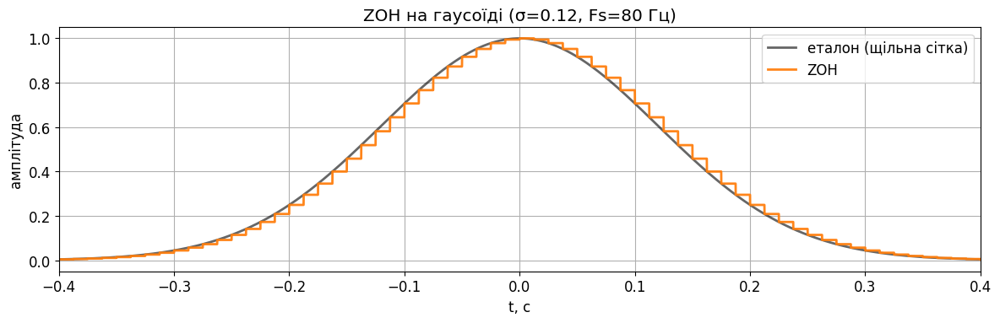

Гаусоїда (ZOH): MSE= 0.00019216906592955745  | max|e|= 0.06289494007956165


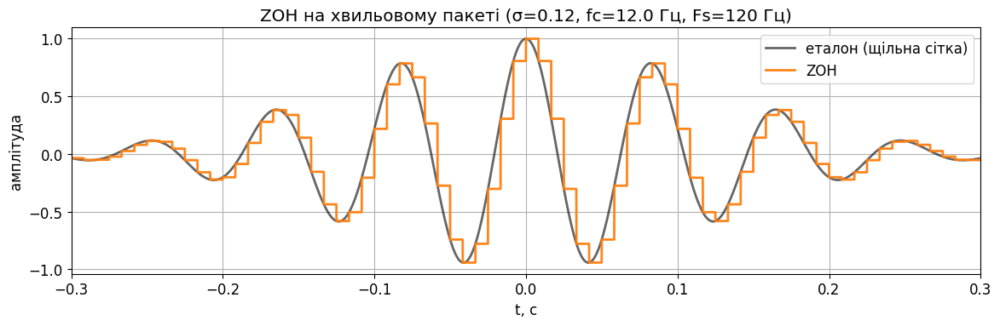

Пакет (ZOH): MSE= 0.006898462738607041  | max|e|= 0.6050363285990281


In [ ]:
# Приклад 1: Гаусоїда
sigma = 0.12
Fs = 80
t_dense, x_dense, t_s, x_n = sample_on_grid(lambda tt: gaussian(tt, sigma), Fs, t_min, t_max)

x_zoh = zoh_interpolate(t_s, x_n, t_dense)

plot_compare(
    t_dense, x_dense,
    curves=[("ZOH", t_dense, x_zoh, "C1")],
    title=f"ZOH на гаусоїді (σ={sigma}, Fs={Fs} Гц)",
    t_zoom=(-0.4, 0.4)
)
print("Гаусоїда (ZOH): MSE=", mse(x_dense, x_zoh), " | max|e|=", max_err(x_dense, x_zoh))

# Приклад 2: Гаусовий хвильовий пакет
sigma_p, fc = 0.12, 12.0
Fs = 120
t_dense, x_dense, t_s, x_n = sample_on_grid(lambda tt: gauss_packet(tt, sigma_p, fc), Fs, t_min, t_max)
x_zoh = zoh_interpolate(t_s, x_n, t_dense)

plot_compare(
    t_dense, x_dense,
    curves=[("ZOH", t_dense, x_zoh, "C1")],
    title=f"ZOH на хвильовому пакеті (σ={sigma_p}, fc={fc} Гц, Fs={Fs} Гц)",
    t_zoom=(-0.3, 0.3)
)
print("Пакет (ZOH): MSE=", mse(x_dense, x_zoh), " | max|e|=", max_err(x_dense, x_zoh))

## 4.2 Лінійна інтерполяція

З’єднуємо сусідні відліки відрізками прямих. Це $C^0$-неперервність, але похідна має розриви у вузлах.

- Переваги: простота, відсутність "перерегулювань" біля стрибків (на відміну від сплайнів).
- Недоліки: "зламана" форма на гладких сигналах, повільніша збіжність на гладких функціях.

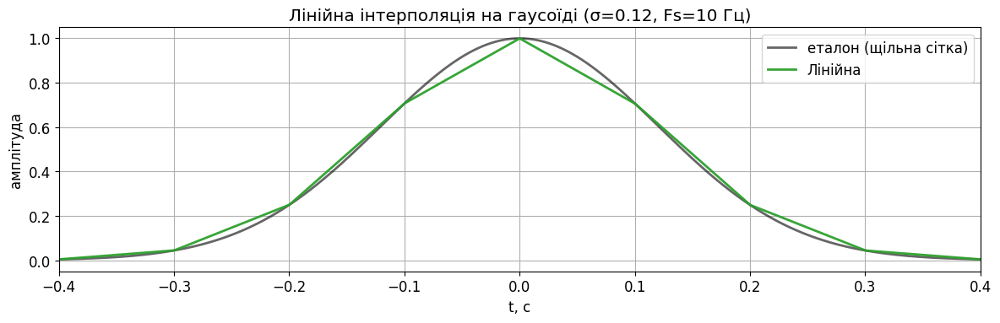

Гаусоїда (Linear): MSE= 0.00029729220451654405  | max|e|= 0.06411461097081528


In [ ]:
# Гаусоїда
sigma = 0.12
Fs = 10
t_dense, x_dense, t_s, x_n = sample_on_grid(lambda tt: gaussian(tt, sigma), Fs, t_min, t_max)

linear = interp1d(t_s, x_n, kind="linear", bounds_error=False, fill_value="extrapolate")
x_lin = linear(t_dense)

plot_compare(
    t_dense, x_dense,
    curves=[("Лінійна", t_dense, x_lin, "C2")],
    title=f"Лінійна інтерполяція на гаусоїді (σ={sigma}, Fs={Fs} Гц)",
    t_zoom=(-0.4, 0.4)
)
print("Гаусоїда (Linear): MSE=", mse(x_dense, x_lin), " | max|e|=", max_err(x_dense, x_lin))

## 4.3 Кубічний сплайн (SciPy `CubicSpline`)

Кубічний сплайн забезпечує $C^2$-гладкість між вузлами. Важливий вибір крайових умов:
- **Natural** ($x''=0$ на краях) — за замовчуванням у нашій демонстрації.
- **Clamped** (задані похідні) — якщо відома фізична модель країв.
- **Not-a-knot** — ще один поширений варіант.

Переваги: висока гладкість, добра точність на гладких сигналів.  
Недоліки: можливі "перерегулювання" біля розривів (ефект, подібний до ряби).

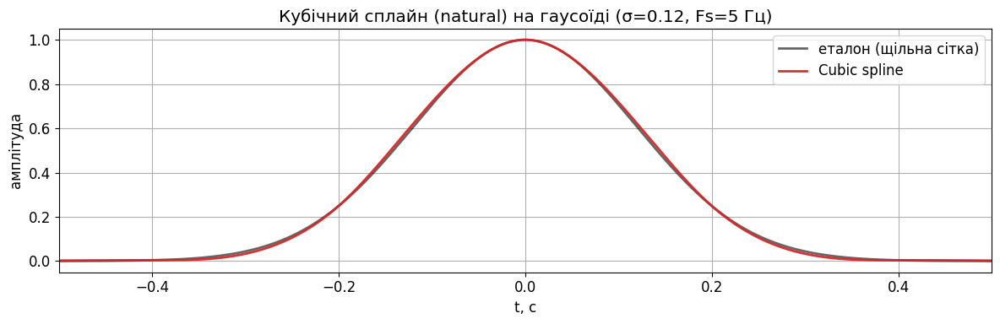

Гаусоїда (Cubic spline): MSE= 2.864768096164938e-05  | max|e|= 0.015267402411691555


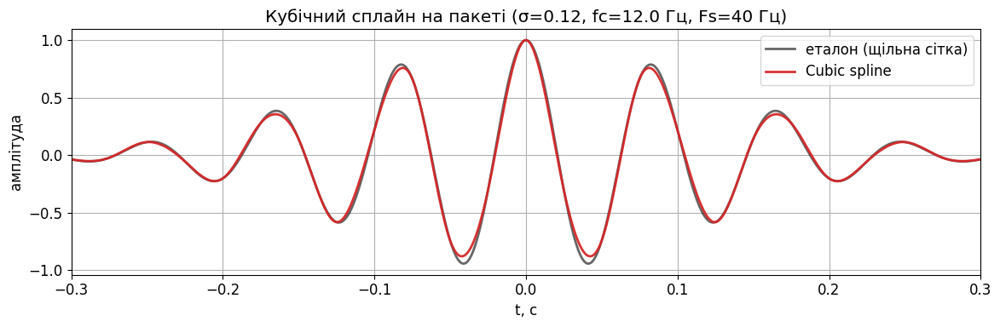

Пакет (Cubic spline): MSE= 0.00017577700697378755  | max|e|= 0.07734954498628155


In [ ]:
# Гаусоїда
sigma = 0.12
Fs = 5
t_dense, x_dense, t_s, x_n = sample_on_grid(lambda tt: gaussian(tt, sigma), Fs, t_min, t_max)

cs = CubicSpline(t_s, x_n, bc_type="natural")
x_spl = cs(t_dense)

plot_compare(
    t_dense, x_dense,
    curves=[("Cubic spline", t_dense, x_spl, "C3")],
    title=f"Кубічний сплайн (natural) на гаусоїді (σ={sigma}, Fs={Fs} Гц)",
    t_zoom=(-0.5, 0.5)
)
print("Гаусоїда (Cubic spline): MSE=", mse(x_dense, x_spl), " | max|e|=", max_err(x_dense, x_spl))

# Хвильовий пакет
sigma_p, fc = 0.12, 12.0
Fs = 40
t_dense, x_dense, t_s, x_n = sample_on_grid(lambda tt: gauss_packet(tt, sigma_p, fc), Fs, t_min, t_max)
cs = CubicSpline(t_s, x_n, bc_type="natural")
x_spl = cs(t_dense)

plot_compare(
    t_dense, x_dense,
    curves=[("Cubic spline", t_dense, x_spl, "C3")],
    title=f"Кубічний сплайн на пакеті (σ={sigma_p}, fc={fc} Гц, Fs={Fs} Гц)",
    t_zoom=(-0.3, 0.3)
)
print("Пакет (Cubic spline): MSE=", mse(x_dense, x_spl), " | max|e|=", max_err(x_dense, x_spl))

## 4.4 Тригонометрична інтерполяція

### 4.4.1 Sinc-інтерполяція (Шеннон)

Для рівномірних відліків $x[n] = x(nT_s)$ ідеальна реконструкція смуговообмеженого сигналу:

$$
\hat{x}(t) = \sum_{n=-\infty}^{\infty} x[n] \, \mathrm{sinc}\!\left(\frac{t}{T_s} - n\right),
\quad
\mathrm{sinc}(u) = \frac{\sin(\pi u)}{\pi u}.
$$

- Це **ідеальний** низькочастотний фільтр з нескінченним ядром.
- На практиці ядро **обрізають** до $|n - t/T_s| \le L$.

### 4.4.2 Zero-padding у DFT/IDFT

Нехай $x[n]$ — $N$ відліків **одного періоду** періодичного сигналу.  
Тоді інтерполяція тригонометричним поліномом виконується так:
1) FFT $N$-точок,
2) доповнення спектру нулями до $M = N \cdot \text{up}$,
3) IFFT довжини $M$.

Отримаємо $M$ рівномірних відліків одного й того самого періоду — **періодична інтерполяція**.

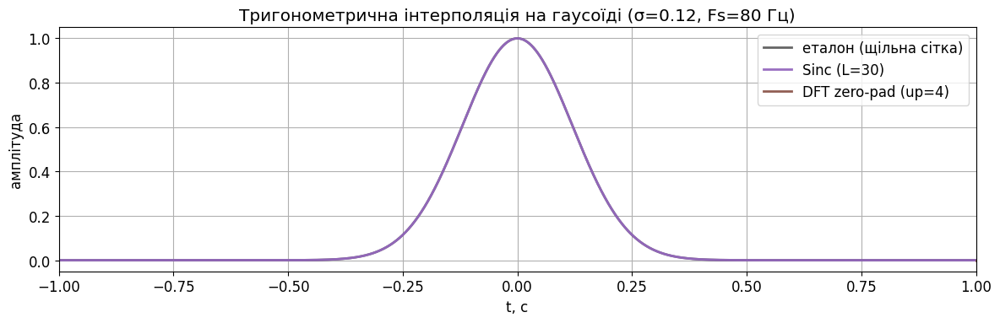

Гаусоїда (Sinc): MSE= 6.226450618219847e-32  | max|e|= 1.4432899320127035e-15
Гаусоїда (DFT zero-pad): MSE= 4.562440156195699e-34  | max|e|= 2.1359869279084315e-17


In [ ]:
# Гаусоїда (не періодична) — sinc працює добре, DFT-підхід показує періодизацію (увага на краї)
sigma = 0.12
Fs = 80
t_dense, x_dense, t_s, x_n = sample_on_grid(lambda tt: gaussian(tt, sigma), Fs, t_min, t_max)

# Sinc (з обрізанням ядра)
x_sinc = sinc_interpolate_uniform(x_n, Fs, t_new=t_dense, t0=t_s[0], L=160)

# DFT zero-padding: беремо лише центральний період відліків
# Попередження: це періодична інтерполяція; на краях можуть бути артефакти від періодизації.
up = 4
t_up, x_up = fourier_interp_zero_padding_fixed(x_n, Fs, up=up)
t_up -= t_min
# Відповідна щільна вісь для x_up у межах [t_s[0], t_s[-1]]
# t_up = np.linspace(t_s[0], t_s[-1], len(x_up))

plot_compare(
    t_dense, x_dense,
    curves=[
        ("Sinc (L=30)", t_dense, x_sinc, "C4"),
        (f"DFT zero-pad (up={up})", t_up, x_up, "C5"),
    ],
    title=f"Тригонометрична інтерполяція на гаусоїді (σ={sigma}, Fs={Fs} Гц)",
    t_zoom=(-1, 1)
)

print("Гаусоїда (Sinc): MSE=", mse(x_dense, x_sinc), " | max|e|=", max_err(x_dense, x_sinc))
# Для DFT-підходу обчислимо похибку лише на періоді, де є t_up
mask = (t_dense >= t_up[0]) & (t_dense <= t_up[-1])
print("Гаусоїда (DFT zero-pad): MSE=", mse(x_dense[mask], np.interp(t_dense[mask], t_up, x_up)),
      " | max|e|=", max_err(x_dense[mask], np.interp(t_dense[mask], t_up, x_up)))

## 4.5 Порівняння методів на різних сигналах

- **Гаусоїда** (гладка): очікуємо, що тригонометричні методи дадуть **експоненційно малу похибку** (швидке спадання спектру).
- **Пакет** (гладкий, вузькосмуговий): подібно до гаусоїди.
- **Прямокутник** (стрибок): у тригонометричних методів з’являється **Gibbs‑ефект** (перерегулювання), сплайни також можуть **перевищувати** амплітуду біля краю; лінійна — більш стримана.
- **Трикутник** (кусково-лінійний): лінійна часто дає дуже адекватний результат, кубічний сплайн може трохи “дзвонити” біля кутів.

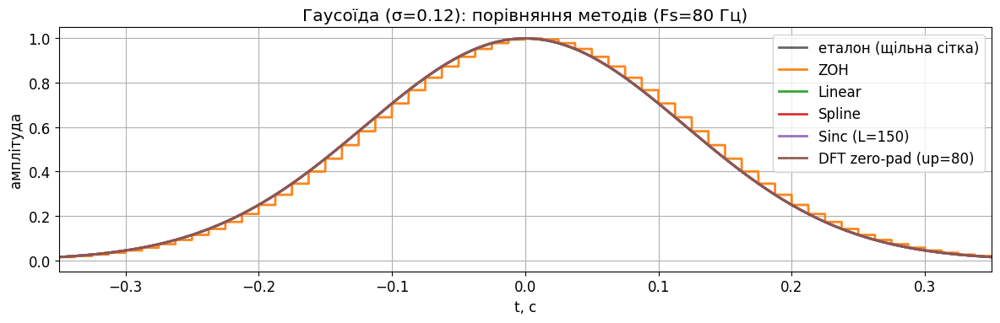

=== Гаусоїда (σ=0.12) | Fs=80 Гц ===
   ZOH -> MSE=1.921691e-04 | max|e|=6.289494e-02
Linear -> MSE=7.816015e-08 | max|e|=1.349911e-03
Spline -> MSE=2.745786e-14 | max|e|=9.260328e-07
  Sinc -> MSE=7.962634e-32 | max|e|=1.886388e-15
   DFT -> MSE=1.910467e-15 | max|e|=2.115759e-07



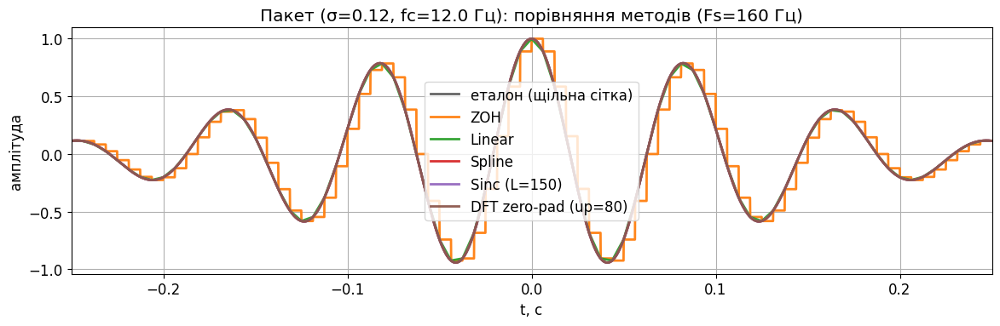

=== Пакет (σ=0.12, fc=12.0 Гц) | Fs=160 Гц ===
   ZOH -> MSE=3.915347e-03 | max|e|=4.568505e-01
Linear -> MSE=2.242303e-05 | max|e|=2.713822e-02
Spline -> MSE=4.858011e-10 | max|e|=1.421008e-04
  Sinc -> MSE=4.840651e-08 | max|e|=1.061153e-03
   DFT -> MSE=5.530633e-13 | max|e|=4.381711e-06



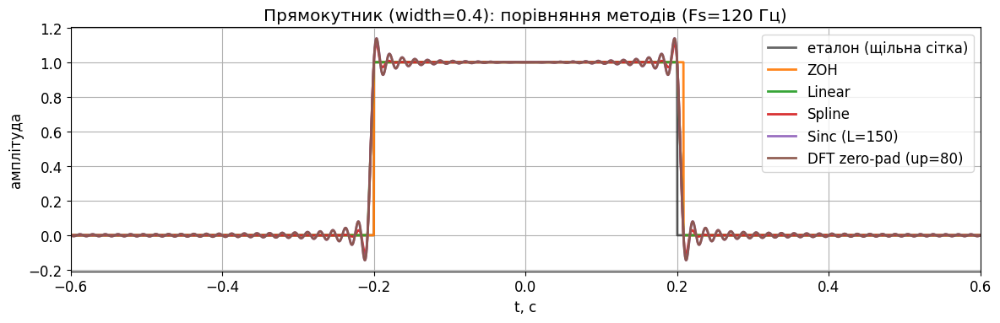

=== Прямокутник (width=0.4) | Fs=120 Гц ===
   ZOH -> MSE=4.150000e-03 | max|e|=1.000000e+00
Linear -> MSE=2.767551e-03 | max|e|=9.927996e-01
Spline -> MSE=2.975855e-03 | max|e|=9.953785e-01
  Sinc -> MSE=3.170388e-03 | max|e|=9.950407e-01
   DFT -> MSE=3.175014e-03 | max|e|=9.950147e-01



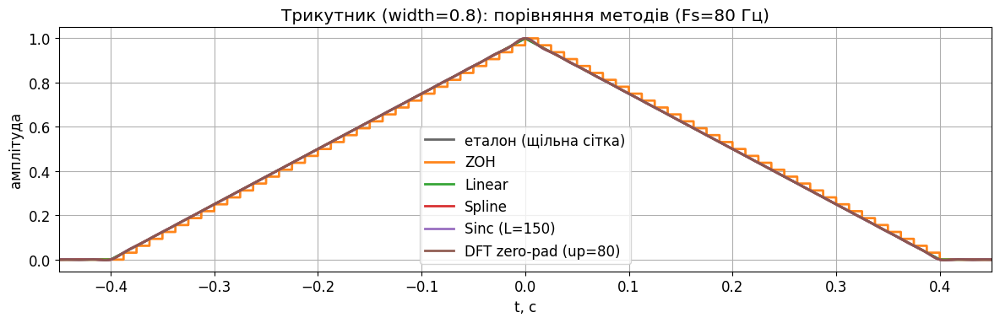

=== Трикутник (width=0.8) | Fs=80 Гц ===
   ZOH -> MSE=1.302098e-04 | max|e|=3.117500e-02
Linear -> MSE=4.133965e-34 | max|e|=2.208011e-16
Spline -> MSE=2.768614e-07 | max|e|=5.314405e-03
  Sinc -> MSE=5.127973e-07 | max|e|=5.939626e-03
   DFT -> MSE=5.126666e-07 | max|e|=5.938590e-03



In [ ]:
def run_all_methods(x_of_t, Fs, name, t_zoom=None, sinc_L=150, fourier_up=80):
    # Еталон та відліки
    t_dense, x_dense, t_s, x_n = sample_on_grid(x_of_t, Fs, t_min, t_max)

    # Методи:
    x_zoh  = zoh_interpolate(t_s, x_n, t_dense)
    lin_fn = interp1d(t_s, x_n, kind="linear", bounds_error=False, fill_value="extrapolate")
    x_lin  = lin_fn(t_dense)
    cs     = CubicSpline(t_s, x_n, bc_type="natural")
    x_spl  = cs(t_dense)
    x_sinc = sinc_interpolate_uniform(x_n, Fs, t_new=t_dense, t0=t_s[0], L=sinc_L)

    # DFT zero-padding періодичної інтерполяції на відрізку [t_s[0], t_s[-1]]
    # x_up = fourier_up * fourier_interp_zero_padding(x_n, up=fourier_up, real=True)
    # t_up = np.linspace(t_s[0], t_s[-1], len(x_up))
    t_up, x_up = fourier_interp_zero_padding_fixed(x_n, Fs, up=fourier_up)
    t_up += t_s[0] - t_up[0]
    x_dft = np.interp(t_dense, t_up, x_up)  # для метрик на t_dense

    # Плоти
    plot_compare(
        t_dense, x_dense,
        curves=[
            ("ZOH",   t_dense, x_zoh,  "C1"),
            ("Linear",t_dense, x_lin,  "C2"),
            ("Spline",t_dense, x_spl,  "C3"),
            (f"Sinc (L={sinc_L})", t_dense, x_sinc, "C4"),
            (f"DFT zero-pad (up={fourier_up})", t_dense, x_dft, "C5"),
        ],
        title=f"{name}: порівняння методів (Fs={Fs} Гц)",
        t_zoom=t_zoom
    )

    # Метрики
    def metrics(label, xr):
        return (label, mse(x_dense, xr), max_err(x_dense, xr))
    res = [
        metrics("ZOH",    x_zoh),
        metrics("Linear", x_lin),
        metrics("Spline", x_spl),
        metrics("Sinc",   x_sinc),
        metrics("DFT",    x_dft),
    ]

    print(f"=== {name} | Fs={Fs} Гц ===")
    for label, m, me in res:
        print(f"{label:>6s} -> MSE={m:.6e} | max|e|={me:.6e}")
    print()

# 1) Гаусоїда
sigma = 0.12
run_all_methods(lambda tt: gaussian(tt, sigma), Fs=80, name=f"Гаусоїда (σ={sigma})", t_zoom=(-0.35, 0.35))

# 2) Хвильовий пакет
sigma_p, fc = 0.12, 12.0
run_all_methods(lambda tt: gauss_packet(tt, sigma_p, fc), Fs=160, name=f"Пакет (σ={sigma_p}, fc={fc} Гц)", t_zoom=(-0.25, 0.25))

# 3) Прямокутний імпульс
width = 0.4
run_all_methods(lambda tt: rect_pulse(tt, width), Fs=120, name=f"Прямокутник (width={width})", t_zoom=(-0.6, 0.6))

# 4) Трикутник
width_tri = 0.8
run_all_methods(lambda tt: triangle(tt, width_tri), Fs=80, name=f"Трикутник (width={width_tri})", t_zoom=(-0.45, 0.45))

## 4.6 Спостереження та практичні висновки

- **Гладкі сигнали (гаусоїда, пакет)**:
  - Тригонометричні методи (**sinc**, **DFT zero-padding**) мають **дуже малу похибку**; для гаусоїди — майже експоненційна збіжність з ростом параметрів (L, up).
  - **Сплайн** теж точний, але зазвичай поступається тригонометричним на дуже гладких сигналах.
  - **Лінійна** та **ZOH** помітно гірші (більша MSE, «злами»/«сходинки»).

- **Сигнали з розривами (прямокутник)**:
  - **Gibbs‑ефект** у тригонометричних методів (перерегулювання біля країв).
  - **Сплайн** також схильний до перерегулювань біля стрибків.
  - **Лінійна** часто виглядає стримано й може дати менше «дзвону», але з кутами.

- **Кусково-лінійні сигнали (трикутник)**:
  - **Лінійна** інтерполяція дуже конкурентна (співпадає з природою сигналу).
  - **Сплайн** може давати невеликі ряби біля кутів.
  - Тригонометричні методи ок, але вимагають або періодичності (DFT), або великого $L$ (sinc).

- **Крайові ефекти**:
  - Sinc має нескінченне ядро — практично ми **обрізаємо** його ⇒ краї відрізка відновлюються гірше.
  - DFT‑підхід припускає **періодичність** — при неперіодичних сигналах краї «зшиваються», що дає артефакти.

- **Коли який метод**:
  - реальний ЦАП/швидка прев’ю — **ZOH**;
  - простий, стабільний baseline — **лінійна**;
  - гладкі сигнали без розривів — **сплайн** або **тригонометричні**;
  - періодичні дані/інтерполяція по колу — **DFT zero-padding**;
  - смуговообмежені (ідеалізовані) — **sinc** (зрозуміти обмеження ядра).

## 4.7 Міні‑експеримент: експоненційна збіжність на гаусоїді

Для гаусоїди збільшимо параметр обрізання ядра $L$ у sinc‑інтерполяції та/або фактор апсемплінгу `up` у DFT‑підході, і подивимось на MSE.

Очікування: з ростом $L$ і `up` похибка зменшується дуже швидко (на практиці стримується лише крайовими ефектами та кінцевою дискретизацією).

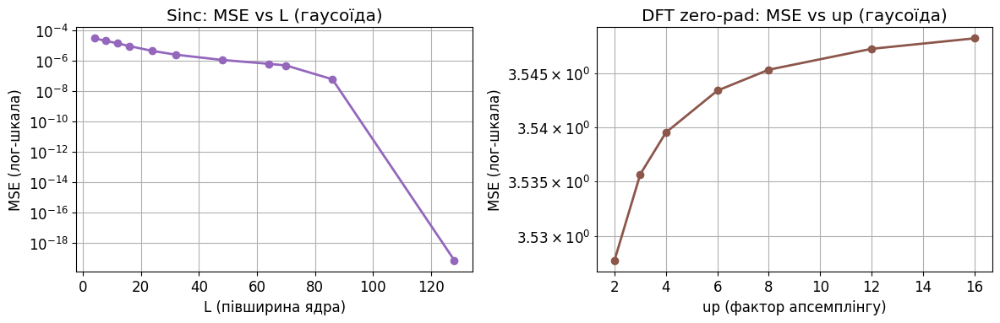

In [ ]:
sigma = 0.12
Fs = 80
t_dense, x_dense, t_s, x_n = sample_on_grid(lambda tt: gaussian(tt, sigma), Fs, t_min, t_max)

Ls = [4, 8, 12, 16, 24, 32, 48, 64, 70, 86, 128]
mse_sinc = []
for L in Ls:
    xr = sinc_interpolate_uniform(x_n, Fs, t_new=t_dense, t0=t_s[0], L=L)
    mse_sinc.append(mse(x_dense, xr))

ups = [2, 3, 4, 6, 8, 12, 16]
mse_dft = []
for up in ups:
    x_up, t_up = fourier_interp_zero_padding_fixed(x_n, Fs, up=up)
    # t_up = np.linspace(t_s[0], t_s[-1], len(x_up))
    correction = t_up[0] - t_s[0]
    t_up -= correction
    xr = np.interp(t_dense, t_up, x_up)
    mse_dft.append(mse(x_dense, xr))

fig, ax = plt.subplots(1, 2, figsize=(12, 4))
ax[0].semilogy(Ls, mse_sinc, "o-", color="C4")
ax[0].set_title("Sinc: MSE vs L (гаусоїда)")
ax[0].set_xlabel("L (півширина ядра)")
ax[0].set_ylabel("MSE (лог-шкала)")
ax[0].grid(True, which="both")

ax[1].semilogy(ups, mse_dft, "o-", color="C5")
ax[1].set_title("DFT zero-pad: MSE vs up (гаусоїда)")
ax[1].set_xlabel("up (фактор апсемплінгу)")
ax[1].set_ylabel("MSE (лог-шкала)")
ax[1].grid(True, which="both")

plt.tight_layout()
plt.show()

## Підсумок (Розділ 4)

- Різні методи інтерполяції мають різну придатність для різних класів сигналів.
- **Sinc** і **DFT‑інтерполяція** демонструють відмінну точність на гладких/смуговообмежених сигналах.
- **Сплайн** — сильний універсальний інструмент для гладких сигналів; можливі перерегулювання біля розривів.
- **Лінійна** — стабільна та проста, особливо добра для кусково-лінійних сигналів.
- **ZOH** — простий технічний baseline, зазвичай найгірший за точністю, але відображає роботу простого ЦАП.

Далі у Розділі 5:
- спектральні властивості: дискретний/неперервний спектр, дельта, прямокутник, трикутник, гаусоїда;
- зв’язок гладкості з швидкістю спадання спектру;
- зв’язок тривалості з шириною спектру;
- згортка $\leftrightarrow$ множення (в обох напрямках).

# 5. Перетворення Фур’є: сигнали ↔ спектри

У цьому розділі:
- **5.1** Основи: неперервне, дискретне, періодичне; DTFT, DFT/FFT.
- **5.2** Спектри характерних сигналів: дельта, прямокутник, трикутник, гаусоїда.
- **5.3** Гладкість ↔ швидкість спадання спектру (rect → 1/f, tri → 1/f², gauss → експоненційний спад).
- **5.4** Зв’язок тривалості та ширини спектру (time–bandwidth tradeoff).
- **5.5** Еквівалентність згортки та множення (в обох напрямках).

Технічні примітки:
- Ми працюємо з дискретним наближенням ($x[n]$) та використовуємо `FFT` для оцінки спектру.
- Для зручності показуємо **однобічний** спектр (`rfft`) у діапазоні $[0, F_s/2]$.
- Для кращої візуалізації інколи застосовуємо **zero‑padding** у частоті (в коді — збільшення `n_fft`).

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

plt.rcParams.update({
    "figure.figsize": (10, 4),
    "axes.grid": True,
    "lines.linewidth": 2,
    "font.size": 12
})

def fft_rmag(x, Fs, n_fft=None, window=None):
    """Однобічний спектр |X(f)| з rFFT. Опційно: вікно (callable N->w) та свій n_fft."""
    x = np.asarray(x, float)
    N = x.size
    if window is not None:
        w = window(N)
        xw = x * w
        Wc = np.sum(w) / N  # просте енергетичне/амплітудне вирівнювання (грубо)
    else:
        xw = x
        Wc = 1.0
    if n_fft is None:
        n_fft = int(2 ** np.ceil(np.log2(N)))
    X = np.fft.rfft(xw, n=n_fft)
    f = np.fft.rfftfreq(n_fft, d=1/Fs)
    mag = np.abs(X) / (N * Wc)
    return f, mag

def plot_time(t, x, title="", xlim=None):
    plt.figure(figsize=(10, 3.6))
    plt.plot(t, x, color="C0")
    plt.title(title)
    plt.xlabel("t, c")
    plt.ylabel("амплітуда")
    if xlim is not None:
        plt.xlim(*xlim)
    plt.tight_layout(); plt.show()

def plot_spec(f, mag, Fs, title="", xlim=None, ylog=False):
    plt.figure(figsize=(10, 3.6))
    if ylog:
        plt.semilogy(f, np.maximum(mag, 1e-14), color="C2")
    else:
        plt.plot(f, mag, color="C2")
    plt.title(title)
    plt.xlabel("f, Гц"); plt.ylabel("|X(f)| (умовн.)")
    plt.xlim(0, Fs/2 if xlim is None else xlim[1])
    if xlim is not None: plt.xlim(*xlim)
    plt.tight_layout(); plt.show()

## 5.1 Основи перетворення Фур’є

Ключові зв’язки:

- **Неперервний час**: $x(t)$ ↔ $X(f)$, де

$$
X(f) = \int_{-\infty}^{\infty} x(t)\, e^{-j2\pi f t}\, dt, \qquad
x(t) = \int_{-\infty}^{\infty} X(f)\, e^{j2\pi f t}\, df.
$$

- **Дискретний час (DTFT)**: $x[n]$ ↔ $X(\omega)$ періодичний по $\omega$ з періодом $2\pi$.
- **DFT/FFT**: дискретизує частоту; $N$ відліків у часі ↔ $N$ відліків у частоті;
  інтерпретується як спектр **періодизованого** сигналу.

Важливі наслідки:
- **Періодизація** у часі ↔ дискретизація у частоті.
- **Обрізання** у часі ↔ згортка з $\mathrm{sinc}$ у частоті (spectral leakage).

In [ ]:
def time_axis(Fs, T, t0=0.0):
    """Створює рівномірну часову сітку тривалості T з Fs Гц, від t0 (включно)."""
    N = int(np.round(Fs * T))
    t = t0 + np.arange(N) / Fs
    return t

def delta_discrete(N, k0=0):
    """Кронекер-дельта: 1 у k0, 0 інакше."""
    x = np.zeros(N); x[k0 % N] = 1.0
    return x

def rect_pulse(t, width):
    """Прямокутник 1 на |t|<=width/2, 0 інакше (центр в 0)."""
    return (np.abs(t) <= width/2).astype(float)

def triangle(t, width):
    """Симетричний трикутник ширини width, висота 1 у t=0."""
    return np.clip(1 - 2*np.abs(t)/width, 0, 1)

def gaussian(t, sigma):
    """Гаусоїда exp(-t^2/(2 sigma^2))."""
    return np.exp(-t**2/(2*sigma**2))

## 5.2 Спектри характерних сигналів

- **Дельта‑імпульс** $\,\delta(t)\,$ → **константний спектр** (усі частоти присутні однаково).
- **Прямокутник** ширини $T$ → спектр $\propto \mathrm{sinc}(fT)$ (повільний спад $\sim 1/f$).
- **Трикутник** → $\propto \mathrm{sinc}^2(fT)$ (швидший спад $\sim 1/f^2$).
- **Гаусоїда** $\exp(-t^2/(2\sigma^2))$ → **гаусоїда** у частоті, спад експоненційний.

У дискретному наближенні ми побачимо ті ж тренди (з урахуванням обтинання у вікні спостереження).

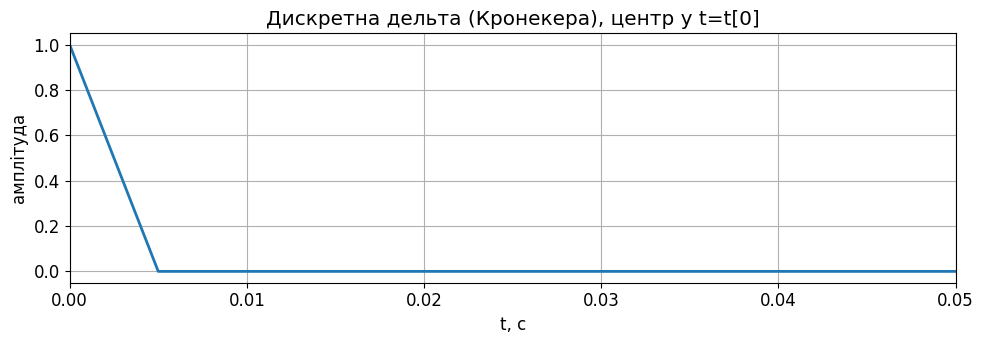

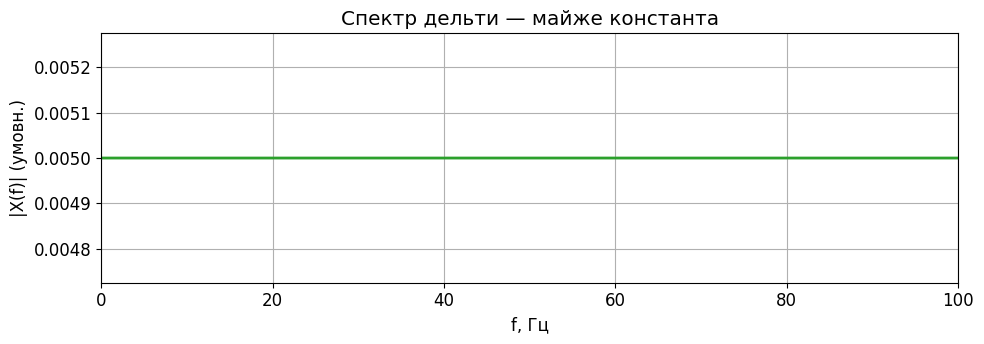

In [ ]:
Fs = 200.0; T = 1.0
t = time_axis(Fs, T)
N = t.size

x_delta = delta_discrete(N, k0=0)  # 1 на нульовому індексі
plot_time(t, x_delta, title="Дискретна дельта (Кронекера), центр у t=t[0]", xlim=(0, 0.05))

f, mag = fft_rmag(x_delta, Fs, n_fft=4096)
plot_spec(f, mag, Fs, title="Спектр дельти — майже константа", xlim=(0, Fs/2))

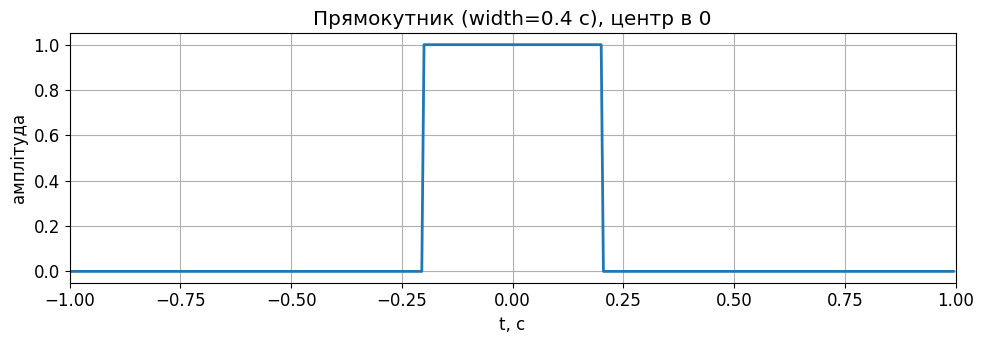

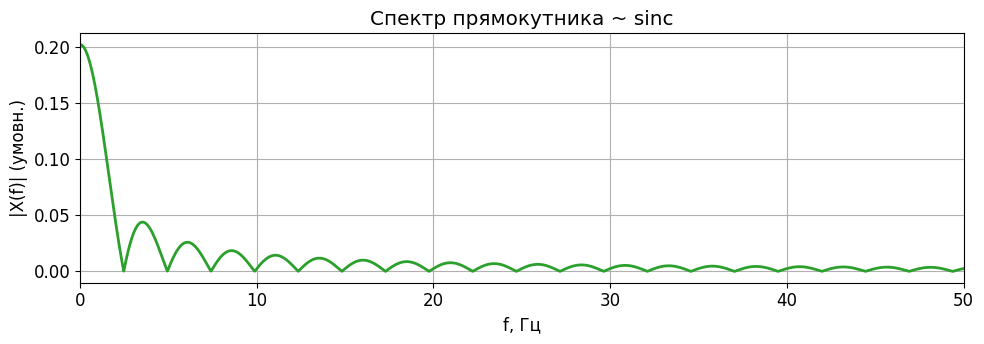

In [ ]:
Fs = 200.0; T = 2.0; width = 0.4
t = time_axis(Fs, T, t0=-T/2)
x_rect = rect_pulse(t, width)

plot_time(t, x_rect, title=f"Прямокутник (width={width} c), центр в 0", xlim=(-1, 1))

f, mag = fft_rmag(x_rect, Fs, n_fft=8192)
plot_spec(f, mag, Fs, title="Спектр прямокутника ~ sinc", xlim=(0, 50))

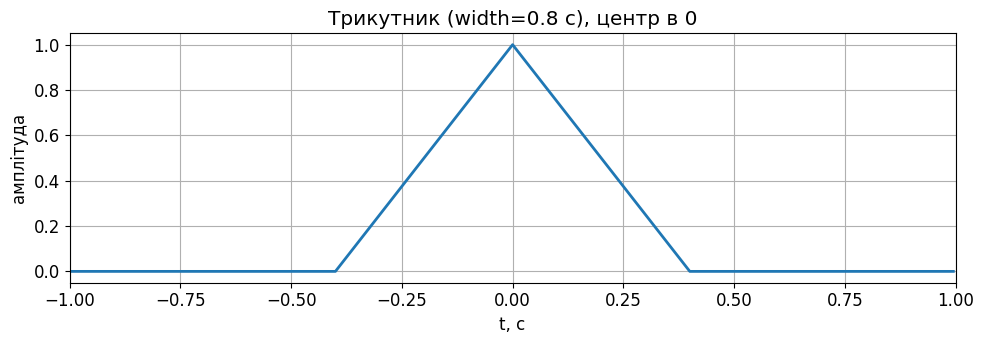

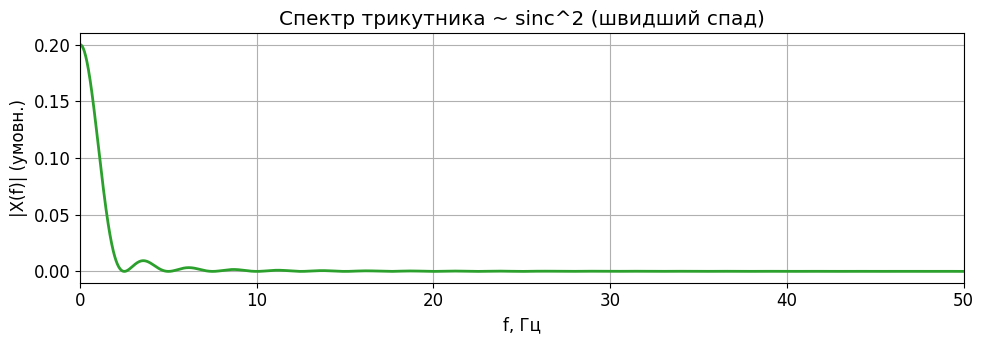

In [ ]:
Fs = 200.0; T = 2.0; width = 0.8
t = time_axis(Fs, T, t0=-T/2)
x_tri = triangle(t, width)

plot_time(t, x_tri, title=f"Трикутник (width={width} c), центр в 0", xlim=(-1, 1))

f, mag = fft_rmag(x_tri, Fs, n_fft=8192)
plot_spec(f, mag, Fs, title="Спектр трикутника ~ sinc^2 (швидший спад)", xlim=(0, 50))

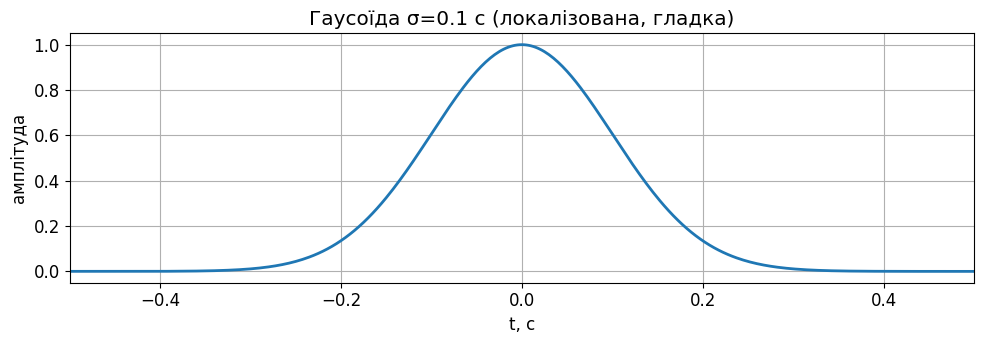

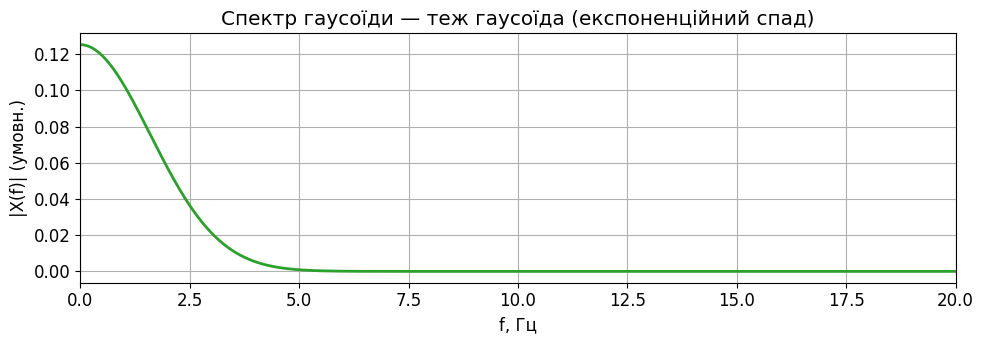

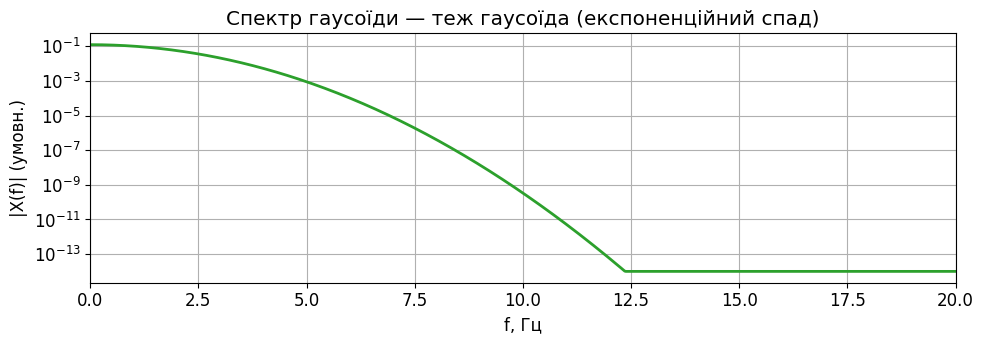

In [ ]:
Fs = 400.0; T = 2.0; sigma = 0.1
t = time_axis(Fs, T, t0=-T/2)
x_g = gaussian(t, sigma)

plot_time(t, x_g, title=f"Гаусоїда σ={sigma} c (локалізована, гладка)", xlim=(-0.5, 0.5))

f, mag = fft_rmag(x_g, Fs, n_fft=16384)
plot_spec(f, mag, Fs, title="Спектр гаусоїди — теж гаусоїда (експоненційний спад)", xlim=(0, 20), ylog=False)
plot_spec(f, mag, Fs, title="Спектр гаусоїди — теж гаусоїда (експоненційний спад)", xlim=(0, 20), ylog=True)

## 5.3 Гладкість сигналу ↔ швидкість спадання спектру

Інтуїція:
- Розриви (стрибки) у часі ⇒ повільний спад спектру ($\sim 1/f$).
- Кутові злами ⇒ швидший спад ($\sim 1/f^2$).
- Нескінченно гладкий (гаусоїда) ⇒ експоненційний спад.

Зіставимо спектри прямокутника, трикутника та гаусоїди на одній лог‑шкалі.

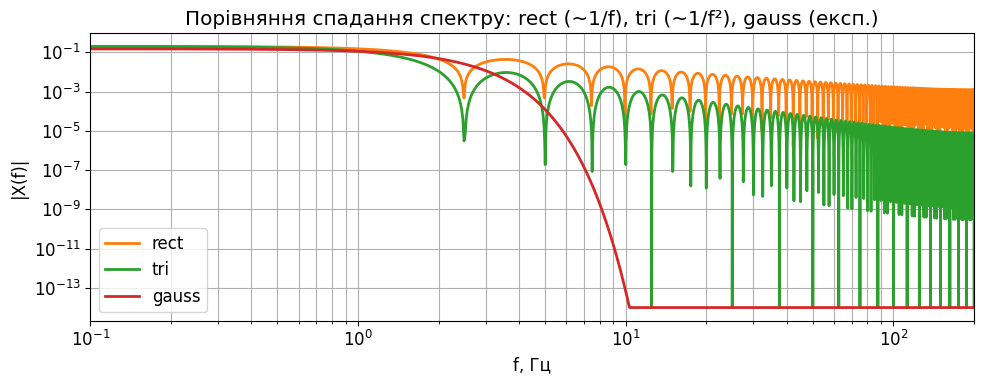

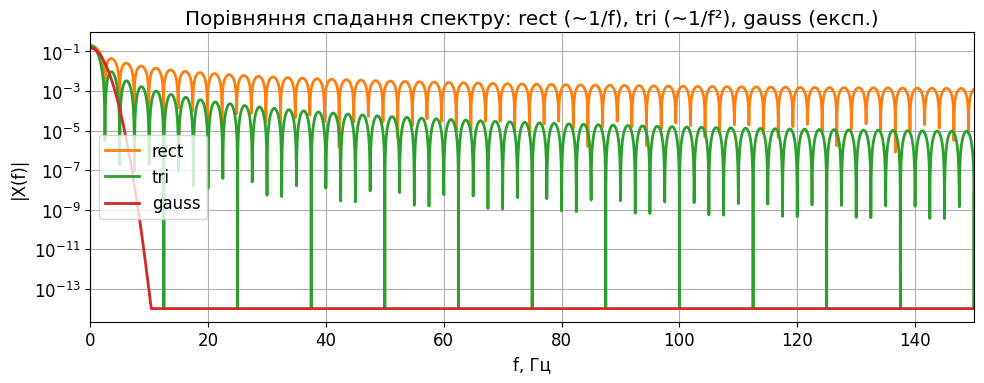

In [ ]:
Fs = 400.0; T = 2.0
t = time_axis(Fs, T, t0=-T/2)

x_rect = rect_pulse(t, width=0.4)
x_tri  = triangle(t, width=0.8)
x_g    = gaussian(t, sigma=0.12)

f, m_rect = fft_rmag(x_rect, Fs, n_fft=16384)
_, m_tri  = fft_rmag(x_tri,  Fs, n_fft=16384)
_, m_g    = fft_rmag(x_g,    Fs, n_fft=16384)

plt.figure(figsize=(10, 4))
plt.loglog(f, np.maximum(m_rect, 1e-14), label="rect", color="C1")
plt.loglog(f, np.maximum(m_tri,  1e-14), label="tri",  color="C2")
plt.loglog(f, np.maximum(m_g,    1e-14), label="gauss",color="C3")
plt.title("Порівняння спадання спектру: rect (∼1/f), tri (∼1/f²), gauss (експ.)")
plt.xlabel("f, Гц"); plt.ylabel("|X(f)|")
plt.xlim(0.1, 200); plt.legend(); plt.grid(True, which="both")
plt.tight_layout(); plt.show()

plt.figure(figsize=(10, 4))
plt.semilogy(f, np.maximum(m_rect, 1e-14), label="rect", color="C1")
plt.semilogy(f, np.maximum(m_tri,  1e-14), label="tri",  color="C2")
plt.semilogy(f, np.maximum(m_g,    1e-14), label="gauss",color="C3")
plt.title("Порівняння спадання спектру: rect (∼1/f), tri (∼1/f²), gauss (експ.)")
plt.xlabel("f, Гц"); plt.ylabel("|X(f)|")
plt.xlim(0, 150); plt.legend(); plt.grid(True, which="both")
plt.tight_layout(); plt.show()


## 5.4 Тривалість сигналу ↔ ширина спектру (time–bandwidth)

Чим **коротший** сигнал у часі, тим **ширший** спектр (і навпаки). Для гаусоїди існує мінімальний добуток дисперсій (аналог невизначеності):

$$
\sigma_t\, \sigma_f = \frac{1}{2\pi},
$$

якщо використовувати узгоджені визначення дисперсій і нормувань для неперервного випадку. У дискретному наближенні оцінюємо чисельно:

- $\sigma_t$ — стандартне відхилення $|x(t)|^2$ як ваги по часу,
- $\sigma_f$ — стандартне відхилення $|X(f)|^2$ як ваги по частоті.

У чисельному експерименті:
- використовується гаусоїда $x(t)=\exp(-t^2/(2\sigma^2))$,
- стандартне відхилення обчислюється за енергією $|x(t)|^2$,
- частота вимірюється у Гц.

За цих визначень:
$$
\sigma_t = \frac{\sigma}{\sqrt{2}}, \qquad
\sigma_t \sigma_f = \frac{1}{8\pi}.
$$

In [ ]:
def weighted_std(x, axis_vals):
    """Стандартне відхилення за вагами |x|^2 відносно координат axis_vals."""
    w = np.abs(x)**2
    w /= np.sum(w)
    mu = np.sum(axis_vals * w)
    var = np.sum(((axis_vals - mu)**2) * w)
    return np.sqrt(var)

def sigma_f_one_sided_corrected(x, Fs, n_fft=None):
    """
    σ_f з однобічного rFFT з корекцією енергії:
    - DC та (Nyquist, якщо є) не подвоюємо,
    - інші бени множимо на 2 (відповідають парі ±f).
    """
    x = np.asarray(x, float)
    N = x.size
    if n_fft is None:
        n_fft = int(2 ** np.ceil(np.log2(N)))
    X = np.fft.rfft(x, n=n_fft)
    f = np.fft.rfftfreq(n_fft, d=1/Fs)
    W = np.abs(X) ** 2

    # Корекція: подвоюємо енергію для всіх, крім країв
    W_corr = W.copy()
    if W_corr.size > 1:
        W_corr[1:-1] *= 2  # DC: 0-й; Nyquist (останній для парного n_fft): не подвоюємо

    W_sum = np.sum(W_corr)
    if W_sum == 0:
        return 0.0
    Wn = W_corr / W_sum

    mu = np.sum(f * Wn)
    var = np.sum(((f - mu) ** 2) * Wn)
    return np.sqrt(var)

Fs = 800.0; T = 2.0
t = time_axis(Fs, T, t0=-T/2)

sigmas = [0.05, 0.1, 0.2]
for s in sigmas:
    x = gaussian(t, s)
    f, Xmag = fft_rmag(x, Fs, n_fft=65536)
    sigma_t = weighted_std(x, t)
    # sigma_f = weighted_std(Xmag, f)
    sigma_f = sigma_f_one_sided_corrected(x, Fs, n_fft=65536)
    print(f"σ={s:.3f}: σ/√2={s/np.sqrt(2):.5f}  sigma_t≈{sigma_t:.5f}  sigma_f≈{sigma_f:.5f}  product≈{sigma_t*sigma_f:.5f}")

σ=0.050: σ/√2=0.03536  sigma_t≈0.03536  sigma_f≈1.35681  product≈0.04797
σ=0.100: σ/√2=0.07071  sigma_t≈0.07071  sigma_f≈0.67841  product≈0.04797
σ=0.200: σ/√2=0.14142  sigma_t≈0.14142  sigma_f≈0.33922  product≈0.04797


In [ ]:
print(1 / (8 * np.pi))

0.039788735772973836


## 5.5 Згортка ↔ множення (в обох напрямках)

Два фундаментальні факти:
- **Згортка в часі** відповідає **множенню** у частотній області:

$$
y(t) = (x * h)(t) \quad \Longleftrightarrow \quad Y(f) = X(f)\,H(f).
$$

- **Множення в часі** відповідає **згортці** у частоті:

$$
y(t) = x(t)\, w(t) \quad \Longleftrightarrow \quad Y(f) = (X * W)(f).
$$

Покажемо обидва на чисельних прикладах.

## Визначення згортки

### Неперервна згортка

Для двох неперервних сигналів $x(t)$ та $h(t)$ **згортка** визначається як

$$
(x * h)(t) = \int_{-\infty}^{\infty} x(\tau)\, h(t - \tau)\, d\tau.
$$

Інтерпретація:
- сигнал $h(t)$ **віддзеркалюється** та **зсувається** на $t$,
- множиться на $x(\tau)$,
- результат інтегрується по всьому часу.

Згортка описує реакцію **лінійної стаціонарної системи (LTI)** з імпульсною характеристикою $h(t)$ на вхід $x(t)$.

---

### Дискретна згортка

Для дискретних сигналів $x[n]$ та $h[n]$:

$$
(x * h)[n] = \sum_{k=-\infty}^{\infty} x[k]\; h[n - k].
$$

У чисельній реалізації (кінченні послідовності) сума обмежується індексами, де обидва множники ненульові.

---

### Лінійна vs циклічна (кругова) згортка

- **Лінійна згортка**  
  Відповідає фізичній LTI‑системі з нульовими значеннями поза інтервалом спостереження.
  Довжина результату для сигналів довжин $N$ і $M$ дорівнює $N+M-1$.

- **Циклічна (кругова) згортка**  
  Виникає при використанні **DFT/FFT без zero‑padding** і відповідає згортці **періодичних** сигналів:

$$
(x \circledast h)[n] = \sum_{k=0}^{N-1} x[k]\; h[(n-k)\!\!\!\mod N].
$$

Щоб за допомогою FFT отримати **лінійну згортку**, необхідно:
- доповнити обидва сигнали нулями до довжини не менше $N+M-1$,
- лише після цього виконувати FFT → множення → IFFT.

---

### Ключовий зв’язок зі спектром

Згортка і множення — взаємно обернені операції у часовій та частотній областях:

$$
x(t) * h(t) \;\Longleftrightarrow\; X(f)\,H(f),
$$

$$
x(t)\,h(t) \;\Longleftrightarrow\; X(f) * H(f).
$$

Це фундаментальний принцип, який пояснює:
- роботу фільтрів,
- spectral leakage,
- вплив віконування,
- zero‑padding,
- інтерполяцію через sinc та DFT.

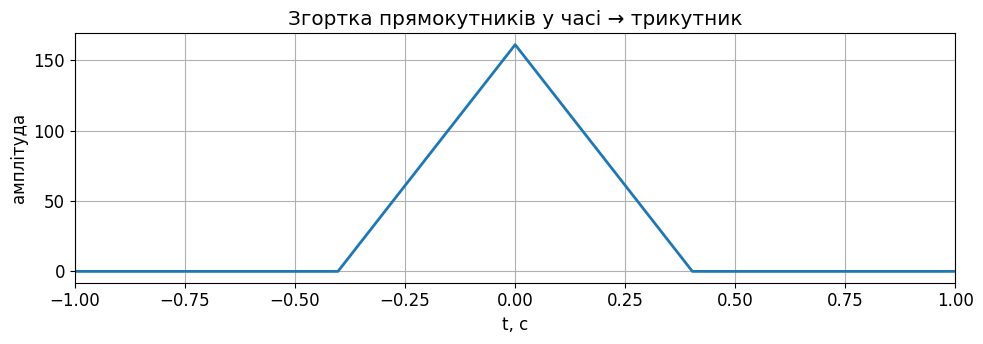

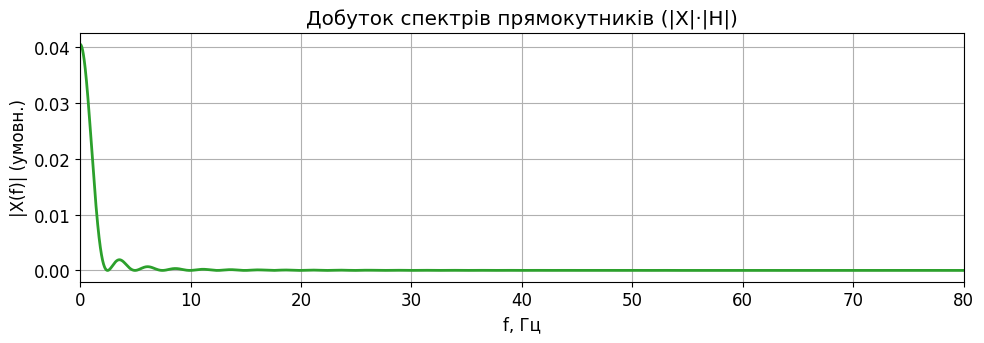

In [ ]:
# Згортка в часі = множення у частоті (rect * rect → tri)
Fs = 400.0; T = 2.0
t = time_axis(Fs, T, t0=-T/2)

x = rect_pulse(t, width=0.4)
h = rect_pulse(t, width=0.4)

# Згортка в часі (лінійна), вирівняємо довжину нуль-доповненням
y_time = np.convolve(x, h, mode="full")
t_conv = np.linspace(t[0]+t[0], t[-1]+t[-1], y_time.size)

# Спектри (множення в частоті)
n_fft = 1 << 16
f, X = fft_rmag(x, Fs, n_fft=n_fft)
_, H = fft_rmag(h, Fs, n_fft=n_fft)
Y_freq_mag = X * H

# Порівняння: у часі отримаємо трикутник, у частоті — добуток спектрів
plot_time(t_conv, y_time, title="Згортка прямокутників у часі → трикутник", xlim=(-1, 1))
plot_spec(f, Y_freq_mag, Fs, title="Добуток спектрів прямокутників (|X|·|H|)", xlim=(0, 80))

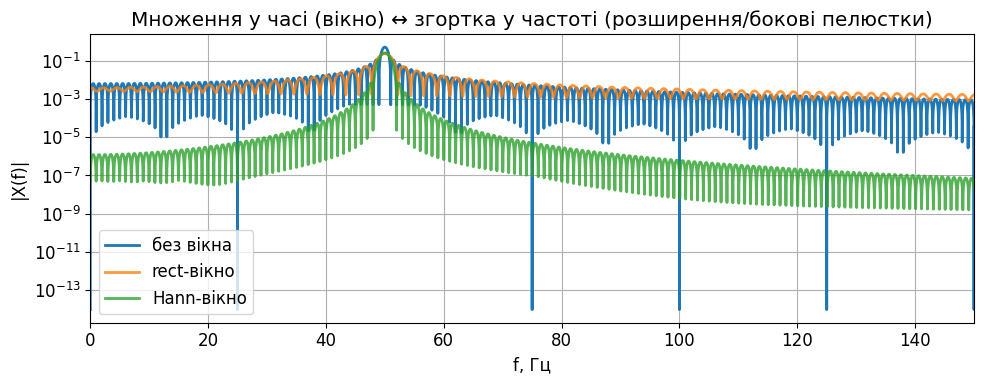

In [ ]:
# Синус, помножений на вікно (rect і Hann) → спектральне розширення
Fs = 800.0; T = 1.0; f0 = 50.0
t = time_axis(Fs, T)
x = np.sin(2*np.pi*f0*t)

# Прямокутне вікно (обтинання)
w_rect = rect_pulse(t, T/1.1)
# Hann-вікно
w_hann = 0.5*(1 - np.cos(2*np.pi*np.arange(x.size)/(x.size-1)))

x_rect = x * w_rect
x_hann = x * w_hann

f, m_x     = fft_rmag(x,      Fs, n_fft=65536)
_, m_xrect = fft_rmag(x_rect, Fs, n_fft=65536)
_, m_xhann = fft_rmag(x_hann, Fs, n_fft=65536)

plt.figure(figsize=(10, 4))
plt.semilogy(f, np.maximum(m_x,     1e-14), label="без вікна", color="C0")
plt.semilogy(f, np.maximum(m_xrect, 1e-14), label="rect-вікно", color="C1", alpha=0.8)
plt.semilogy(f, np.maximum(m_xhann, 1e-14), label="Hann-вікно", color="C2", alpha=0.8)
plt.title("Множення у часі (вікно) ↔ згортка у частоті (розширення/бокові пелюстки)")
plt.xlabel("f, Гц"); plt.ylabel("|X(f)|")
plt.xlim(0, 150); plt.legend(); plt.grid(True, which="both")
plt.tight_layout(); plt.show()

## Підсумок (Розділ 5)

- Дискретний спектральний аналіз через `FFT` — це спектр **періодизованого/обрізаного** сигналу.
- Характерні приклади підтверджують класичні форми спектрів:
  - $\delta$ → константа; прямокутник → $\mathrm{sinc}$; трикутник → $\mathrm{sinc}^2$; гаусоїда → гаусоїда.
- Більша **гладкість** у часі ⇒ **швидший спад** спектру; розриви дають повільний спад і рябіння.
- **Часова тривалість** протиставлена **ширині спектру** (на гаусоїдах видно чисельно).
- **Згортка/множення** в часі та частоті — взаємні операції; це пояснює феномени типу spectral leakage і вплив вікон.



# 6. Практичні аспекти DSP: leakage, вікна, zero‑padding, фільтрація, ресемплінг

У цьому розділі ми розглянемо “польові” ефекти, які завжди з’являються у практичному спектральному аналізі та дискретній обробці:

- **6.1 Spectral leakage**: обрізання сигналу у часі еквівалентне множенню на прямокутне вікно, що дає “розмазування” спектра.
- **6.2 Вікна** (Hann, Hamming, Blackman): компроміс між шириною головної пелюстки та рівнем бокових пелюсток.
- **6.3 Zero‑padding**: не підвищує роздільну здатність, але дає щільнішу сітку по частоті для візуалізації/пошуку піку.
- **6.4 Склопінг‑втрата (scalloping loss)**: максимум гармоніки “провалюється”, якщо частота не потрапляє точно в бін DFT.
- **6.5 Антиаліайзинг та ресемплінг**: чому перед зменшенням $F_s$ потрібен НЧ‑фільтр; як працює decimation.

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import signal

plt.rcParams.update({
    "figure.figsize": (10, 4),
    "axes.grid": True,
    "lines.linewidth": 2,
    "font.size": 12
})

def rfft_mag(x, Fs, n_fft=None, window=None, amp_correction=True):
    x = np.asarray(x, float)
    N = len(x)
    if window is None:
        w = np.ones(N)
    else:
        w = window(N)
    xw = x * w
    if n_fft is None:
        n_fft = int(2 ** np.ceil(np.log2(N)))
    X = np.fft.rfft(xw, n=n_fft)
    f = np.fft.rfftfreq(n_fft, d=1/Fs)
    # Амплітудна корекція за середнім значенням вікна (coherent gain)
    cg = np.sum(w)/N if amp_correction else 1.0
    mag = np.abs(X) / (N * cg)
    return f, mag

def plot_spec(f, mag, Fs, title="", xlim=None, ylog=False, ylim=None):
    plt.figure(figsize=(10, 3.6))
    y = np.maximum(mag, 1e-14)
    plt.semilogy(f, y) if ylog else plt.plot(f, y)
    plt.title(title); plt.xlabel("f, Гц"); plt.ylabel("|X(f)|")
    plt.xlim(0, Fs/2)
    if xlim is not None: plt.xlim(*xlim)
    if ylim is not None: plt.ylim(*ylim)
    plt.tight_layout(); plt.show()

def plot_time(t, x, title="", xlim=None):
    plt.figure(figsize=(10, 3.2))
    plt.plot(t, x); plt.title(title); plt.xlabel("t, c"); plt.ylabel("x(t)")
    if xlim is not None: plt.xlim(*xlim)
    plt.tight_layout(); plt.show()

## 6.1 Spectral leakage: чому “чистий синус” дає розмазаний спектр

DFT/FFT аналізує сигнал у скінченному часовому вікні. Це еквівалентно множенню на прямокутне вікно $w(t)$.

Множення у часі відповідає згортці у частоті:

$$
x(t)\,w(t) \;\Longleftrightarrow\; X(f) * W(f).
$$

У прямокутного вікна спектр $W(f)$ має форму $\mathrm{sinc}$ з повільним спаданням бокових пелюсток, що і спричиняє leakage.

Найважливіша демонстрація: синус, частота якого **не кратна** частотному кроку DFT, “розтікається” по бинах.

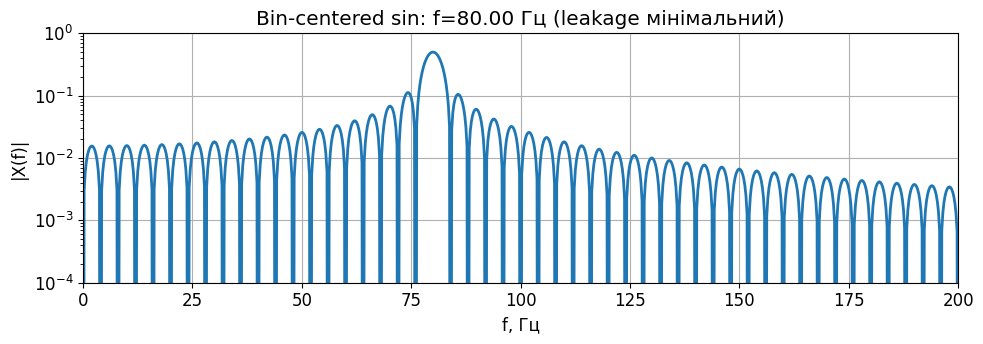

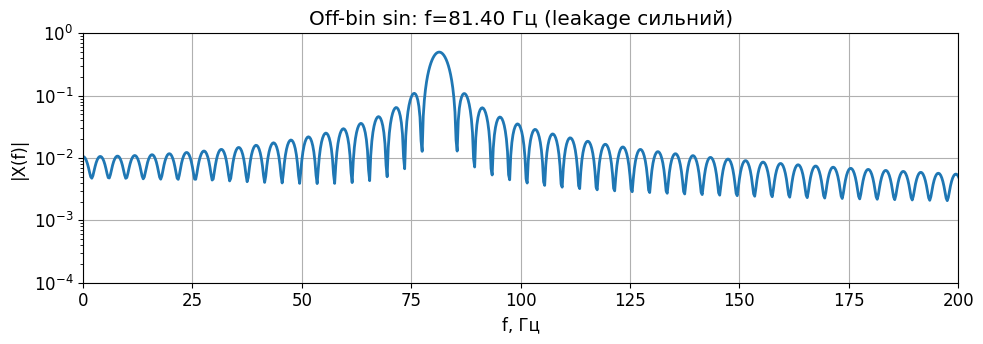

In [ ]:
Fs = 1024.0
N = 256
t = np.arange(N)/Fs

df = Fs/N                 # крок частотних бінів DFT
f_bin = 20 * df           # рівно у бін
f_off = f_bin + 0.35*df   # між бінами

x1 = np.sin(2*np.pi*f_bin*t)
x2 = np.sin(2*np.pi*f_off*t)

f1, m1 = rfft_mag(x1, Fs, n_fft=4096)
f2, m2 = rfft_mag(x2, Fs, n_fft=4096)

plot_spec(f1, m1, Fs, title=f"Bin-centered sin: f={f_bin:.2f} Гц (leakage мінімальний)", xlim=(0, 200), ylog=True, ylim=(1e-4, 1))
plot_spec(f2, m2, Fs, title=f"Off-bin sin: f={f_off:.2f} Гц (leakage сильний)", xlim=(0, 200), ylog=True, ylim=(1e-4, 1))

## 6.2 Вікна: компроміс між боковими пелюстками і роздільною здатністю

Вікна пригнічують leakage, зменшуючи бокові пелюстки $W(f)$, але за це платимо:
- ширшою головною пелюсткою (гірша роздільна здатність),
- зміною амплітуди (потрібна корекція coherent gain).

Порівняємо типові вікна:
- Rect (прямокутне),
- Hann,
- Hamming,
- Blackman.

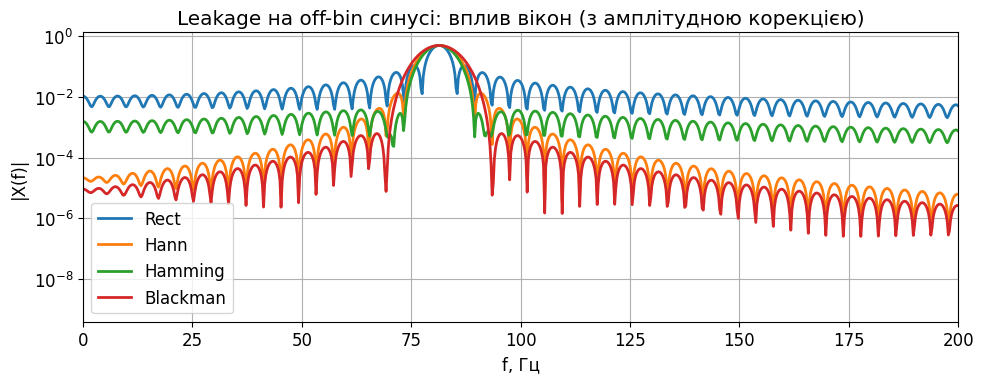

In [ ]:
Fs = 1024.0
N = 256
t = np.arange(N)/Fs
df = Fs/N
f_off = 20*df + 0.35*df
x = np.sin(2*np.pi*f_off*t)

windows = {
    "Rect": lambda n: np.ones(n),
    "Hann": np.hanning,
    "Hamming": np.hamming,
    "Blackman": np.blackman
}

plt.figure(figsize=(10, 4))
for i, (name, wfun) in enumerate(windows.items()):
    f, mag = rfft_mag(x, Fs, n_fft=4096, window=wfun, amp_correction=True)
    plt.semilogy(f, np.maximum(mag, 1e-14), label=name)
plt.title("Leakage на off-bin синусі: вплив вікон (з амплітудною корекцією)")
plt.xlabel("f, Гц"); plt.ylabel("|X(f)|"); plt.xlim(0, 200)
plt.legend(); plt.grid(True, which="both")
plt.tight_layout(); plt.show()

## 6.3 Zero‑padding: що він робить, а що — ні

Zero‑padding у часі (збільшення `n_fft`) **не додає нової інформації** і **не покращує справжню роздільну здатність**.

Але він:
- робить частотну сітку щільнішою ($\Delta f = F_s/n_{\text{fft}}$ менше),
- полегшує візуальну інтерполяцію піків і оцінку частоти “між бінів”.

Покажемо той самий сигнал з різним `n_fft`.

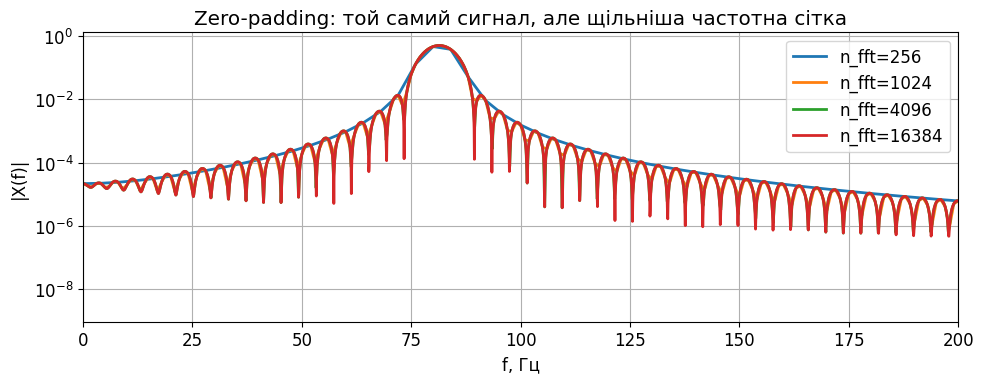

In [ ]:
Fs = 1024.0
N = 256
t = np.arange(N)/Fs
df = Fs/N
f_off = 20*df + 0.35*df
x = np.sin(2*np.pi*f_off*t)

nffts = [256, 1024, 4096, 16384]
plt.figure(figsize=(10, 4))
for n_fft in nffts:
    f, mag = rfft_mag(x, Fs, n_fft=n_fft, window=np.hanning, amp_correction=True)
    plt.semilogy(f, np.maximum(mag, 1e-14), label=f"n_fft={n_fft}")
plt.title("Zero-padding: той самий сигнал, але щільніша частотна сітка")
plt.xlabel("f, Гц"); plt.ylabel("|X(f)|"); plt.xlim(0, 200)
plt.legend(); plt.grid(True, which="both")
plt.tight_layout(); plt.show()

## 6.4 Scalloping loss: “провал” амплітуди між бінами

Навіть без leakage, оцінка амплітуди гармоніки через максимум бінів DFT залежить від того,
наскільки частота потрапляє в центр біна.

Це називається scalloping loss. Вікна зменшують leakage, але scalloping loss залишається,
хоча його величина залежить від вікна.

Побудуємо залежність пікової амплітуди від дробової відстані до центра біна.

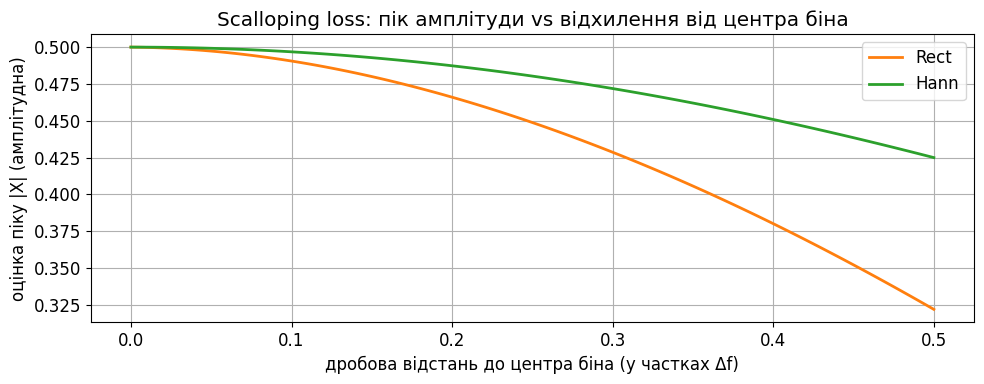

In [ ]:
Fs = 1024.0
N = 256
t = np.arange(N)/Fs
df = Fs/N
k0 = 20
base = k0*df

fracs = np.linspace(0, 0.5, 101)  # від центра біна до межі між бінами
peak_rect, peak_hann = [], []

for a in fracs:
    f0 = base + a*df
    x = np.sin(2*np.pi*f0*t)
    f, mr = rfft_mag(x, Fs, n_fft=N, window=lambda n: np.ones(n), amp_correction=True)
    _, mh = rfft_mag(x, Fs, n_fft=N, window=np.hanning, amp_correction=True)
    peak_rect.append(np.max(mr))
    peak_hann.append(np.max(mh))

plt.figure(figsize=(10, 4))
plt.plot(fracs, peak_rect, label="Rect", color="C1")
plt.plot(fracs, peak_hann, label="Hann", color="C2")
plt.title("Scalloping loss: пік амплітуди vs відхилення від центра біна")
plt.xlabel("дробова відстань до центра біна (у частках Δf)")
plt.ylabel("оцінка піку |X| (амплітудна)")
plt.legend(); plt.tight_layout(); plt.show()

## 6.5 Антиаліайзинг і ресемплінг: чому перед decimation потрібен НЧ‑фільтр

Якщо ми зменшуємо частоту дискретизації у $M$ разів (decimation),
то нова частота Найквіста стає $F_s/(2M)$.

Щоб високочастотні компоненти не “загорнулись” (aliasing), перед зменшенням $F_s$
потрібно застосувати **антиаліайзинг НЧ‑фільтр** з частотою зрізу нижче нового Найквіста.

Схема:
1) $x[n]$ → НЧ‑фільтр $h[n]$ → $y[n]$
2) $y[n]$ беремо кожен $M$‑тий відлік: $y_d[m] = y[mM]$

Покажемо приклад: сигнал містить складову вище нового Найквіста і вона зааліаситься без фільтра.

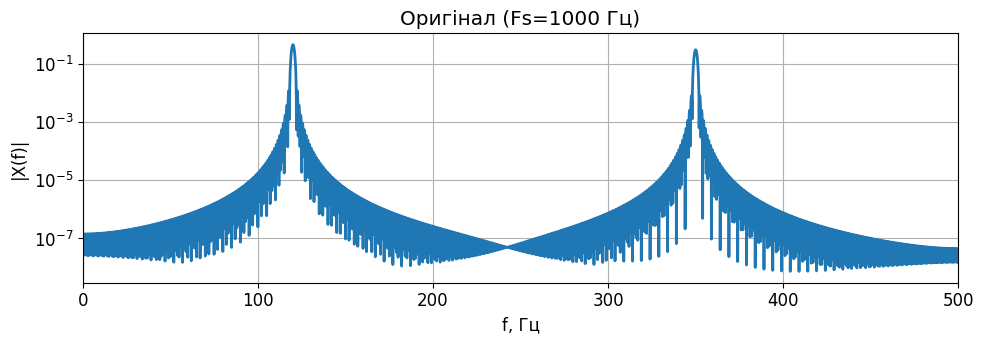

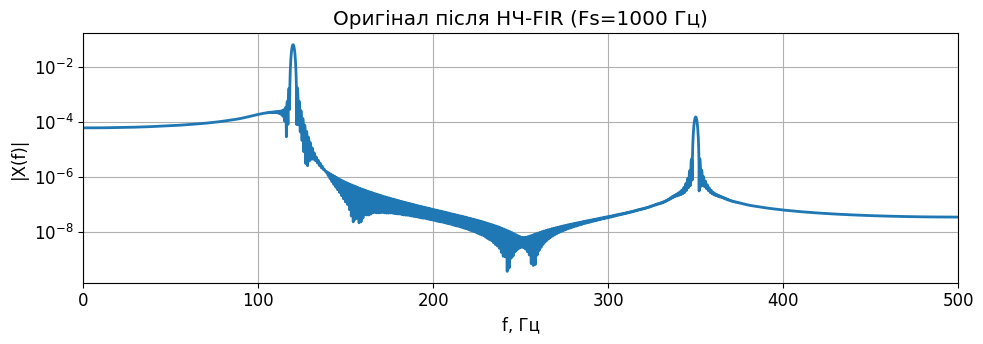

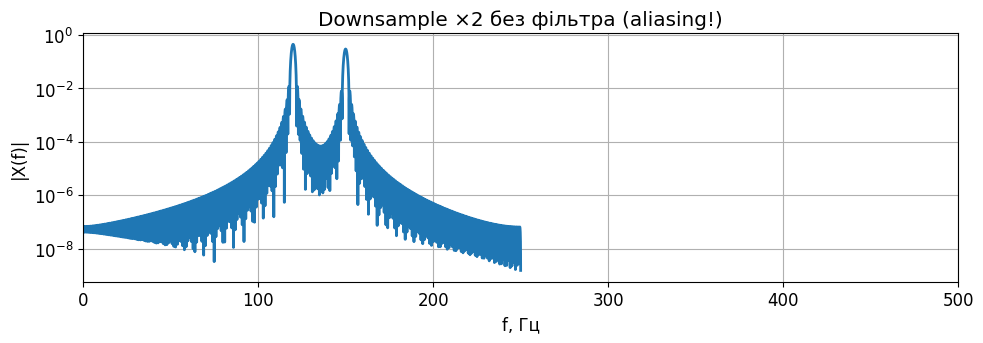

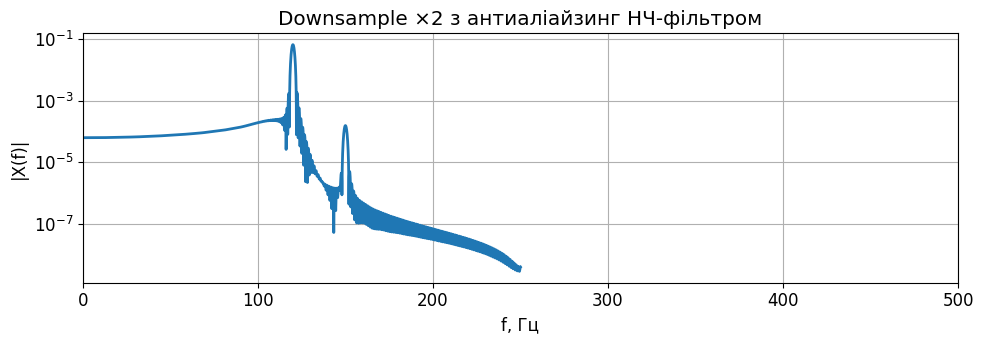

In [ ]:
Fs = 1000.0
T = 1.0
t = np.arange(int(Fs*T))/Fs

# Компонента 120 Гц (OK), і 380 Гц (проблемна при downsample в 2 рази: новий Nyq=250 Гц)
x = 0.9*np.sin(2*np.pi*120*t) + 0.6*np.sin(2*np.pi*350*t)

M = 2
Fs2 = Fs / M

# Downsample без фільтра
x_ds = x[::M]

# Anti-aliasing: FIR low-pass з cutoff трохи нижче Fs2/2
cutoff = 0.45*(Fs2/2)          # 0.45*Nyquist_new
numtaps = 101
h = signal.firwin(numtaps, cutoff, fs=Fs)
x_f = signal.lfilter(h, [1.0], x)
x_f_ds = x_f[::M]

# Спектри
f, mx = rfft_mag(x, Fs, n_fft=16384, window=np.hanning)
f, mx2 = rfft_mag(x_f, Fs, n_fft=16384, window=np.hanning)
f2, m_ds  = rfft_mag(x_ds, Fs2, n_fft=16384, window=np.hanning)
_,  m_fds = rfft_mag(x_f_ds, Fs2, n_fft=16384, window=np.hanning)

plot_spec(f,  mx,   Fs,  title="Оригінал (Fs=1000 Гц)", xlim=(0, 500), ylog=True)
plot_spec(f,  mx2,   Fs,  title="Оригінал після НЧ-FIR (Fs=1000 Гц)", xlim=(0, 500), ylog=True)
plot_spec(f2, m_ds, Fs2, title="Downsample ×2 без фільтра (aliasing!)", xlim=(0, 500), ylog=True)
plot_spec(f2, m_fds,Fs2, title="Downsample ×2 з антиаліайзинг НЧ‑фільтром", xlim=(0, 500), ylog=True)

## 6.6 (Опційно) Ідея поліпшеної оцінки частоти/амплітуди: пікова інтерполяція

Zero-padding дає щільнішу сітку, але можна піти далі: оцінювати частоту піку між бінів
через параболічну інтерполяцію максимуму у лог-амплітуді або амплітуді.

Це корисно як практичний трюк, але важливо пам’ятати: точність залежить від SNR, вікна і leakage.

f_true = 79.4921875 Hz | f_est ≈ 79.49222364835128 Hz | peak ≈ 0.4999991923249523


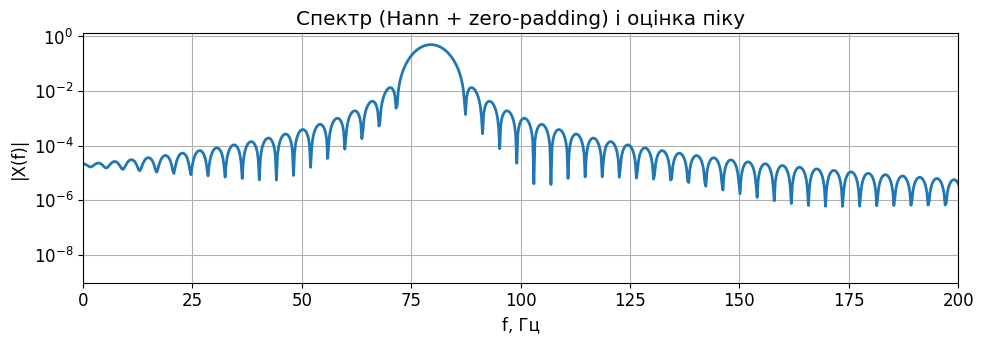

In [ ]:
def parabolic_peak(f, mag):
    """Оцінка піку між трьома бін-значеннями (парабола). Повертає f_est, mag_est."""
    k = np.argmax(mag)
    if k == 0 or k == len(mag)-1:
        return f[k], mag[k]
    y0, y1, y2 = mag[k-1], mag[k], mag[k+1]
    denom = (y0 - 2*y1 + y2)
    if np.abs(denom) < 1e-15:
        return f[k], mag[k]
    p = 0.5*(y0 - y2)/denom  # зсув у бін-одиницях
    f_est = f[k] + p*(f[1]-f[0])
    mag_est = y1 - 0.25*(y0 - y2)*p
    return f_est, mag_est

Fs = 1000.0; N = 256
t = np.arange(N)/Fs
df = Fs/N
f_true = 20*df + 0.35*df
x = np.sin(2*np.pi*f_true*t)

f, mag = rfft_mag(x, Fs, n_fft=4096, window=np.hanning)
f_est, a_est = parabolic_peak(f, mag)
print("f_true =", f_true, "Hz | f_est ≈", f_est, "Hz | peak ≈", a_est)
plot_spec(f, mag, Fs, title="Спектр (Hann + zero-padding) і оцінка піку", xlim=(0, 200), ylog=True)

## Підсумок (Розділ 6)

1) **Leakage** неминучий при обрізанні сигналу у часі (прямокутне вікно).  
2) **Вікна** зменшують leakage (нижчі бокові пелюстки), але зменшують роздільну здатність (ширша головна пелюстка) та потребують амплітудної корекції.  
3) **Zero‑padding** дає щільнішу частотну сітку, але не додає інформації і не покращує справжню роздільну здатність.  
4) **Scalloping loss** пояснює, чому амплітуда піку залежить від того, де частота лежить відносно біну.  
5) При **зменшенні частоти дискретизації** потрібен **антиаліайзинг НЧ‑фільтр**, інакше виникає aliasing.

# Підрозділ 6.7 — PSD (Power Spectral Density) та метод Вельча (Welch)

**Мета:** показати різницю між FFT-спектром і PSD, проблеми періодограми (висока дисперсія), і як Welch зменшує дисперсію ціною частотної роздільної здатності.

У цьому notebook ми:
1) побудуємо **періодограму** та **Welch PSD**,  
2) покажемо **дисперсію** оцінки (periodogram vs Welch),  
3) продемонструємо, що **zero-padding не “лікує” шумність PSD**,  
4) перевіримо властивість: інтеграл PSD по частоті ≈ середня потужність сигналу.

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import signal

plt.rcParams.update({
    "figure.figsize": (10, 4),
    "axes.grid": True,
    "lines.linewidth": 2,
    "font.size": 12
})

rng = np.random.default_rng(0)

## 6.7.1 Допоміжні функції для побудови PSD

Ми будемо використовувати:
- `scipy.signal.periodogram` як базову (наївну) оцінку PSD;
- `scipy.signal.welch` як усереднену оцінку PSD.

Нагадування про одиниці:
- PSD має одиниці “сигнал² / Гц”, наприклад $V^2/Hz$.
- Для коректності важливі параметри `fs`, `window`, `nperseg`, `noverlap`, `nfft`, `scaling='density'`.

In [ ]:
def plot_psd(f, Pxx, title="", xlim=None, ylim=None, db=True):
    plt.figure(figsize=(10, 3.6))
    if db:
        y = 10*np.log10(np.maximum(Pxx, 1e-20))
        plt.plot(f, y, color="C2")
        plt.ylabel("PSD, dB/Hz")
    else:
        plt.plot(f, Pxx, color="C2")
        plt.ylabel("PSD, (unit^2)/Hz")
    plt.xlabel("f, Гц")
    plt.title(title)
    if xlim is not None:
        plt.xlim(*xlim)
    if ylim is not None:
        plt.ylim(*ylim)
    plt.tight_layout()
    plt.show()

def bandpower_from_psd(f, Pxx, f1=0.0, f2=None):
    if f2 is None:
        f2 = f[-1]
    mask = (f >= f1) & (f <= f2)
    return np.trapezoid(Pxx[mask], f[mask])

## 6.7.2 Сигнали для демонстрації

Ми будемо використовувати три типи сигналів:

1) **Білий шум** — для демонстрації того, що FFT/periodogram дуже “шумні”, а Welch стабілізує оцінку.
2) **Синус + шум** — для демонстрації піку над шумовим фоном.
3) **Фільтрований шум** — PSD повинна відображати форму АЧХ фільтра.

Параметри за замовчуванням:
- $F_s = 2000$ Гц
- тривалість $T = 2$ c (можна міняти для експериментів)

In [ ]:
Fs = 2000.0
T = 2.0
N = int(Fs*T)
t = np.arange(N)/Fs

# (1) білий шум
x_noise = rng.normal(0, 1.0, size=N)

# (2) синус + шум
f0 = 123.0
x_sin = 0.8*np.sin(2*np.pi*f0*t)
x_sin_noise = x_sin + 0.3*rng.normal(0, 1.0, size=N)

# (3) фільтрований шум: НЧ FIR
numtaps = 257
cutoff = 250.0
h = signal.firwin(numtaps, cutoff, fs=Fs)
x_filt_noise = signal.lfilter(h, [1.0], x_noise)

## 6.7.3 FFT-спектр vs PSD (концептуальна різниця)

FFT-амплітудний спектр (наприклад $|X(f)|$) показує “що є в реалізації” і не має змісту “потужності на 1 Гц”.

PSD оцінює **щільність потужності** — так, що інтеграл PSD по частоті дає середню потужність сигналу:

$$
\int_0^{F_s/2} S_{xx}(f)\,df \approx \mathbb{E}\{x^2[n]\}.
$$

Далі ми фокусуємось саме на PSD-оцінках: periodogram та Welch.

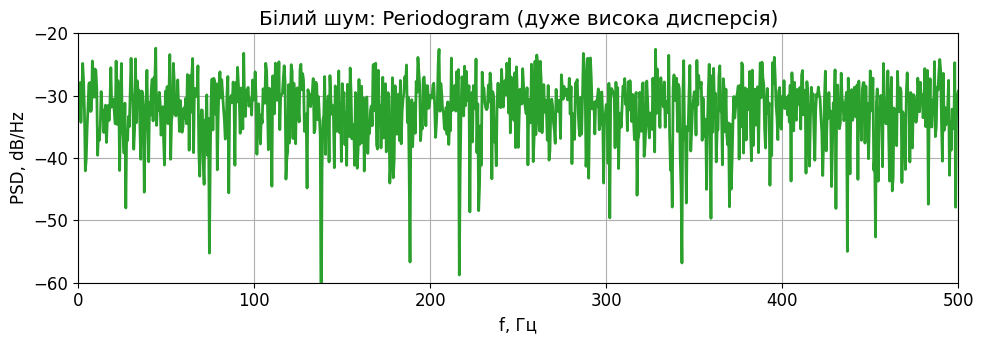

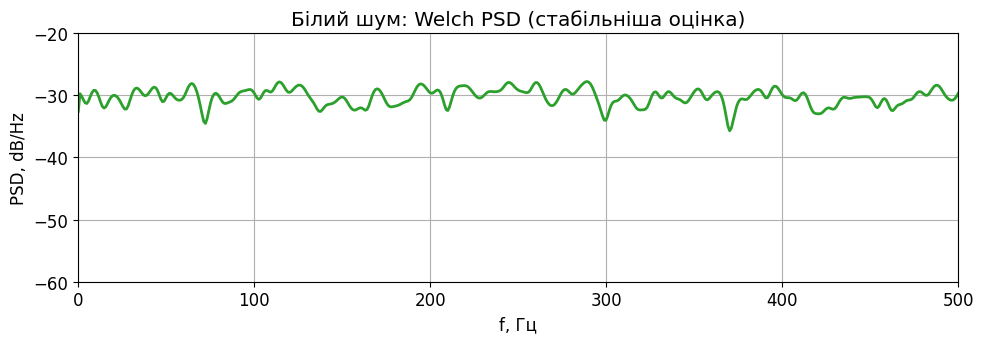

In [ ]:
# Periodogram (наївна PSD)
f_p, Pxx_p = signal.periodogram(
    x_noise, fs=Fs, window="boxcar", nfft=N, scaling="density", detrend=False
)

# Welch PSD (усереднення сегментів)
f_w, Pxx_w = signal.welch(
    x_noise, fs=Fs, window="hann", nperseg=512, noverlap=256,
    nfft=2048, scaling="density", detrend=False
)

plot_psd(f_p, Pxx_p, title="Білий шум: Periodogram (дуже висока дисперсія)", xlim=(0, 500), ylim=(-60, -20))
plot_psd(f_w, Pxx_w, title="Білий шум: Welch PSD (стабільніша оцінка)", xlim=(0, 500), ylim=(-60, -20))

## 6.7.4 Періодограма: головна проблема — висока дисперсія

Періодограма є нестабільною: навіть при великому $N$ її дисперсія не зникає.
Тому “зубчастий” вигляд спектра шуму — норма, а не баг.

Ідея Welch:
- розбити сигнал на сегменти,
- порахувати periodogram кожного сегмента,
- усереднити → дисперсія падає приблизно як $1/K$ (де $K$ — число сегментів).

У наступній комірці ми робимо ансамбль із M незалежних реалізацій білого шуму і для кожної:

1) рахуємо periodogram PSD та Welch PSD,
2) беремо значення PSD на одній і тій самій частоті f_target,
3) оцінюємо mean та std по ансамблю.

Це демонструє:
- **незміщеність** оцінки (mean),
- **дисперсію** оцінки (std),
- і головне: Welch має **значно менший std**, бо усереднює багато сегментів.

Чому можна взяти одну частоту:
для білого шуму істинна PSD ≈ константа, тому статистика в будь-якому біні приблизно однакова (за винятком країв і нюансів вікна).

In [ ]:
Fs = 2000.0
N = 4096
t = np.arange(N)/Fs

M = 200  # кількість реалізацій шуму
f_target = 300.0

vals_p = []
vals_w = []

for _ in range(M):
    x = rng.normal(0, 1.0, size=N)

    f_p, Pp = signal.periodogram(
        x, fs=Fs, window="hann", nfft=N, scaling="density", detrend=False
    )
    fw, Pw = signal.welch(
        x, fs=Fs, window="hann", nperseg=256, noverlap=128,
        nfft=N, scaling="density", detrend=False
    )

    kp = np.argmin(np.abs(f_p - f_target))
    kw = np.argmin(np.abs(fw  - f_target))
    vals_p.append(Pp[kp])
    vals_w.append(Pw[kw])

vals_p = np.array(vals_p)
vals_w = np.array(vals_w)

print("Periodogram: mean =", vals_p.mean(), " std =", vals_p.std())
print("Welch:       mean =", vals_w.mean(), " std =", vals_w.std())
print("Std ratio (P/W) ≈", vals_p.std()/vals_w.std())

Periodogram: mean = 0.0009982380037930497  std = 0.0008807366067953866
Welch:       mean = 0.000998325297744731  std = 0.00017161933019250024
Std ratio (P/W) ≈ 5.131919614226969


## 6.7.5 Zero-padding: “гладший” графік ≠ краща PSD-оцінка

Zero-padding (збільшення `nfft`) робить частотну сітку щільнішою, але **не зменшує дисперсію** оцінки.
Тому спектр виглядає “красивіше”, проте статистично це та сама оцінка.

Покажемо один і той самий шум із різними `nfft`.

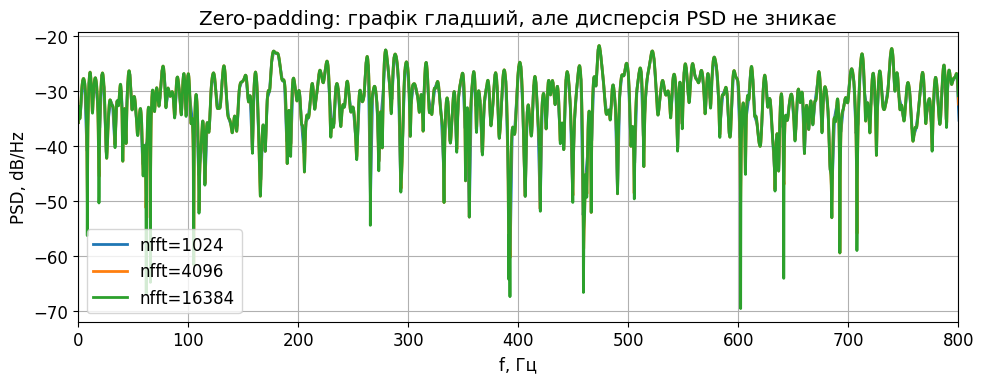

In [ ]:
Fs = 2000.0
N = 1024
x = rng.normal(0, 1.0, size=N)

nffts = [N, 4*N, 16*N]
plt.figure(figsize=(10, 4))
for nfft in nffts:
    f, Pxx = signal.periodogram(x, fs=Fs, window="hann", nfft=nfft, scaling="density", detrend=False)
    y = 10*np.log10(np.maximum(Pxx, 1e-20))
    plt.plot(f, y, label=f"nfft={nfft}")
plt.title("Zero-padding: графік гладший, але дисперсія PSD не зникає")
plt.xlabel("f, Гц"); plt.ylabel("PSD, dB/Hz"); plt.xlim(0, 800)
plt.legend(); plt.tight_layout(); plt.show()

## 6.7.6 Параметри Welch: компроміс (дисперсія ↔ роздільна здатність)

Welch зменшує дисперсію за рахунок усереднення сегментів, але частотна роздільна здатність визначається довжиною сегмента:

$$
\Delta f \approx \frac{F_s}{L},
$$

де $L$ — `nperseg`.

- Більший `nperseg` → краща роздільна здатність, але менше сегментів → більша дисперсія.
- Менший `nperseg` → гірша роздільна здатність, але більше усереднення → стабільніша оцінка.

Покажемо Welch для одного шуму з різними `nperseg`.

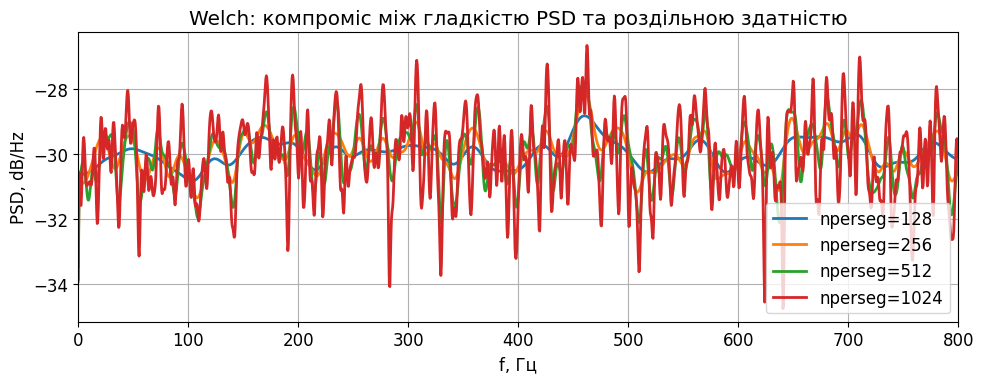

In [ ]:
Fs = 2000.0
N = 8192
x = rng.normal(0, 1.0, size=N)

configs = [128, 256, 512, 1024]
plt.figure(figsize=(10, 4))
for L in configs:
    f, Pxx = signal.welch(
        x, fs=Fs, window="hann", nperseg=L, noverlap=L//2,
        nfft=4096, scaling="density", detrend=False
    )
    plt.plot(f, 10*np.log10(np.maximum(Pxx, 1e-20)), label=f"nperseg={L}")
plt.title("Welch: компроміс між гладкістю PSD та роздільною здатністю")
plt.xlabel("f, Гц"); plt.ylabel("PSD, dB/Hz"); plt.xlim(0, 800)
plt.legend(); plt.tight_layout(); plt.show()

## 6.7.7 Приклад: синус + шум (пік над шумовим фоном)

Цей приклад показує:
- FFT/periodogram може мати “пилообразний” шумовий фон,
- Welch дає більш стабільний рівень шумової підлоги,
- пік синуса виділяється краще, і зручніше оцінити SNR в частотній області.

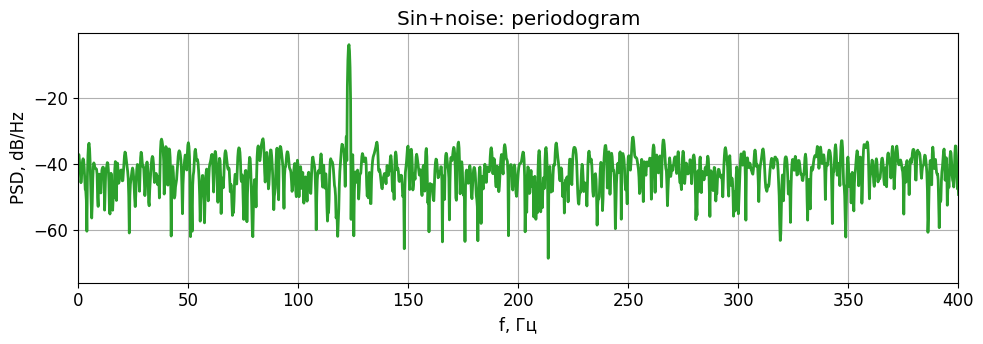

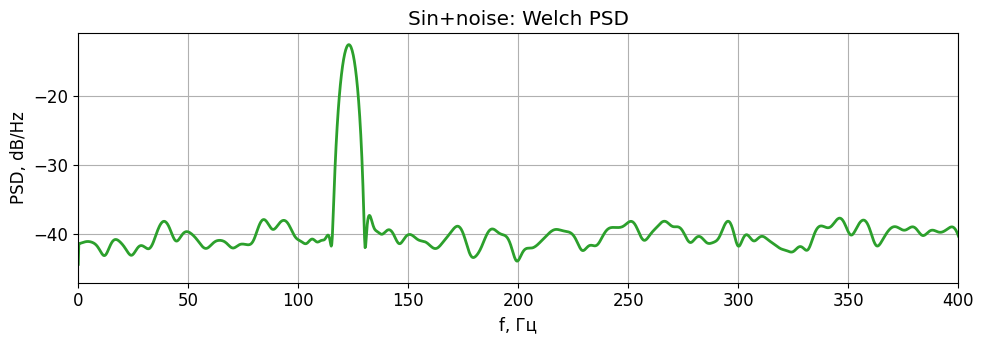

In [ ]:
Fs = 2000.0
T = 2.0
N = int(Fs*T)
t = np.arange(N)/Fs

f0 = 123.0
x = 0.8*np.sin(2*np.pi*f0*t) + 0.3*rng.normal(0, 1.0, size=N)

f_p, Pp = signal.periodogram(x, fs=Fs, window="hann", nfft=8192, scaling="density", detrend=False)
f_w, Pw = signal.welch(x, fs=Fs, window="hann", nperseg=512, noverlap=256, nfft=8192, scaling="density", detrend=False)

plot_psd(f_p, Pp, title="Sin+noise: periodogram", xlim=(0, 400))
plot_psd(f_w, Pw, title="Sin+noise: Welch PSD", xlim=(0, 400))

## 6.7.8 Приклад: фільтрований шум — PSD повторює АЧХ фільтра

Якщо білий шум пропустити через лінійну систему (фільтр) з передатною функцією $H(f)$, то PSD на виході:

$$
S_{yy}(f) = |H(f)|^2 \, S_{xx}(f).
$$

Для білого шуму $S_{xx}(f)\approx const$, отже PSD виходу пропорційна $|H(f)|^2$.

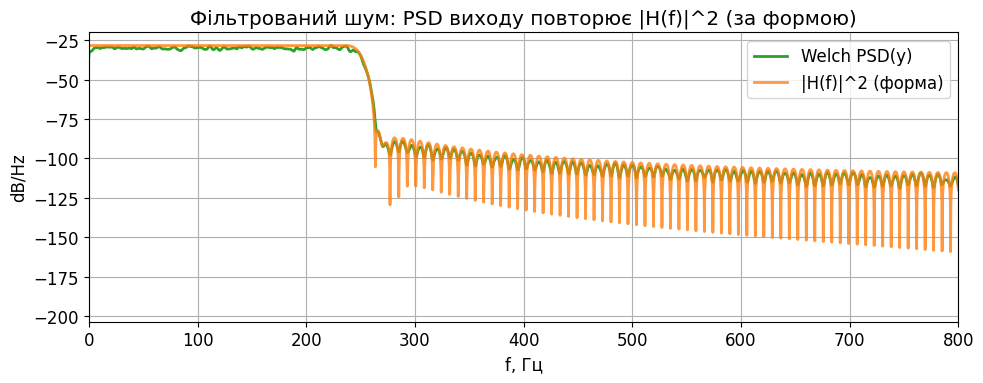

In [ ]:
Fs = 2000.0
N = 20000
x = rng.normal(0, 1.0, size=N)

numtaps = 257
cutoff = 250.0
h = signal.firwin(numtaps, cutoff, fs=Fs)
y = signal.lfilter(h, [1.0], x)

f, Pyy = signal.welch(y, fs=Fs, window="hann", nperseg=1024, noverlap=512, nfft=8192, scaling="density", detrend=False)

# Частотна характеристика фільтра
w, H = signal.freqz(h, worN=4096, fs=Fs)
H2 = np.abs(H)**2
H2 /= np.max(H2)  # нормуємо лише для порівняння форми

plt.figure(figsize=(10, 4))
plt.plot(f, 10*np.log10(np.maximum(Pyy, 1e-20)), label="Welch PSD(y)", color="C2")
plt.plot(w, 10*np.log10(np.maximum(H2*np.max(Pyy), 1e-20)), label="|H(f)|^2 (форма)", color="C1", alpha=0.8)
plt.title("Фільтрований шум: PSD виходу повторює |H(f)|^2 (за формою)")
plt.xlabel("f, Гц"); plt.ylabel("dB/Hz"); plt.xlim(0, 800)
plt.legend(); plt.tight_layout(); plt.show()

## 6.7.9 Перевірка: інтеграл PSD ≈ середня потужність сигналу

Для PSD у режимі `scaling='density'` має виконуватись (приблизно):

$$
\int_0^{F_s/2} S_{xx}(f)\,df \approx \mathbb{E}\{x^2[n]\}.
$$

Тут ми перевіримо це на реальному прикладі, використовуючи Welch PSD.

In [ ]:
Fs = 2000.0
N = 20000
x = 0.8*np.sin(2*np.pi*123*np.arange(N)/Fs) + 0.3*rng.normal(0, 1.0, size=N)

f, Pxx = signal.welch(x, fs=Fs, window="hann", nperseg=2048, noverlap=1024, nfft=8192, scaling="density", detrend=False)

p_time = np.mean(x**2)
p_psd = bandpower_from_psd(f, Pxx, 0.0, Fs/2)

print("Mean power (time) =", p_time)
print("Integral PSD df   =", p_psd)
print("Relative error    =", (p_psd - p_time)/p_time)

Mean power (time) = 0.4108780847292952
Integral PSD df   = 0.4114106767709118
Relative error    = 0.0012962288849440408


## Підсумок підрозділу 6.7 (PSD/Welch)

1) **PSD** описує розподіл потужності по частотах і має одиниці “сигнал²/Гц”.  
2) **Періодограма** — проста оцінка PSD, але має **високу дисперсію** (нестабільна).  
3) **Welch** зменшує дисперсію завдяки усередненню сегментів, але погіршує частотну роздільну здатність.  
4) **Zero-padding** робить частотну сітку щільнішою, але **не** покращує статистичну якість PSD.  
5) Для `scaling='density'` інтеграл PSD по частоті узгоджується з середньою потужністю сигналу.

# 6.8 Надрозрізнення (super-resolution) через AR‑модель та екстраполяцію сигналу

**Ідея демонстрації:** маємо сигнал як суму **3 загасаючих синусоїд** (дві близькі моди + третя біля $2f_0$), додаємо невеликий шум і спостерігаємо лише коротке вікно ($\approx 6$ періодів найвищої гармоніки).  
На такому короткому інтервалі дві близькі моди **зливаються** у спектрі FFT. Далі ми:

1) оцінюємо **AR(p)** модель на короткому фрагменті (LS‑оцінка),  
2) робимо **стабілізацію** (корені всередину одиничного кола),  
3) екстраполюємо сигнал до часу, коли огинаюча стає < $10^{-4}$ від максимуму,  
4) порівнюємо спектри:
   - FFT(short) — піки злиті,
   - AR‑PSD(short) — уже “натяк” на два піки,
   - FFT(extrapolated) — два піки розділяються,
   - FFT(truth long) — референс із довгого точного сигналу.

**Умови:** 1D сигнал, 3 моди, малий шум (імітація roundoff/числової дисперсії).

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import signal

plt.rcParams.update({
    "figure.figsize": (10, 4),
    "axes.grid": True,
    "lines.linewidth": 2,
    "font.size": 12
})

rng = np.random.default_rng(0)

## 6.8.1 Параметри експерименту (default)

- Дві близькі моди: $f_1=98$ Гц, $f_2=102$ Гц (на короткому вікні зливаються)
- Третя мода: $f_3=200$ Гц (≈ $2f_0$)
- Дискретизація: $F_s=4096$ Гц
- Вікно спостереження: $T_\text{obs}=6/f_3$ (≈ 6 періодів найвищої гармоніки)
- Затухання: $\alpha_1=\alpha_2=10\,s^{-1}$, $\alpha_3=15\,s^{-1}$
- Поріг “кінець екстраполяції”: огинаюча < $10^{-4}$ від максимуму  
  $$T_\text{end}\approx \frac{\ln(10^4)}{\alpha_{\min}}$$
- AR порядок: $p=6$ (≈ $2K$ для $K=3$ мод)
- Шум: SNR ≈ 50 dB (мала добавка до точного сигналу)

In [ ]:
Fs = 4096.0

f1, f2, f3 = 98.0, 102.0, 200.0
alphas = np.array([10.0, 10.0, 15.0])      # 1/s
freqs  = np.array([f1, f2, f3])

A = np.array([1.0, 0.9, 0.35])
phi = rng.uniform(0, 2*np.pi, size=3)

T_obs = 20 / f3
alpha_min = float(np.min(alphas))
T_end = np.log(1e4) / alpha_min

p = 6
SNR_db = 50.0

print("T_obs =", T_obs, "s  |  T_end ≈", T_end, "s  |  N_obs ≈", int(Fs*T_obs),
      " |  N_extr ≈", int(Fs*T_end))

T_obs = 0.1 s  |  T_end ≈ 0.9210340371976183 s  |  N_obs ≈ 409  |  N_extr ≈ 3772


## 6.8.2 Генерація “truth” сигналу та короткого спостереження

Модель сигналу:
$$
x(t)=\sum_{k=1}^{3} A_k e^{-\alpha_k t}\cos(2\pi f_k t+\phi_k)
$$

- **Truth**: генеруємо довгий сигнал на $[0, T_\text{end}]$ (референс).
- **Observation**: беремо лише початок $[0, T_\text{obs}]$ і додаємо малий шум.

In [ ]:
def damped_sum(t, freqs, alphas, A, phi):
    x = np.zeros_like(t, dtype=float)
    for fk, ak, Ak, ph in zip(freqs, alphas, A, phi):
        x += Ak * np.exp(-ak*t) * np.cos(2*np.pi*fk*t + ph)
    return x

t_ref = np.arange(int(np.ceil(Fs*T_end))) / Fs
x_ref = damped_sum(t_ref, freqs, alphas, A, phi)

t_obs = np.arange(int(np.ceil(Fs*T_obs))) / Fs
x_obs_clean = damped_sum(t_obs, freqs, alphas, A, phi)

P_sig = np.mean(x_obs_clean**2)
P_noise = P_sig / (10**(SNR_db/10))
x_obs = x_obs_clean + rng.normal(0, np.sqrt(P_noise), size=len(x_obs_clean))

print("Ref length:", len(x_ref), "samples | Obs length:", len(x_obs), "samples")

Ref length: 3773 samples | Obs length: 410 samples


## 6.8.3 Бейзлайн: FFT короткого фрагмента vs FFT довгого truth

Ми очікуємо:
- на короткому $T_\text{obs}$ дві близькі моди $f_1,f_2$ зіллються в один “горб”,
- на довгому truth вони добре розділяються.

Для чесності використовуємо однакове вікно (Hann) і амплітудну корекцію (coherent gain).

In [ ]:
def rfft_amp(x, Fs, n_fft=65536, window="hann"):
    x = np.asarray(x, float)
    N = len(x)
    if window is None:
        w = np.ones(N)
    else:
        w = signal.get_window(window, N, fftbins=True)
    cg = np.sum(w)/N
    X = np.fft.rfft(x*w, n=n_fft)
    f = np.fft.rfftfreq(n_fft, d=1/Fs)
    mag = np.abs(X) / (N*cg)
    return f, mag

def plot_spec_zoom(f, mag, title, xlim, ylog=True):
    plt.figure(figsize=(10, 3.6))
    y = np.maximum(mag, 1e-14)
    plt.semilogy(f, y) if ylog else plt.plot(f, y)
    plt.title(title); plt.xlabel("f, Гц"); plt.ylabel("|X(f)| (умовн.)")
    plt.xlim(*xlim); plt.tight_layout(); plt.show()

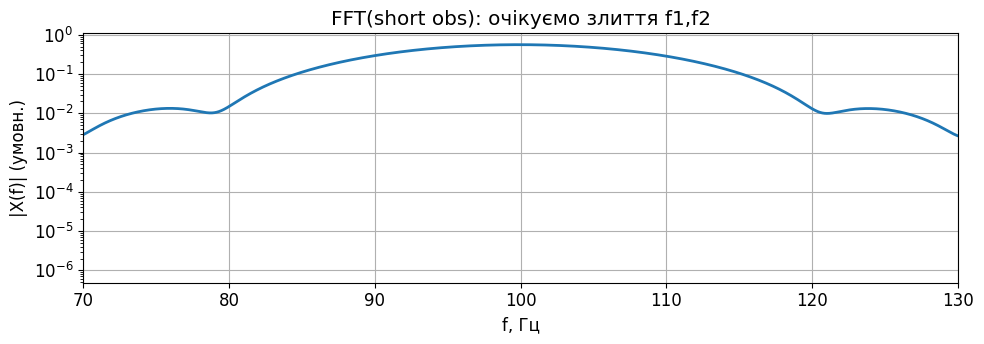

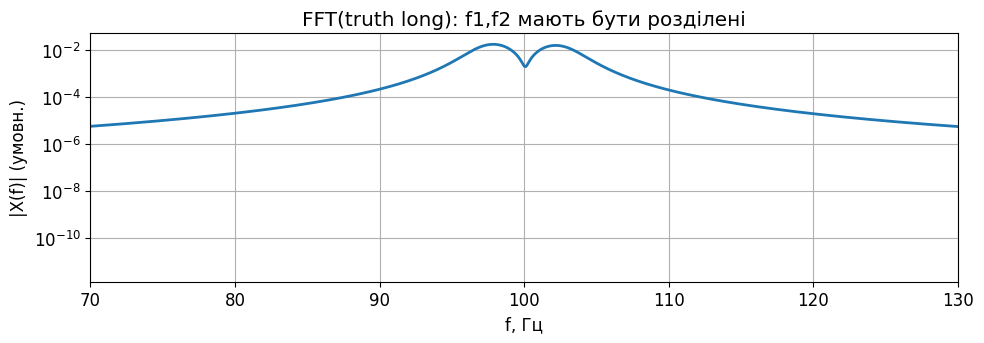

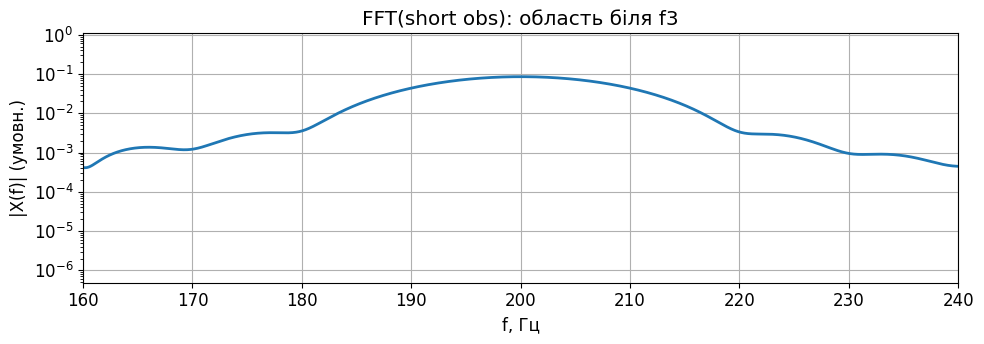

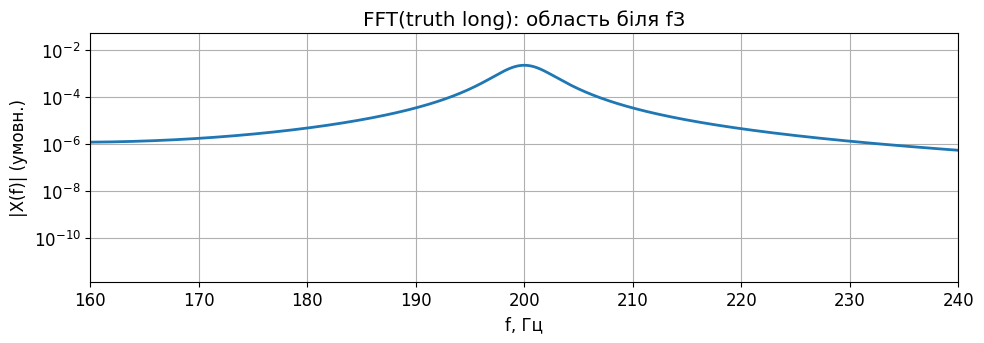

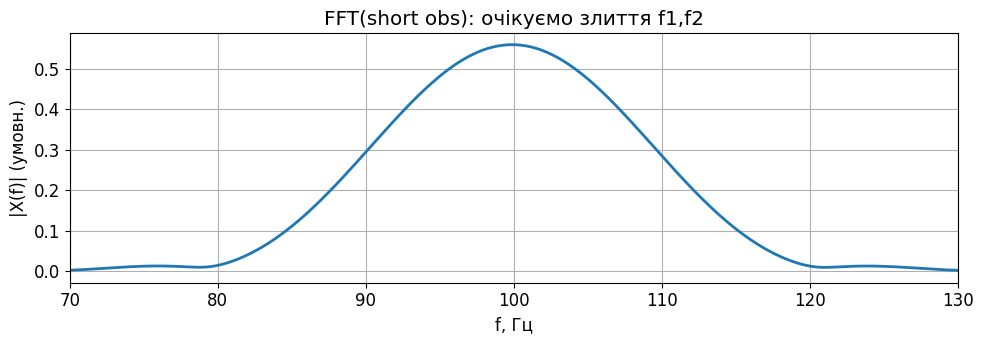

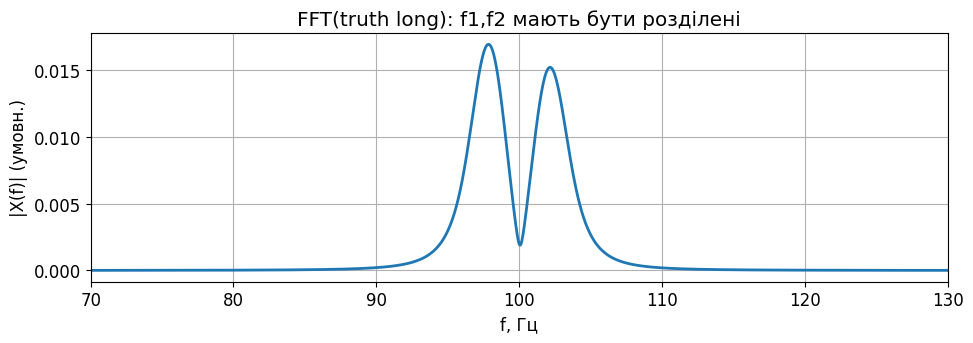

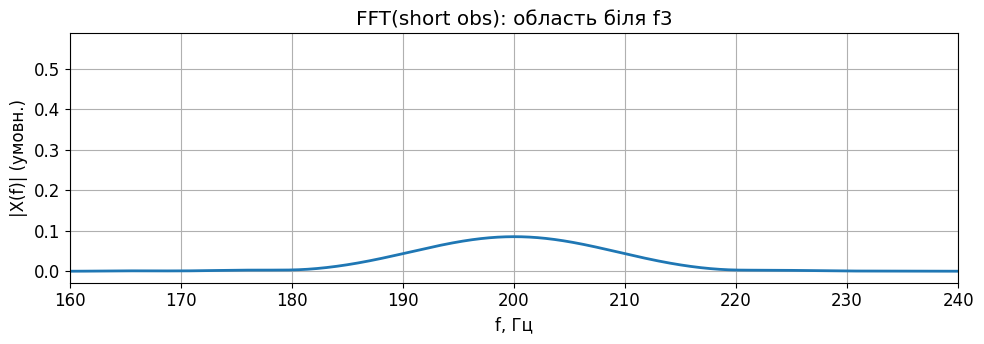

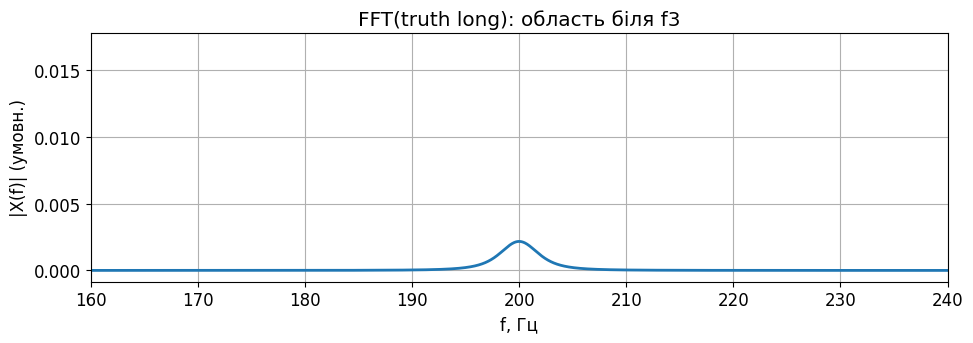

In [ ]:
fR, mR = rfft_amp(x_ref, Fs, n_fft=262144, window="hann")
fO, mO = rfft_amp(x_obs, Fs, n_fft=262144, window="hann")

plot_spec_zoom(fO, mO, "FFT(short obs): очікуємо злиття f1,f2", xlim=(70, 130), ylog=True)
plot_spec_zoom(fR, mR, "FFT(truth long): f1,f2 мають бути розділені", xlim=(70, 130), ylog=True)

plot_spec_zoom(fO, mO, "FFT(short obs): область біля f3", xlim=(160, 240), ylog=True)
plot_spec_zoom(fR, mR, "FFT(truth long): область біля f3", xlim=(160, 240), ylog=True)

plot_spec_zoom(fO, mO, "FFT(short obs): очікуємо злиття f1,f2", xlim=(70, 130), ylog=False)
plot_spec_zoom(fR, mR, "FFT(truth long): f1,f2 мають бути розділені", xlim=(70, 130), ylog=False)

plot_spec_zoom(fO, mO, "FFT(short obs): область біля f3", xlim=(160, 240), ylog=False)
plot_spec_zoom(fR, mR, "FFT(truth long): область біля f3", xlim=(160, 240), ylog=False)

## 6.8.4 AR(p) оцінка через Least Squares (forward prediction)

AR-модель:
$$
x[n] + \sum_{k=1}^{p} a_k x[n-k] = e[n]
$$
або еквівалентно:
$$
x[n] \approx -\sum_{k=1}^{p} a_k x[n-k]
$$

Ми оцінюємо коефіцієнти $a_k$ методом найменших квадратів на короткому фрагменті.

In [ ]:
def ar_ls_fit(x, p):
    x = np.asarray(x, float)
    N = len(x)
    if N <= p:
        raise ValueError("Need N > p")
    # y = x[p:], X rows = [x[n-1], x[n-2], ..., x[n-p]]
    y = x[p:]
    X = np.zeros((N-p, p), dtype=float)
    for k in range(1, p+1):
        X[:, k-1] = x[p-k:N-k]
    # solve y ≈ -X a  ->  X a ≈ -y
    a, *_ = np.linalg.lstsq(X, -y, rcond=None)
    # residuals
    e = y + X @ a
    sigma2 = np.mean(e**2)
    print("rel residuals:", sigma2 / np.mean(x**2))
    return a, sigma2

a_ls, sigma2_e = ar_ls_fit(x_obs, p)
print("a_ls:", np.array2string(a_ls, precision=4))
print("sigma_e^2:", sigma2_e)

rel residuals: 0.00010898455352265932
a_ls: [-2.1303  0.6737  0.9658 -0.1264 -0.6187  0.2433]
sigma_e^2: 6.988619632090556e-05


## 6.8.5 Стабілізація AR-моделі (root reflection)

Екстраполяція чутлива до нестабільності: якщо AR має корені поза одиничним колом, прогноз може “вибухнути”.
Тому робимо стабілізацію:

1) будуємо поліном:
$$
A(z)=1 + a_1 z^{-1}+ \dots + a_p z^{-p}
$$
2) знаходимо корені $r_i$ полінома в змінній $z$ (еквівалентно $z^p + a_1 z^{p-1} + \dots + a_p$),
3) якщо $|r_i|>1$, відображаємо всередину: $r_i \leftarrow 1/\overline{r_i}$,
4) відновлюємо коефіцієнти $a_k$.

Це стандартний практичний трюк для стабільного прогнозу.

In [ ]:
def ar_stabilize(a):
    a = np.asarray(a, float)
    p = len(a)
    # polynomial in z: z^p + a1 z^(p-1) + ... + ap
    poly = np.r_[1.0, a]
    roots = np.roots(poly)
    roots_st = roots.copy()
    for i, r in enumerate(roots_st):
        if np.abs(r) > 1.0:
            roots_st[i] = 1.0 / np.conj(r)
    poly_st = np.poly(roots_st)  # returns [1, a1, ..., ap]
    a_st = np.real_if_close(poly_st[1:], tol=1e-8).astype(float)
    return a_st, roots, roots_st

a_st, r0, r1 = ar_stabilize(a_ls)
print("max|root| before:", np.max(np.abs(r0)))
print("max|root| after: ", np.max(np.abs(r1)))

max|root| before: 0.9874106142380137
max|root| after:  0.9874106142380137


## 6.8.6 AR‑PSD (параметричний спектр) на короткому фрагменті

Оцінка PSD для AR(p):
$$
S_{xx}(f)\propto \frac{\sigma_e^2}{\left|1+\sum_{k=1}^{p} a_k e^{-j2\pi f k/F_s}\right|^2}.
$$

Це часто дає “вужчі” піки, ніж FFT на короткому вікні (особливо для сум гармонік/експонент).

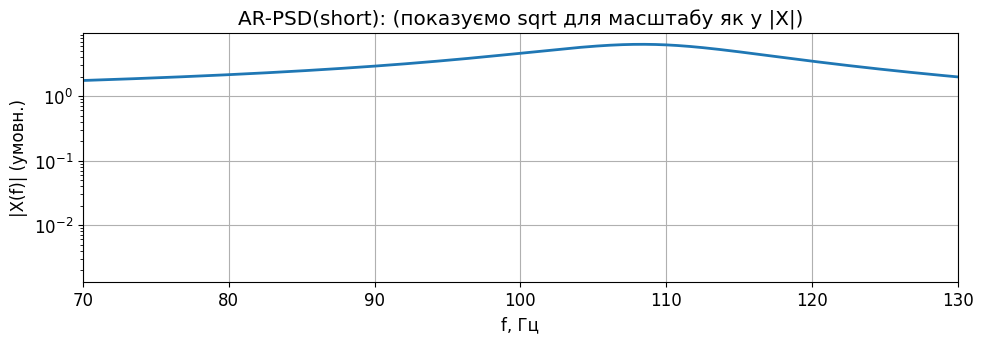

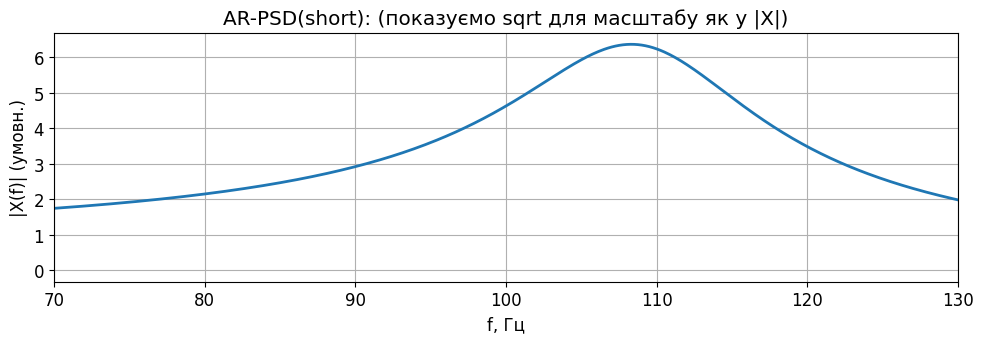

In [ ]:
def ar_psd(a, sigma2_e, Fs, n_f=8192):
    a = np.asarray(a, float)
    p = len(a)
    f = np.linspace(0, Fs/2, n_f)
    k = np.arange(1, p+1)
    E = np.exp(-1j*2*np.pi*(f[:, None]/Fs) * k[None, :])
    A = 1.0 + E @ a
    Pxx = sigma2_e / (np.abs(A)**2)
    return f, Pxx

f_psd, P_psd = ar_psd(a_st, sigma2_e, Fs, n_f=16384)
plot_spec_zoom(f_psd, np.sqrt(P_psd), "AR-PSD(short): (показуємо sqrt для масштабу як у |X|)", xlim=(70,130), ylog=True)
plot_spec_zoom(f_psd, np.sqrt(P_psd), "AR-PSD(short): (показуємо sqrt для масштабу як у |X|)", xlim=(70,130), ylog=False)

## 6.8.7 Екстраполяція сигналу до часу $T_\text{end}$

Ми будуємо extended сигнал довжини $N_\text{end}=\lceil F_s T_\text{end}\rceil$:
- перші $N_\text{obs}$ відліків — це спостереження,
- решта — прогноз AR(p) на основі останніх $p$ відліків.

Очікування: ефективна тривалість збільшується, і FFT(extrapolated) має розділити $f_1$ та $f_2$.

In [ ]:
def ar_extrapolate(x_init, a, N_total):
    x_init = np.asarray(x_init, float)
    a = np.asarray(a, float)
    p = len(a)
    x = np.zeros(N_total, dtype=float)
    N0 = len(x_init)
    x[:N0] = x_init
    for n in range(N0, N_total):
        past = x[n-p:n][::-1]  # [x[n-1],...,x[n-p]]
        x[n] = -np.dot(a, past)
    return x

N_end = int(np.ceil(Fs * T_end))
x_ext = ar_extrapolate(x_obs, a_st, N_end)
t_ext = np.arange(N_end)/Fs

print("Extended length:", N_end, "samples (T_end ≈", t_ext[-1], "s )")

Extended length: 3773 samples (T_end ≈ 0.9208984375 s )


## 6.8.8 Перевірка в часі: чи екстраполяція “схожа” на truth

Ми порівнюємо:
- truth на довгому інтервалі,
- екстрапольований сигнал.

Через шум та оцінку моделі ідеального збігу не буде, але тренд має бути правильний:
- форма та огинаюча,
- відсутність “вибухання” (стабілізація коренів).

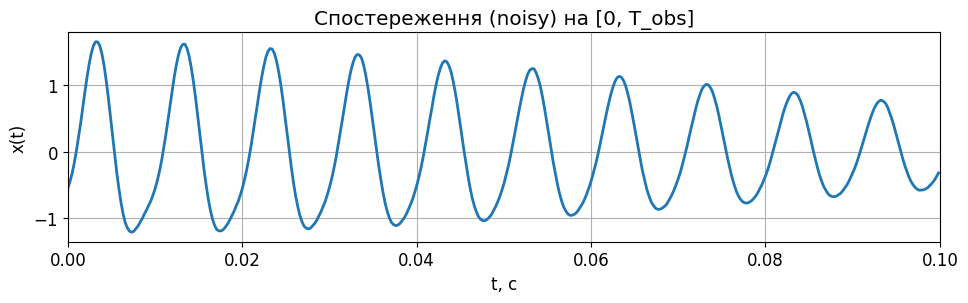

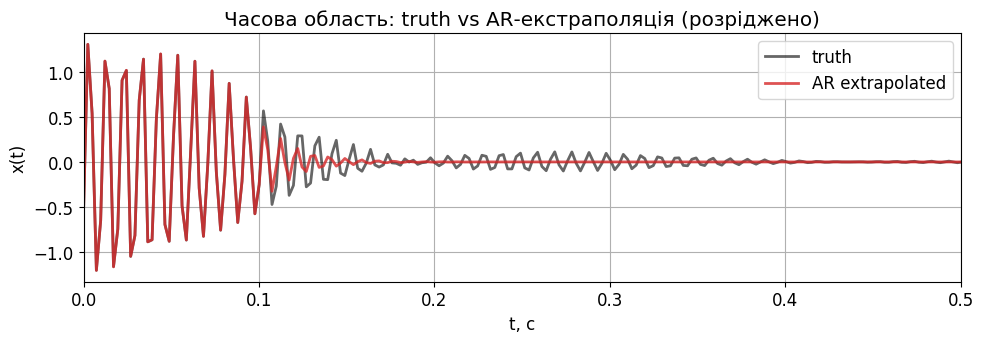

In [ ]:
def plot_time_segment(t, x, title, xlim):
    plt.figure(figsize=(10, 3.2))
    plt.plot(t, x, color="C0")
    plt.title(title); plt.xlabel("t, c"); plt.ylabel("x(t)")
    plt.xlim(*xlim); plt.tight_layout(); plt.show()

# Порівняємо на початку (де є спостереження)
plot_time_segment(t_obs, x_obs, "Спостереження (noisy) на [0, T_obs]", xlim=(0, T_obs))

# Порівняємо екстрапольований vs truth на довшому інтервалі (показуємо розріджено)
step = 10
plt.figure(figsize=(10, 3.6))
plt.plot(t_ref[::step], x_ref[::step], label="truth", color="k", alpha=0.6)
plt.plot(t_ext[::step], x_ext[::step], label="AR extrapolated", color="C3", alpha=0.8)
plt.title("Часова область: truth vs AR‑екстраполяція (розріджено)")
plt.xlabel("t, c"); plt.ylabel("x(t)")
plt.xlim(0, min(T_end, 0.5))
plt.legend(); plt.tight_layout(); plt.show()

## 6.8.9 Спектр після екстраполяції: надрозрізнення

Тепер порівнюємо спектри:
- FFT(short obs) — два піки злиті,
- FFT(extrapolated) — два піки розділяються,
- FFT(truth long) — reference.

Усі FFT рахуємо з однаковим вікном (Hann) і великим `n_fft` для гладкої частотної сітки.

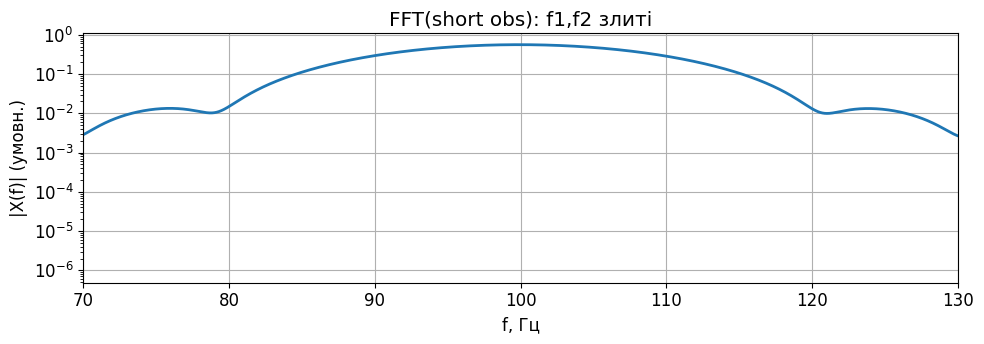

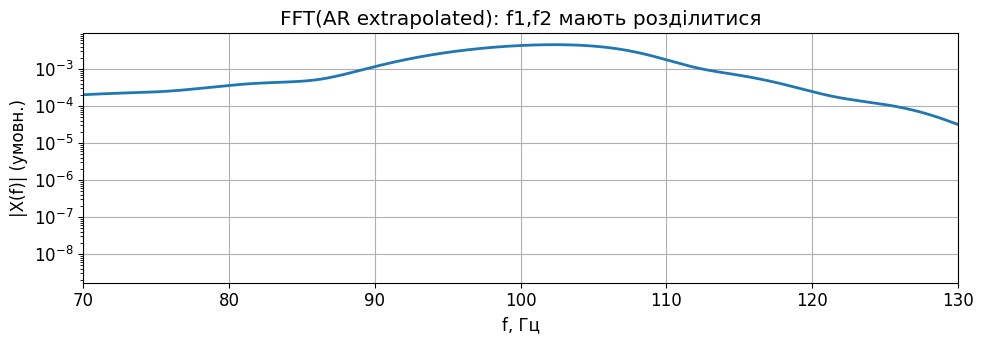

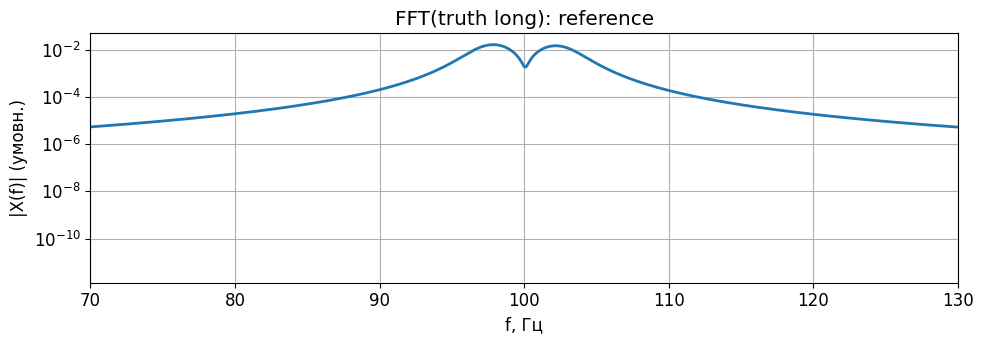

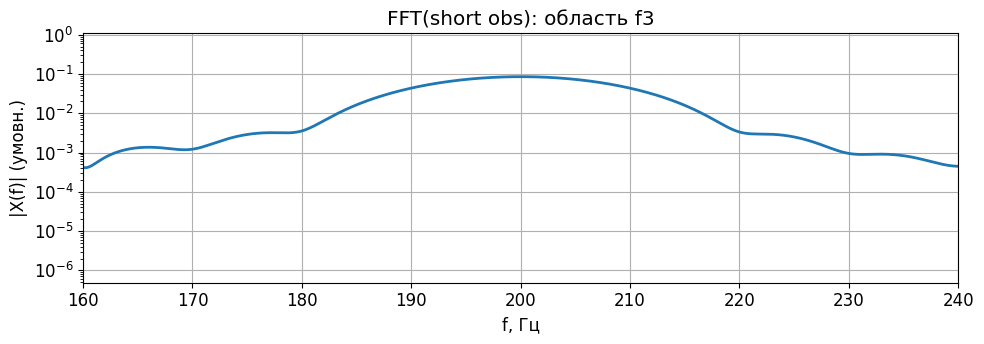

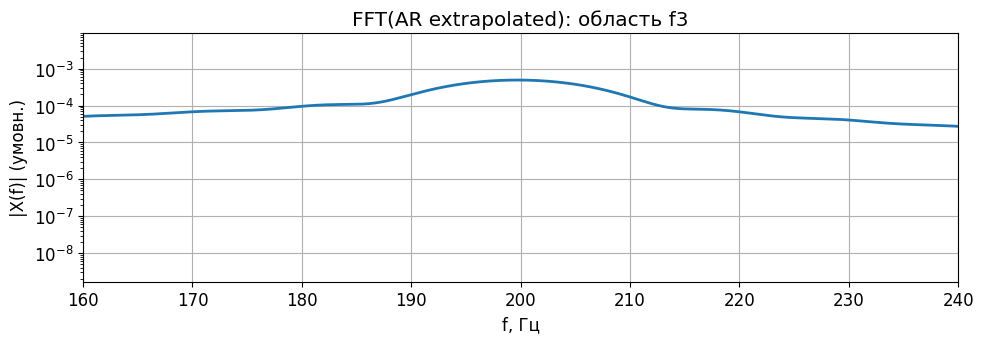

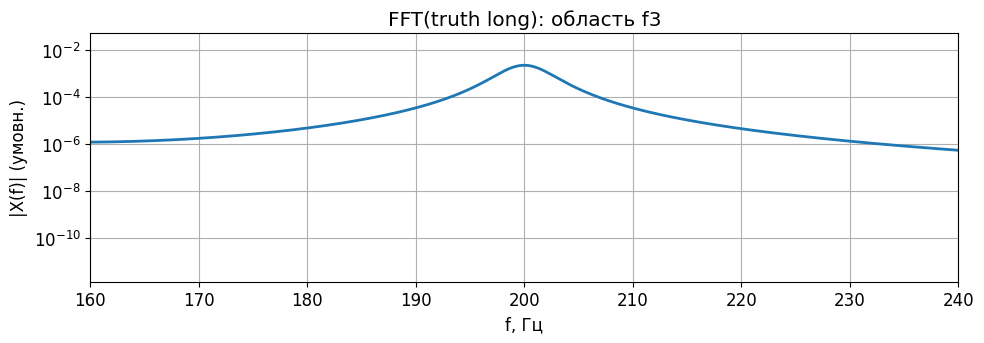

In [ ]:
fE, mE = rfft_amp(x_ext, Fs, n_fft=262144, window="hann")

plot_spec_zoom(fO, mO, "FFT(short obs): f1,f2 злиті", xlim=(70, 130), ylog=True)
plot_spec_zoom(fE, mE, "FFT(AR extrapolated): f1,f2 мають розділитися", xlim=(70, 130), ylog=True)
plot_spec_zoom(fR, mR, "FFT(truth long): reference", xlim=(70, 130), ylog=True)

plot_spec_zoom(fO, mO, "FFT(short obs): область f3", xlim=(160, 240), ylog=True)
plot_spec_zoom(fE, mE, "FFT(AR extrapolated): область f3", xlim=(160, 240), ylog=True)
plot_spec_zoom(fR, mR, "FFT(truth long): область f3", xlim=(160, 240), ylog=True)

# 7. Часо-частотні представлення: STFT (спектрограма) та вейвлет-діаграми (scalogram)

У цьому розділі ми продемонструємо, як **частотний вміст сигналу змінюється в часі**.

Базовий приклад — **chirp** (лінійно частотно модульований сигнал), де миттєва частота зростає (або спадає) з часом.

План:
1) Згенерувати chirp і показати його у часовій області та миттєву частоту.
2) Побудувати **STFT** (Short-Time Fourier Transform) та спектрограму.
3) Продемонструвати компроміс часу/частоти в STFT (вікно коротке vs довге).
4) Перейти до **вейвлет-перетворення** (CWT) і побудувати scalogram.
5) Порівняти STFT і CWT на одному й тому ж chirp (і додатковому “chirp + тон”).

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import signal

plt.rcParams.update({
    "figure.figsize": (10, 4),
    "axes.grid": True,
    "lines.linewidth": 2,
    "font.size": 12
})

rng = np.random.default_rng(0)

## 7.1 Chirp-сигнал: визначення і миттєва частота

Лінійний chirp можна записати як:
$$
x(t) = \sin\left(2\pi\left(f_0 t + \frac{k}{2}t^2\right)\right),
$$
де:
- $f_0$ — початкова частота,
- $k = \frac{f_1 - f_0}{T}$ — швидкість зміни частоти (Гц/с),
- $T$ — тривалість сигналу,
- миттєва частота:
$$
f(t)=f_0 + k t.
$$

Далі згенеруємо chirp, а також додамо слабкий шум (опційно) для реалістичності.

In [ ]:
Fs = 2000.0
T = 2.0
t = np.arange(int(Fs*T)) / Fs

f0, f1 = 50.0, 450.0
k = (f1 - f0) / T
f_inst = f0 + k*t

# Chirp (лінійний) через SciPy
x = signal.chirp(t, f0=f0, f1=f1, t1=T, method="linear")

# Легка огинаюча (щоб краї не давали різкого обтинання)
env = signal.windows.tukey(len(t), alpha=0.2)
x = x * env

# Додамо слабкий шум
x_noisy = x + 0.02 * rng.normal(0, 1.0, size=len(x))

### 7.1.1 Вікно Tukey та його спектральна характеристика

Text(0.5, 0, 'Normalized frequency [cycles per sample]')

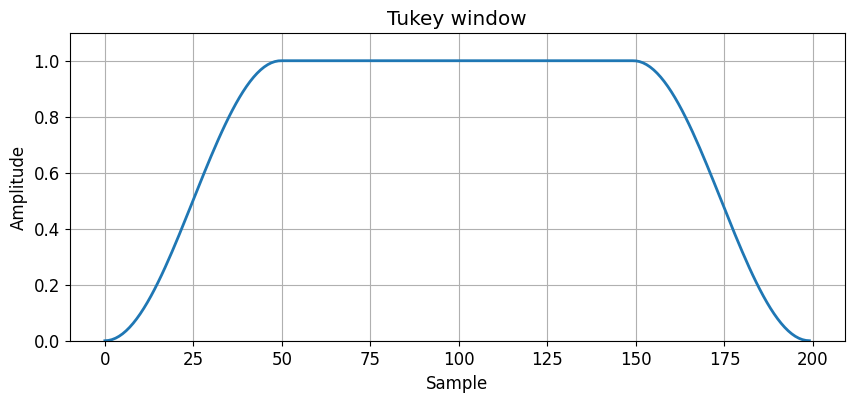

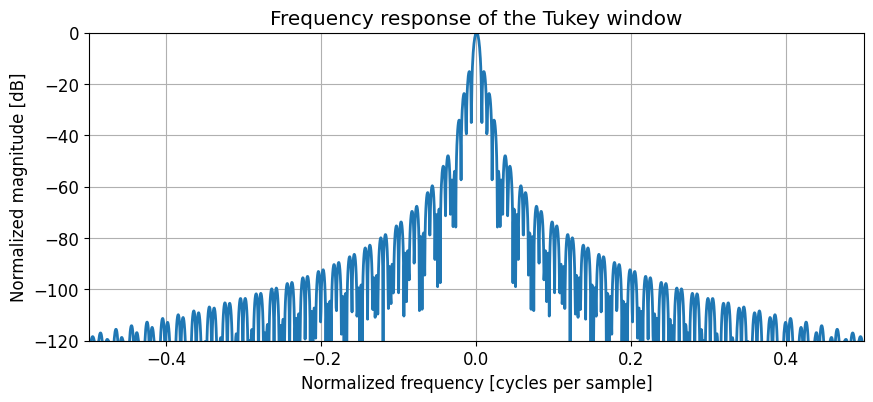

In [ ]:
import numpy as np
from scipy import signal
from scipy.fft import fft, fftshift
import matplotlib.pyplot as plt
window = signal.windows.tukey(200)
plt.plot(window)
plt.title("Tukey window")
plt.ylabel("Amplitude")
plt.xlabel("Sample")
plt.ylim([0, 1.1])
plt.figure()
A = fft(window, 2048) / (len(window)/2.0)
freq = np.linspace(-0.5, 0.5, len(A))
response = 20 * np.log10(np.abs(fftshift(A / abs(A).max())))
plt.plot(freq, response)
plt.axis([-0.5, 0.5, -120, 0])
plt.title("Frequency response of the Tukey window")
plt.ylabel("Normalized magnitude [dB]")
plt.xlabel("Normalized frequency [cycles per sample]")

## 7.2 Часова область: chirp та миттєва частота
Покажемо:
- форму сигналу $x(t)$,
- лінію миттєвої частоти $f(t)$, яку ми очікуємо побачити на часо-частотних діаграмах.

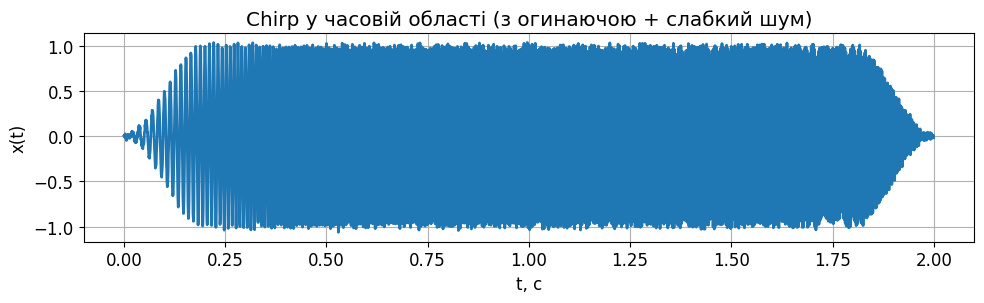

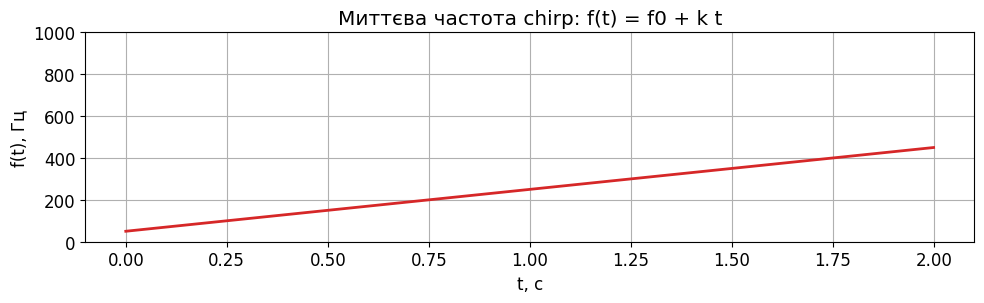

In [ ]:
plt.figure(figsize=(10, 3.2))
plt.plot(t, x_noisy, color="C0")
plt.title("Chirp у часовій області (з огинаючою + слабкий шум)")
plt.xlabel("t, c"); plt.ylabel("x(t)")
plt.tight_layout(); plt.show()

plt.figure(figsize=(10, 3.2))
plt.plot(t, f_inst, color="C3")
plt.title("Миттєва частота chirp: f(t) = f0 + k t")
plt.xlabel("t, c"); plt.ylabel("f(t), Гц")
plt.ylim(0, Fs/2)
plt.tight_layout(); plt.show()

## 7.3 STFT: Short-Time Fourier Transform

STFT визначається як Фур’є-перетворення сигналу, помноженого на вікно, яке “ковзає” в часі:
$$
X(t,\omega)=\int x(\tau)\,w(\tau-t)\,e^{-j\omega\tau}\,d\tau.
$$

На практиці:
- вибираємо довжину вікна $N_w$ (у відліках),
- перекриття `noverlap`,
- обчислюємо STFT та будуємо **спектрограму** $|X(t,f)|$ (часто в dB).

Ключ: STFT має фіксовану “плитку” часу-частоти, тому існує компроміс:
- коротке вікно → краща часова роздільність, гірша частотна,
- довге вікно → краща частотна, гірша часова.

In [ ]:
def stft_spectrogram(x, Fs, nperseg=256, noverlap=192, window="hann", nfft=None):
    f, tt, Z = signal.stft(
        x, fs=Fs, window=window, nperseg=nperseg, noverlap=noverlap,
        nfft=nfft, boundary=None, padded=False
    )
    S = np.abs(Z)
    S_db = 20*np.log10(np.maximum(S, 1e-12))
    return f, tt, S_db

def plot_specgram(f, tt, S_db, title, fmax=None):
    plt.figure(figsize=(10, 4))
    plt.pcolormesh(tt, f, S_db, shading="auto", cmap="magma")
    plt.colorbar(label="|STFT|, dB")
    plt.title(title)
    plt.xlabel("t, c"); plt.ylabel("f, Гц")
    if fmax is None:
        fmax = Fs/2
    plt.ylim(0, fmax)
    plt.tight_layout()
    plt.show()

## 7.4 STFT-спектрограма для chirp

Очікування: на спектрограмі має бути “лінія”, що зростає від $f_0$ до $f_1$.
Почнемо з “збалансованих” параметрів вікна.

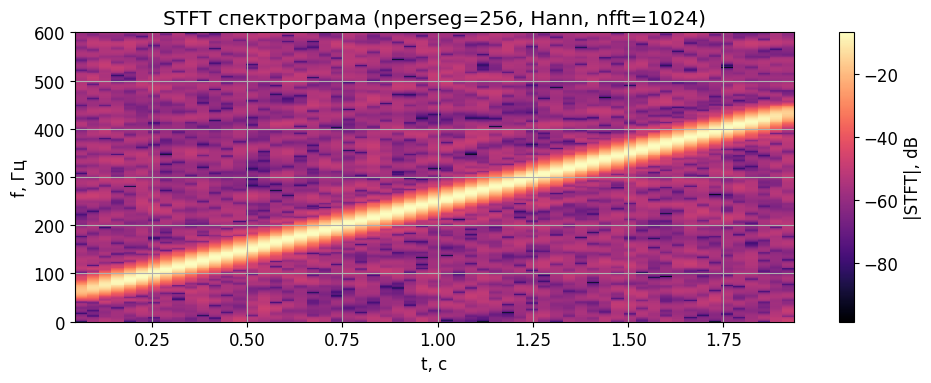

In [ ]:
f, tt, S_db = stft_spectrogram(x_noisy, Fs, nperseg=256, noverlap=192, window="hann", nfft=1024)
plot_specgram(f, tt, S_db, "STFT спектрограма (nperseg=256, Hann, nfft=1024)", fmax=600)

## 7.5 Компроміс STFT: коротке vs довге вікно

Покажемо дві спектрограми:
- коротке вікно (краща часова, гірша частотна),
- довге вікно (краща частотна, гірша часова).

Це демонструє фундаментальний компроміс “час ↔ частота”.

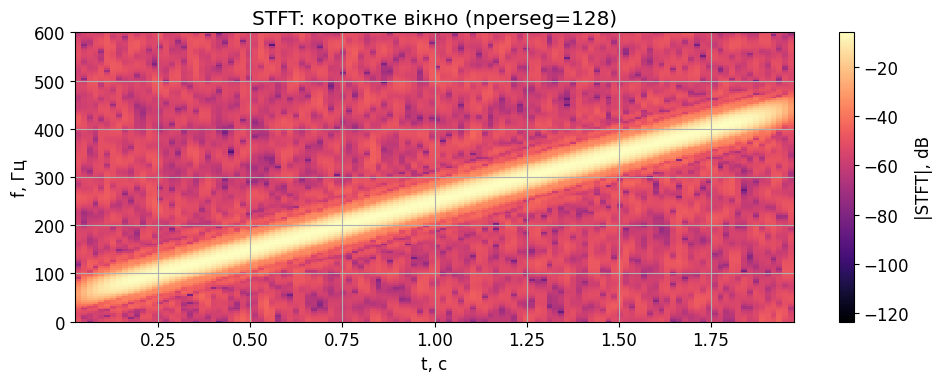

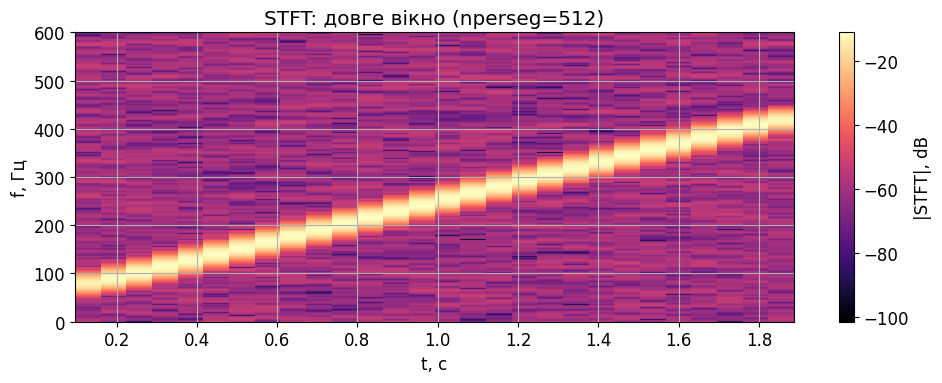

In [ ]:
# Коротке вікно
f1s, t1s, S1 = stft_spectrogram(x_noisy, Fs, nperseg=128, noverlap=96, window="hann", nfft=512)
plot_specgram(f1s, t1s, S1, "STFT: коротке вікно (nperseg=128)", fmax=600)

# Довге вікно
f2s, t2s, S2 = stft_spectrogram(x_noisy, Fs, nperseg=512, noverlap=384, window="hann", nfft=2048)
plot_specgram(f2s, t2s, S2, "STFT: довге вікно (nperseg=512)", fmax=600)

## 7.6 Перехід до вейвлетів: чому CWT?

У STFT вікно має фіксовану довжину: “однакова” роздільність для всіх частот.
Вейвлет-перетворення (CWT) використовує **масштабовані** вікна:

- для **високих частот** вікно коротше (краща часова роздільність),
- для **низьких частот** вікно довше (краща частотна роздільність).

Це часто природніше для сигналів із швидкими змінами та для chirp.

Ми використаємо **CWT** і побудуємо **scalogram**: карту енергії $|CWT(t, s)|$.

In [ ]:
try:
    import pywt
except Exception as e:
    print("PyWavelets не знайдено, встановлюємо...")
    import sys, subprocess
    subprocess.check_call([sys.executable, "-m", "pip", "install", "PyWavelets"])
    import pywt

print("PyWavelets version:", pywt.__version__)

PyWavelets version: 1.8.0


## 7.7 CWT (Continuous Wavelet Transform) і scalogram

Ми візьмемо комплексний Morlet-вейвлет (cmor), який добре підходить для частотних траєкторій.

CWT повертає коефіцієнти $W(s,t)$ на різних масштабах $s$.
PyWavelets дозволяє конвертувати масштаб у псевдочастоту:
$$
f \approx \frac{f_c}{s \Delta t},
$$
де $f_c$ — центральна частота вейвлета, $\Delta t = 1/F_s$.

Побудуємо scalogram: $|W(s,t)|$ у координатах (t, f).

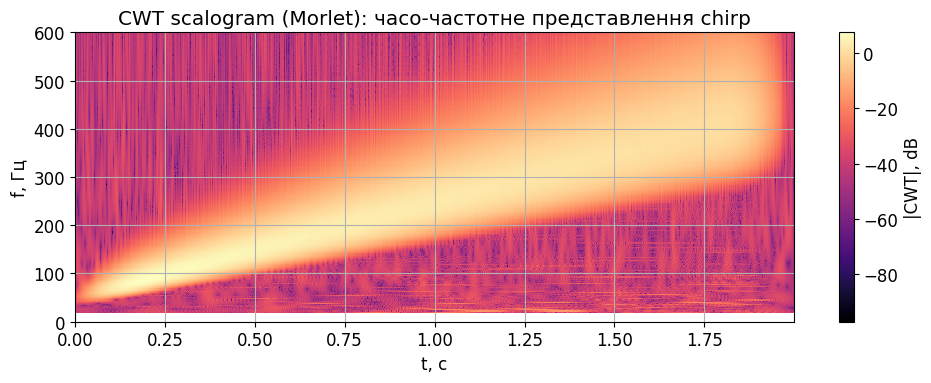

In [ ]:
def cwt_scalogram(x, Fs, fmin=20, fmax=600, n_freqs=256, wavelet="cmor1.5-1.0"):
    dt = 1.0 / Fs
    freqs = np.linspace(fmin, fmax, n_freqs)
    # scale = fc / (f * dt)
    scales = pywt.central_frequency(wavelet) / (freqs * dt)
    coef, _ = pywt.cwt(x, scales, wavelet, sampling_period=dt)
    S = np.abs(coef)
    S_db = 20*np.log10(np.maximum(S, 1e-12))
    return freqs, S_db

freqs_cwt, S_cwt = cwt_scalogram(x_noisy, Fs, fmin=20, fmax=600, n_freqs=256, wavelet="cmor1.5-1.0")

plt.figure(figsize=(10, 4))
plt.pcolormesh(t, freqs_cwt, S_cwt, shading="auto", cmap="magma")
plt.colorbar(label="|CWT|, dB")
plt.title("CWT scalogram (Morlet): часо-частотне представлення chirp")
plt.xlabel("t, c"); plt.ylabel("f, Гц")
plt.ylim(0, 600)
plt.tight_layout(); plt.show()

## 7.8 Порівняння STFT vs CWT на одному графіку (ідея)

Порівняння якісно:
- STFT дає “лінію chirp” з фіксованою товщиною/роздільністю по частоті та часу (залежить від вікна).
- CWT зазвичай дає кращу часову локалізацію на високих частотах і кращу частотну — на низьких.

Щоб зробити приклад більш показовим, додамо до chirp ще одну сталу гармоніку (тон) і подивимось, як вона виглядає у STFT та CWT.

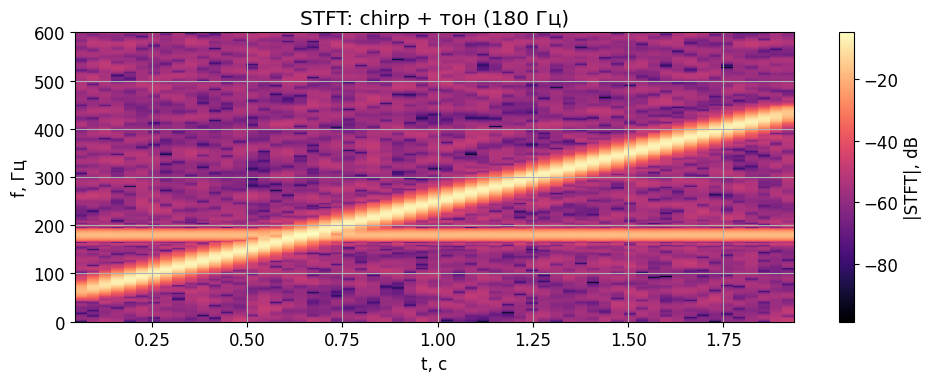

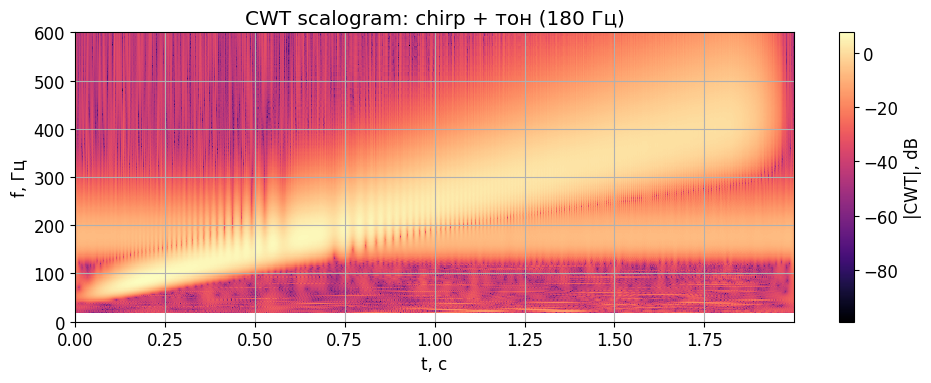

In [ ]:
tone_f = 180.0
x_mix = x_noisy + 0.25*np.sin(2*np.pi*tone_f*t)

# STFT для суміші
f_m, tt_m, S_m = stft_spectrogram(x_mix, Fs, nperseg=256, noverlap=192, window="hann", nfft=1024)
plot_specgram(f_m, tt_m, S_m, "STFT: chirp + тон (180 Гц)", fmax=600)

# CWT для суміші
freqs_cwt2, S_cwt2 = cwt_scalogram(x_mix, Fs, fmin=20, fmax=600, n_freqs=256, wavelet="cmor1.5-1.0")

plt.figure(figsize=(10, 4))
plt.pcolormesh(t, freqs_cwt2, S_cwt2, shading="auto", cmap="magma")
plt.colorbar(label="|CWT|, dB")
plt.title("CWT scalogram: chirp + тон (180 Гц)")
plt.xlabel("t, c"); plt.ylabel("f, Гц")
plt.ylim(0, 600)
plt.tight_layout(); plt.show()

## 7.9 Практичні висновки

1) **STFT**:
- зрозумілий, стандартний інструмент,
- ключовий параметр — довжина вікна (`nperseg`), що визначає компроміс часу/частоти,
- добре підходить для “майже стаціонарних” ділянок або коли потрібна фіксована роздільність.

2) **CWT (вейвлети)**:
- дає **частотно-залежну** роздільність (multi-resolution),
- часто краще локалізує короткі/швидкі події на високих частотах,
- зручний для chirp та нестаціонарних сигналів.

3) Для інженерного аналізу:
- STFT — перший вибір (простий і швидкий),
- CWT — коли сигнал має різні масштаби/швидкості змін, або коли STFT “не встигає” одночасно в часі й частоті.

## 7.10 Складний сигнал: “акорд” (частотно-локалізований) + гаусові імпульси (часово-локалізовані) + хвильові пакети (Gabor-атоми)

Мета цього прикладу — показати, як різні типи “атомів” виглядають на часо-частотних представленнях:

1) **Компоненти, локалізовані по частоті**: сталий “акорд” — сума кількох синусів (горизонтальні лінії на STFT/CWT).
2) **Компоненти, локалізовані у часі**: короткі **гаусові імпульси** (вертикальні “сплески” у широкій смузі частот).
3) **Найкраща часо-частотна локалізація**: **хвильові пакети з гаусовою огинаючою** (Gabor-атоми) — компактні “плями” в (t,f).

Це ілюструє принцип: точна локалізація в часі “коштує” широкого спектра, а точна локалізація в частоті “коштує” довгого часу.


In [ ]:
# Параметри (використовуємо ті ж t, Fs, T з попередніх комірок)
# Якщо t/Fs/T ще не визначені, розкоментуй 3 рядки нижче:
# Fs = 2000.0; T = 2.0
# t = np.arange(int(Fs*T)) / Fs

def gauss_env(t, t0, sigma):
    return np.exp(-0.5*((t - t0)/sigma)**2)

def gabor_atom(t, t0, sigma, f0, amp=1.0, phase=0.0):
    return amp * gauss_env(t, t0, sigma) * np.cos(2*np.pi*f0*(t - t0) + phase)

# 1) "Акорд" (частотно-локалізований): кілька синусів з легкою огинаючою
chord_freqs = [120.0, 150.0, 180.0]
chord = sum(np.sin(2*np.pi*f*t) for f in chord_freqs)
chord *= signal.windows.tukey(len(t), alpha=0.1) * 0.4

# 2) Гаусові імпульси (часово-локалізовані): короткі "сплески"
pulse_times = [0.7, 0.02, 1.55]
pulses = sum(1.0 * gauss_env(t, t0, 0.008) for t0 in pulse_times)

# 3) Gabor-атоми (часо-частотно локалізовані): пакети з гаусовою огинаючою
atoms = (
    gabor_atom(t, t0=0.65, sigma=0.03, f0=260.0, amp=0.9, phase=0.2) +
    gabor_atom(t, t0=1.25, sigma=0.04, f0=340.0, amp=0.8, phase=1.1)
)

# Підсумковий сигнал + слабкий шум
x_tf = chord + 0.8*pulses + atoms + 0.01*rng.normal(0, 1.0, size=len(t))

## 7.11 Часова область: як виглядає суміш

На часовому графіку:
- “акорд” дає майже стаціонарні коливання,
- гаусові імпульси видно як короткі піки,
- хвильові пакети — як короткі “пачки” коливань (кілька періодів всередині огинаючої).

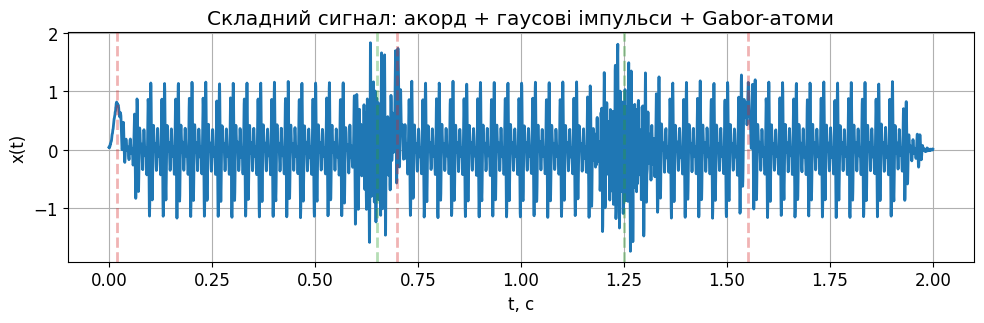

In [ ]:
plt.figure(figsize=(10, 3.4))
plt.plot(t, x_tf, color="C0")
for tt0 in pulse_times:
    plt.axvline(tt0, color="C3", alpha=0.35, linestyle="--")
plt.axvline(0.65, color="C2", alpha=0.35, linestyle="--")
plt.axvline(1.25, color="C2", alpha=0.35, linestyle="--")
plt.title("Складний сигнал: акорд + гаусові імпульси + Gabor-атоми")
plt.xlabel("t, c"); plt.ylabel("x(t)")
plt.tight_layout(); plt.show()

## 7.12 STFT спектрограма для складного сигналу

Очікувані патерни на STFT:

- **Акорд**: три майже горизонтальні лінії на частотах ~120/150/180 Гц.
- **Гаусові імпульси**: вертикальні широкосмугові “сплески” в моменти ~0.35, 0.95, 1.55 c.
- **Gabor-атоми**: компактні плями поблизу (t≈0.65, f≈260) і (t≈1.25, f≈340).

Для наочності накладемо горизонтальні лінії частот акорду.


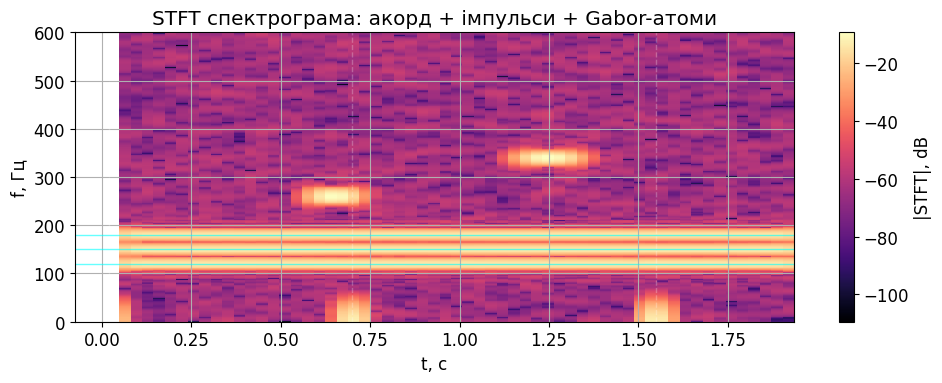

In [ ]:
# Використовуємо функції stft_spectrogram та plot_specgram з попередніх комірок
f_s, tt_s, S_s = stft_spectrogram(x_tf, Fs, nperseg=256, noverlap=192, window="hann", nfft=1024)

plt.figure(figsize=(10, 4))
plt.pcolormesh(tt_s, f_s, S_s, shading="auto", cmap="magma")
plt.colorbar(label="|STFT|, dB")
plt.title("STFT спектрограма: акорд + імпульси + Gabor-атоми")
plt.xlabel("t, c"); plt.ylabel("f, Гц")
plt.ylim(0, 600)

for f0 in chord_freqs:
    plt.axhline(f0, color="cyan", alpha=0.6, linewidth=1)

for tt0 in pulse_times:
    plt.axvline(tt0, color="white", alpha=0.25, linestyle="--", linewidth=1)

plt.tight_layout(); plt.show()

## 7.13 CWT scalogram для складного сигналу (вейвлет-діаграма)

На CWT (з Morlet-вейвлетом) зазвичай:
- високі частоти мають кращу часову локалізацію,
- низькі частоти — кращу частотну.

Тут це добре видно:
- “акорд” як майже горизонтальні доріжки,
- імпульси як короткі події з широким частотним вмістом,
- Gabor-атоми як компактні “плями” (часто ще компактніші, ніж у STFT).
``

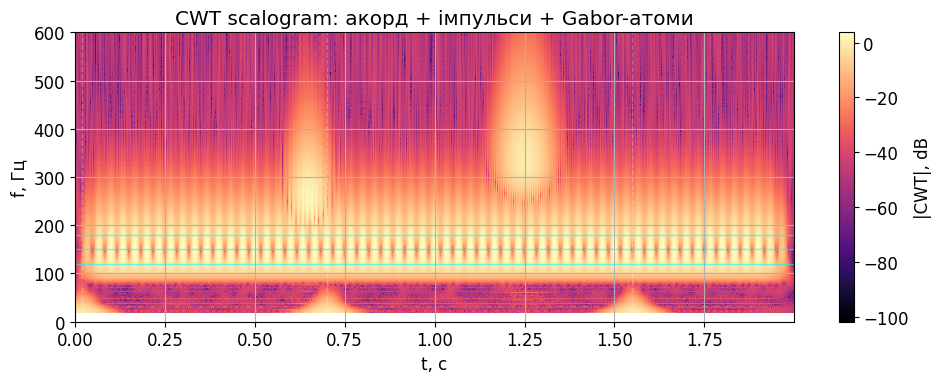

In [ ]:
# Використовуємо cwt_scalogram з попередніх комірок (PyWavelets вже підключений)
freqs_c, S_c = cwt_scalogram(x_tf, Fs, fmin=20, fmax=600, n_freqs=256, wavelet="cmor1.5-1.0")

plt.figure(figsize=(10, 4))
plt.pcolormesh(t, freqs_c, S_c, shading="auto", cmap="magma")
plt.colorbar(label="|CWT|, dB")
plt.title("CWT scalogram: акорд + імпульси + Gabor-атоми")
plt.xlabel("t, c"); plt.ylabel("f, Гц")
plt.ylim(0, 600)

for f0 in chord_freqs:
    plt.axhline(f0, color="cyan", alpha=0.6, linewidth=1)

for tt0 in pulse_times:
    plt.axvline(tt0, color="white", alpha=0.25, linestyle="--", linewidth=1)

plt.tight_layout(); plt.show()

## 7.14 Що саме демонструє цей приклад (коротко)

- **Частотно-локалізовані компоненти (акорд)**:
  - добре видно як “горизонтальні лінії” (стабільні частоти),
  - вони погано локалізовані в часі (існують майже весь інтервал).

- **Часово-локалізовані компоненти (гаусові імпульси)**:
  - добре локалізовані у часі,
  - але мають широкий спектр (вертикальні “сплески”).

- **Gabor-атоми (гаусова огинаюча × гармоніка)**:
  - мають оптимальну одночасну локалізацію в часі та частоті,
  - виглядають як компактні плями у (t,f),
  - є “атомами” у багатьох розкладаннях (time-frequency atoms).

Це дає природний місток до тем: розкладання сигналів по “атомах”, sparse representations, matching pursuit тощо (за потреби).

# 8. Фільтрація та детекція пакета в шумі (frequency-domain filtering + matched filter)

**Сценарій:**
- Формуємо сигнал у вигляді **несучої з огинаючою** (Gaussian/Tukey), який займає малу частину довгого вікна (наприклад, 200 відліків у вікні 4000).
- Додаємо **білий шум** так, щоб сигнал був **нижче шуму** (негативний SNR).
- Дивимось спектр noisy-сигналу.
- Робимо **фільтрацію в частотній області** (band-pass навколо несучої), відновлюємо сигнал.
- Далі визначаємо момент приходу (центр пакета) двома способами:
  1) детектор огинаючої (Hilbert envelope) після band-pass,
  2) **matched filter** (кореляційний детектор) — оптимальний для відомого шаблону в білому шумі.

**Місток до наступного розділу (канал/передача):**
потім ми зможемо кодувати 1 біт фазою пакета (BPSK: +1/-1 або sin/cos) і показати когерентну/некогерентну детекцію.

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import signal

plt.rcParams.update({
    "figure.figsize": (10, 4),
    "axes.grid": True,
    "lines.linewidth": 2,
    "font.size": 12
})

rng = np.random.default_rng(0)

## 8.1 Допоміжні функції

- `nextpow2` для зручного FFT-паддінгу
- генерація огинаючої (Gaussian або Tukey)
- формування пакета (несуча × огинаюча)
- додавання білого шуму за заданим SNR (в dB)
- FFT-спектр (амплітудний) для візуалізації


In [ ]:
def nextpow2(n):
    return 1 << int(np.ceil(np.log2(n)))

def gaussian_env(n, n0, sigma):
    return np.exp(-0.5*((n - n0)/sigma)**2)

def tukey_env(n, n0, L, alpha=0.5):
    w = signal.windows.tukey(L, alpha=alpha)
    env = np.zeros_like(n, dtype=float)
    start = int(n0 - L//2)
    start = max(start, 0)
    end = min(start + L, len(n))
    w2 = w[:end-start]
    env[start:end] = w2
    return env

def make_packet(n, Fs, n0, fc, env, phase=0.0, amp=1.0):
    t = (n - n0) / Fs
    carrier = np.cos(2*np.pi*fc*t + phase)
    return amp * env * carrier

In [ ]:
def add_awgn_snr(x, snr_db, rng=None):
    if rng is None:
        rng = np.random.default_rng()
    x = np.asarray(x, float)
    Ps = np.mean(x**2)
    Pn = Ps / (10**(snr_db/10))
    noise = rng.normal(0, np.sqrt(Pn), size=x.shape)
    return x + noise, noise

def rfft_amp(x, Fs, n_fft, window="hann"):
    x = np.asarray(x, float)
    N = len(x)
    w = signal.get_window(window, N, fftbins=True) if window else np.ones(N)
    cg = np.sum(w)/N
    X = np.fft.rfft(x*w, n=n_fft)
    f = np.fft.rfftfreq(n_fft, d=1/Fs)
    mag = np.abs(X) / (N*cg)
    return f, mag

def plot_zoom(t, x, title, xlim):
    plt.figure(figsize=(10, 3.2))
    plt.plot(t, x, color="C0")
    plt.title(title); plt.xlabel("t, c"); plt.ylabel("амплітуда")
    plt.xlim(*xlim); plt.tight_layout(); plt.show()

## 8.2 Параметри експерименту та “чистий” пакет

Вибір параметрів (на мій розсуд, але під твою задачу):
- Довжина вікна: $N=4000$
- Частота дискретизації: $F_s=4000$ Гц (Nyquist = 2000 Гц)
- Довжина пакета: $L=200$ (тобто 0.05 с)
- Несуча: $f_c=600$ Гц (у смузі далеко від DC і Nyquist)
- Огинаюча: Gaussian (також покажемо Tukey як альтернативу)
- Центр пакета $n_0$ ставимо не по центру (щоб було цікавіше детектувати)
- SNR для noisy: наприклад $-10$ dB (сигнал нижче шуму)
``

In [ ]:
Fs = 4000.0
N = 4000
n = np.arange(N)
t = n / Fs

L = 200
fc = 600.0
n0 = 1700   # центр пакета (не по центру вікна)

# Gaussian envelope: sigma так, щоб енергія була в межах ~L
sigma = L / 6.0
env_g = gaussian_env(n, n0, sigma)

# Альтернатива: Tukey envelope (закоментовано, якщо хочеш switch)
# env_g = tukey_env(n, n0, L, alpha=0.6)

s_clean = make_packet(n, Fs, n0, fc, env_g, phase=0.0, amp=1.0)

print("Packet duration ~", L/Fs, "s; carrier periods in packet ~", fc*(L/Fs))

Packet duration ~ 0.05 s; carrier periods in packet ~ 30.0


## 8.3 Візуалізація “чистого” сигналу та його спектру

Покажемо:
- часовий графік поблизу пакета,
- спектр: вузькосмугова енергія навколо $f_c$.

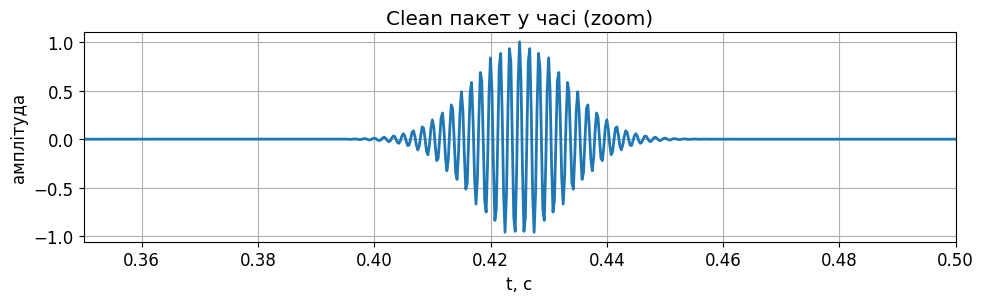

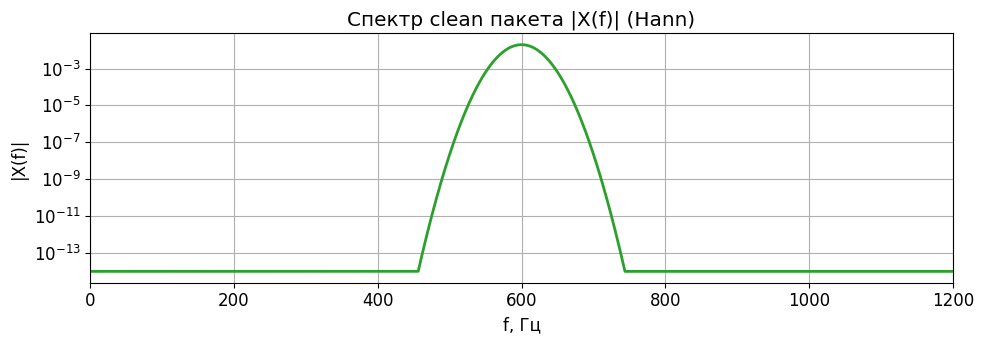

In [ ]:
plot_zoom(t, s_clean, "Clean пакет у часі (zoom)", xlim=((n0-300)/Fs, (n0+300)/Fs))

n_fft = 262144
fS, mS = rfft_amp(s_clean, Fs, n_fft=n_fft, window="hann")

plt.figure(figsize=(10, 3.6))
plt.semilogy(fS, np.maximum(mS, 1e-14), color="C2")
plt.title("Спектр clean пакета |X(f)| (Hann)")
plt.xlabel("f, Гц"); plt.ylabel("|X(f)|")
plt.xlim(0, 1200)
plt.tight_layout(); plt.show()

## 8.4 Додаємо білий шум так, щоб сигнал був нижче шуму (SNR < 0)

Задамо SNR (по середній потужності у всьому вікні) як, наприклад, $-10$ dB.
На часовому графіку пакет практично зникне, а у спектрі він буде ледь помітним над шумовою підлогою.

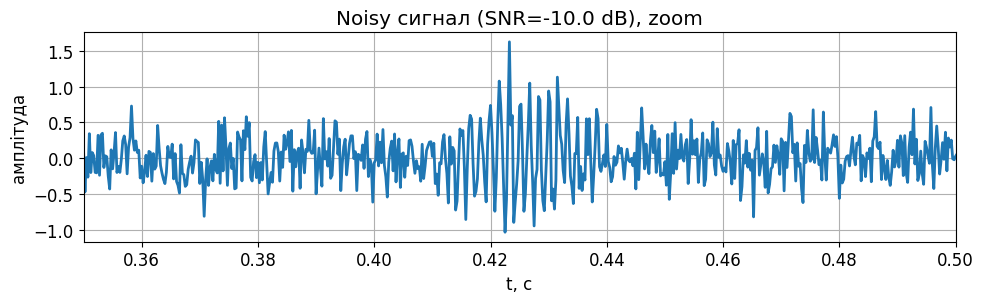

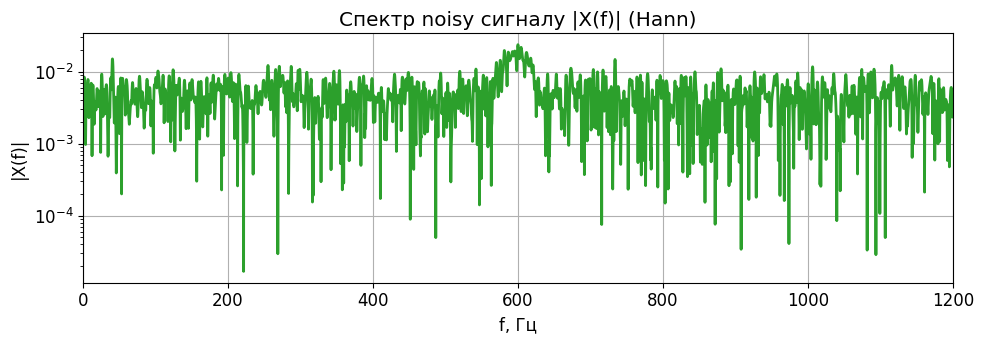

In [ ]:
SNR_db = -10.0
x_noisy, noise = add_awgn_snr(s_clean, SNR_db, rng=rng)

plot_zoom(t, x_noisy, f"Noisy сигнал (SNR={SNR_db} dB), zoom", xlim=((n0-300)/Fs, (n0+300)/Fs))

fN, mN = rfft_amp(x_noisy, Fs, n_fft=n_fft, window="hann")
plt.figure(figsize=(10, 3.6))
plt.semilogy(fN, np.maximum(mN, 1e-14), color="C2")
plt.title("Спектр noisy сигналу |X(f)| (Hann)")
plt.xlabel("f, Гц"); plt.ylabel("|X(f)|")
plt.xlim(0, 1200)
plt.tight_layout(); plt.show()

## 8.5 Фільтрація в частотній області: band-pass навколо $f_c$

Ми зробимо два варіанти частотного “маскування” $H(f)$ на rFFT-частотах:

1) **Hard band-pass**: прямокутник у частоті (різкі краї) — більше дзвону в часі.
2) **Soft band-pass**: плавні краї (Tukey у частоті) — менше дзвону, акуратніша огинаюча.

Щоб уникнути артефактів кругової згортки, робимо FFT з паддінгом до довжини `n_fft_pad >= 2N`.

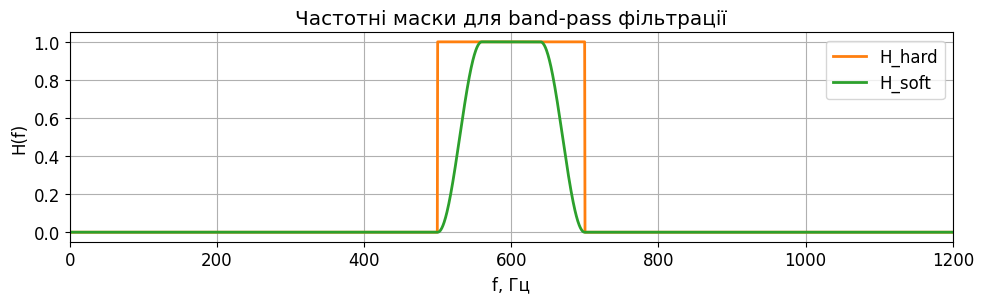

In [ ]:
n_fft_pad = nextpow2(2*N)   # 8192 для N=4000
f = np.fft.rfftfreq(n_fft_pad, d=1/Fs)

# Вибір смуги: беремо ширину так, щоб покрити енергію пакета
B = 200.0  # Гц (можеш міняти)
f1_cut = fc - B/2
f2_cut = fc + B/2

H_hard = ((f >= f1_cut) & (f <= f2_cut)).astype(float)

# Soft (Tukey) у частоті: плавні краї в межах смуги
H_soft = np.zeros_like(f)
mask = (f >= f1_cut) & (f <= f2_cut)
Lband = np.sum(mask)
if Lband > 4:
    H_soft[mask] = signal.windows.tukey(Lband, alpha=0.6)

plt.figure(figsize=(10, 3.2))
plt.plot(f, H_hard, label="H_hard", color="C1")
plt.plot(f, H_soft, label="H_soft", color="C2")
plt.title("Частотні маски для band-pass фільтрації")
plt.xlabel("f, Гц"); plt.ylabel("H(f)")
plt.xlim(0, 1200); plt.legend(); plt.tight_layout(); plt.show()

## 8.6 Застосування частотного фільтра і відновлення сигналу (IFFT)

Алгоритм:
1) rFFT(noisy) з паддінгом до `n_fft_pad`,
2) множення на $H(f)$,
3) irFFT → отримуємо відфільтрований сигнал у часі (беремо перші N відліків).

Порівняємо результат для hard vs soft масок.

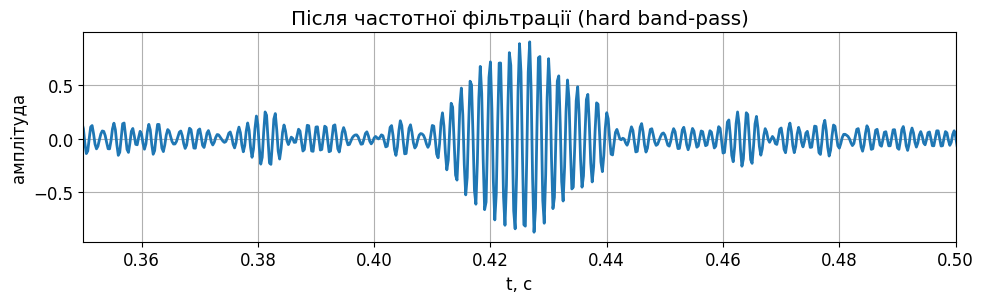

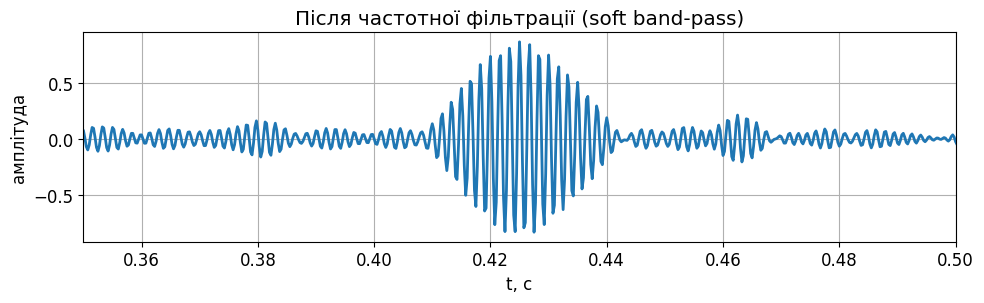

In [ ]:
def freq_filter_real(x, H, n_fft_pad):
    X = np.fft.rfft(x, n=n_fft_pad)
    Y = X * H
    y = np.fft.irfft(Y, n=n_fft_pad)
    return y

y_hard = freq_filter_real(x_noisy, H_hard, n_fft_pad)[:N]
y_soft = freq_filter_real(x_noisy, H_soft, n_fft_pad)[:N]

plot_zoom(t, y_hard, "Після частотної фільтрації (hard band-pass)", xlim=((n0-300)/Fs, (n0+300)/Fs))
plot_zoom(t, y_soft, "Після частотної фільтрації (soft band-pass)", xlim=((n0-300)/Fs, (n0+300)/Fs))

## 8.7 Детекція центру пакета після band-pass: Hilbert envelope

Для вузькосмугового сигналу з несучою зручно оцінювати огинаючу через аналітичний сигнал:
$$
a[n] = x[n] + j\,\mathcal{H}\{x[n]\}, \quad \text{envelope} = |a[n]|.
$$

Тоді центр пакета можна оцінити як $\arg\max$ огинаючої.

True n0 = 1700
Hilbert center (hard) = 1705 error = 5
Hilbert center (soft) = 1701 error = 1


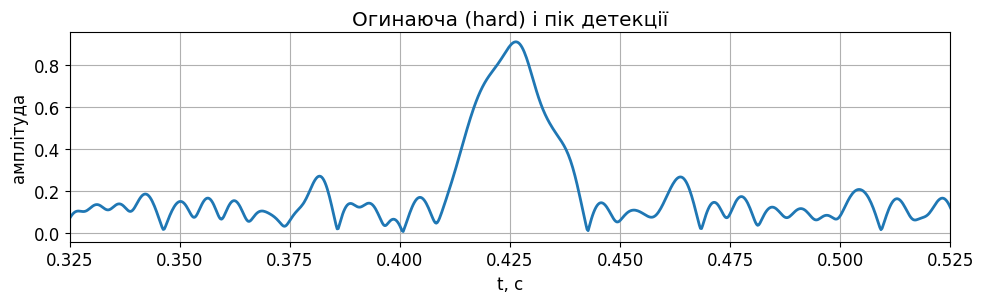

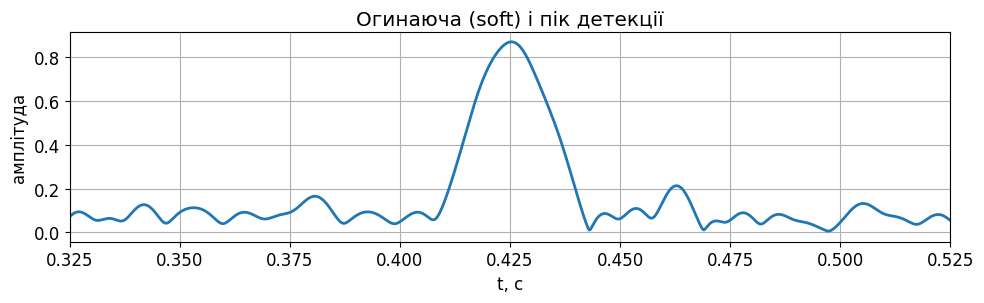

In [ ]:
def envelope_hilbert(x):
    a = signal.hilbert(x)
    return np.abs(a)

env_hard = envelope_hilbert(y_hard)
env_soft = envelope_hilbert(y_soft)

n_est_hard = int(np.argmax(env_hard))
n_est_soft = int(np.argmax(env_soft))

print("True n0 =", n0)
print("Hilbert center (hard) =", n_est_hard, "error =", n_est_hard - n0)
print("Hilbert center (soft) =", n_est_soft, "error =", n_est_soft - n0)

plot_zoom(t, env_hard, "Огинаюча (hard) і пік детекції", xlim=((n0-400)/Fs, (n0+400)/Fs))
plot_zoom(t, env_soft, "Огинаюча (soft) і пік детекції", xlim=((n0-400)/Fs, (n0+400)/Fs))

## 8.8 Matched filter (кореляційний детектор) — оптимальний для білого шуму

Якщо форма пакета відома (шаблон $s[n]$), оптимальний детектор у білому шумі — **matched filter**:
$$
y[n] = \sum_k x[k]\,s[k-n] \quad \text{(кореляція)}.
$$

На практиці:
- беремо шаблон (clean пакет) і корелюємо з noisy сигналом,
- максимум кореляції дає оцінку часу приходу.

Ми використаємо `scipy.signal.fftconvolve` (швидко) у режимі `same`.

Matched filter peak = 2000 error = 300


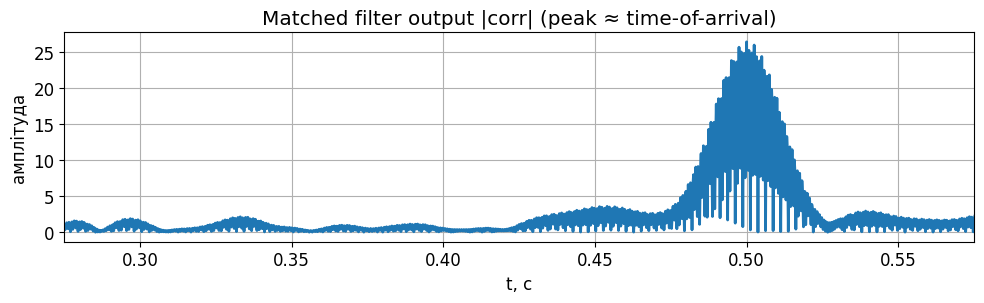

In [ ]:
# Шаблон: чистий пакет (весь N-вектор). Це "знаємо форму", але не час.
template = s_clean.copy()

# Matched filter (кореляція): conv(x, template[::-1]) ~ correlation
mf = signal.fftconvolve(x_noisy, template[::-1], mode="same")
mf_abs = np.abs(mf)

n_est_mf = int(np.argmax(mf_abs))
print("Matched filter peak =", n_est_mf, "error =", n_est_mf - n0)

plot_zoom(t, mf_abs, "Matched filter output |corr| (peak ≈ time-of-arrival)", xlim=((n0-600)/Fs, (n0+600)/Fs))

## 8.9 Порівняння методів детекції (Hilbert vs Matched filter)

Зазвичай:
- band-pass + envelope — простий підхід і працює непогано,
- matched filter дає найбільший виграш по SNR для відомого сигналу в білому шумі.

Далі в наступному розділі (канал зв’язку) ми використаємо фазу пакета (BPSK) і покажемо:
- когерентну детекцію (з відомою фазою),
- некогерентну (phase-invariant) через I/Q або через енергію кореляції.

In [ ]:
def snr_db(signal_part, noise_part):
    Ps = np.mean(signal_part**2)
    Pn = np.mean(noise_part**2)
    return 10*np.log10(Ps/Pn)

# Оцінимо "локальний" SNR у вікні пакета (±L) до фільтрації:
win = slice(max(n0-2*L, 0), min(n0+2*L, N))
snr_in = snr_db(s_clean[win], (x_noisy - s_clean)[win])

# Після soft band-pass: оцінка SNR відносно (y_soft - s_clean) груба, бо фільтр змінює сигнал
snr_out_soft = snr_db(y_soft[win], (y_soft - s_clean)[win])

print("Approx SNR in (window)  =", snr_in, "dB")
print("Approx SNR out (soft)   =", snr_out_soft, "dB")
print("Center errors: Hilbert soft =", n_est_soft - n0, ", Matched =", n_est_mf - n0)

Approx SNR in (window)  = -2.9786028294673548 dB
Approx SNR out (soft)   = 8.842521874802552 dB
Center errors: Hilbert soft = 1 , Matched = 300


# 8.10 Числовий експеримент: фільтрація в часо-част + iSTFT** (time-varying band-pass уздовж відомої траєкторії chirp, активний лише в відомому часовому інтервалі).
3) **Matched filter** (кореляція з шаблоном) і еквівалентний варіант **dechirp + low-pass** (“stretch processing”).

Ми порівняємо:
- реконструйовані сигнали після (1) та (2),
- детекторні виходи (3),
- емпіричне покращення SNR та “наївний” прогноз за площею/шириною смуги.

**Ключові нюанси:**
- STFT потрібно інвертувати через `istft`, з тими ж параметрами та вікном, бажано з COLA (наприклад Hann + 50% overlap).
- TF-mask не лише зменшує шум, але й може “відрізати” частину енергії сигналу, якщо маска занадто вузька.
- STFT є редундантним представленням: кількість TF-бінів не дорівнює кількості незалежних “вимірів” шуму, тому площинна оцінка SNR — лише інтуїція.

**Мета:** порівняти три підходи для виявлення відомого ЛЧМ (chirp) сигналу в білому шумі, коли **час приходу відомий точно**:

1) **Глобальний band-pass** у частотній області (пропускаємо весь діапазон chirp упродовж усього запису).  


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import signal

plt.rcParams.update({
    "figure.figsize": (10, 4),
    "axes.grid": True,
    "lines.linewidth": 2,
    "font.size": 12
})

rng = np.random.default_rng(0)

## 8.10.1 Параметри сигналу та шуму

Вибір параметрів (можеш легко міняти):
- $F_s = 4000$ Гц
- Тривалість запису $T_\text{tot}$
- ЛЧМ (linear chirp) тривалістю $T_s$
- Час приходу $t_a$ відомий точно
- Діапазон частот chirp: $[f_0, f_1]$
- SNR заданий по потужності сигналу в активному інтервалі (в dB), наприклад $-10$ dB


In [ ]:
Fs = 4000.0
T_tot = 2.0
N = int(Fs * T_tot)
t = np.arange(N) / Fs

# Chirp parameters
T_sig = 0.30
t_a = 0.80  # arrival time known exactly
f0, f1 = 300.0, 1100.0
k = (f1 - f0) / T_sig

SNR_db = -10.0

# indices of the active interval
n_a = int(round(t_a * Fs))
n_b = int(round((t_a + T_sig) * Fs))
print("N =", N, " | signal samples =", n_b - n_a)

N = 8000  | signal samples = 1200


## 8.10.2 Генерація chirp-пакета (truth) та додавання білого шуму

Ми формуємо chirp лише на інтервалі $[t_a, t_a+T_s]$ і множимо на гладку огинаючу (Tukey),
щоб уникнути різкого обтинання.

Далі додаємо білий шум так, щоб SNR у цьому інтервалі був негативний.

In [ ]:
def tukey_env(L, alpha=0.25):
    return signal.windows.tukey(L, alpha=alpha)

# Truth signal s[n]
s = np.zeros(N, dtype=float)
tt = (np.arange(n_b - n_a) / Fs)
env = tukey_env(len(tt), alpha=0.25)
chirp_seg = signal.chirp(tt, f0=f0, f1=f1, t1=T_sig, method="linear")
s[n_a:n_b] = env * chirp_seg

# White noise with target SNR in the active segment
Ps = np.mean(s[n_a:n_b]**2)
Pn = Ps / (10**(SNR_db/10))
n = rng.normal(0, np.sqrt(Pn), size=N)
x = s + n

print("Ps(seg) =", Ps, "Pn =", Pn, "SNR(dB) target =", SNR_db)

Ps(seg) = 0.42152352520510006 Pn = 4.215235252051 SNR(dB) target = -10.0


## 8.10.3 Базова візуалізація (час + спектр)

Ми подивимось:
- як виглядає noisy сигнал в часі (chirp майже не видно),
- спектр FFT (видно шумову підлогу; chirp займає смугу [f0,f1]).

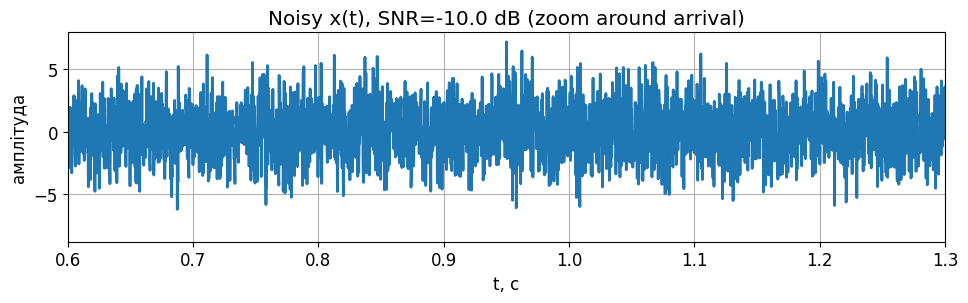

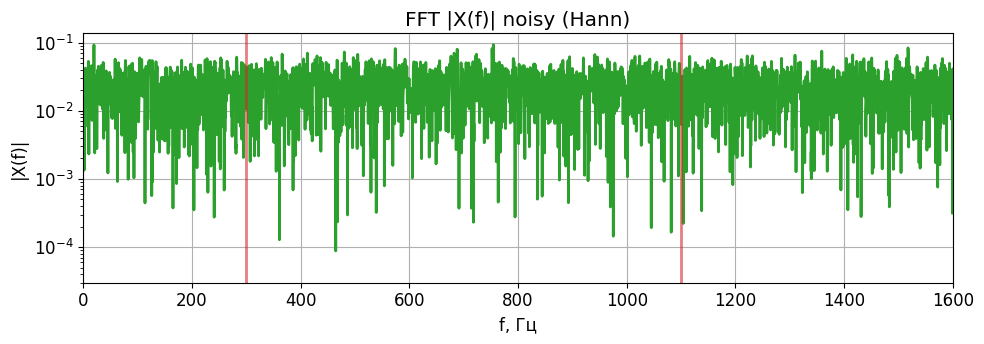

In [ ]:
def rfft_mag(x, Fs, n_fft=262144, window="hann"):
    x = np.asarray(x, float)
    N = len(x)
    w = signal.get_window(window, N, fftbins=True)
    cg = np.sum(w)/N
    X = np.fft.rfft(x*w, n=n_fft)
    f = np.fft.rfftfreq(n_fft, d=1/Fs)
    mag = np.abs(X)/(N*cg)
    return f, mag

def plot_zoom_time(t, y, title, t1, t2):
    plt.figure(figsize=(10, 3.2))
    plt.plot(t, y, color="C0")
    plt.title(title); plt.xlabel("t, c"); plt.ylabel("амплітуда")
    plt.xlim(t1, t2); plt.tight_layout(); plt.show()

plot_zoom_time(t, x, f"Noisy x(t), SNR={SNR_db} dB (zoom around arrival)", t_a-0.2, t_a+T_sig+0.2)

fX, mX = rfft_mag(x, Fs)
plt.figure(figsize=(10, 3.6))
plt.semilogy(fX, np.maximum(mX, 1e-14), color="C2")
plt.axvline(f0, color="C3", alpha=0.6); plt.axvline(f1, color="C3", alpha=0.6)
plt.title("FFT |X(f)| noisy (Hann)")
plt.xlabel("f, Гц"); plt.ylabel("|X(f)|"); plt.xlim(0, 1600)
plt.tight_layout(); plt.show()

## 8.10.4 Метрики SNR: як будемо рахувати

Для лінійних перетворень $y = \mathcal{T}\{x\}$ можна точно розкласти:
$$y = \mathcal{T}\{s+n\} = \mathcal{T}\{s\} + \mathcal{T}\{n\} = y_s + y_n.$$

Тоді SNR у часовому вікні сигналу рахуємо як:
$$\text{SNR} = 10\log_{10}\frac{\mathbb{E}[y_s^2]}{\mathbb{E}[y_n^2]} \quad \text{на } n\in[n_a,n_b).$$

Для matched filter ми оцінюємо SNR на піку кореляції (або у вузькому вікні навколо піку).

In [ ]:
def snr_db_window(y_s, y_n, a, b):
    Ps = np.mean(np.abs(y_s[a:b])**2)
    Pn = np.mean(np.abs(y_n[a:b])**2)
    return 10*np.log10(Ps/Pn)

print("Input SNR (seg) =", snr_db_window(s, n, n_a, n_b), "dB")

Input SNR (seg) = -9.911682813395158 dB


## 8.10.5 Метод 1: Глобальний band-pass (частотне фільтрування)

Робимо частотну маску $H(f)$, яка пропускає **всю смугу chirp** $[f_0,f_1]$ (з невеликим запасом),
і застосовуємо її до FFT з паддінгом (щоб зменшити circular wrap-around).

Важливо: це фільтр, який “працює весь час”, навіть коли сигнал відсутній.
``

Band-pass SNR(seg) = -5.682418794816768 dB


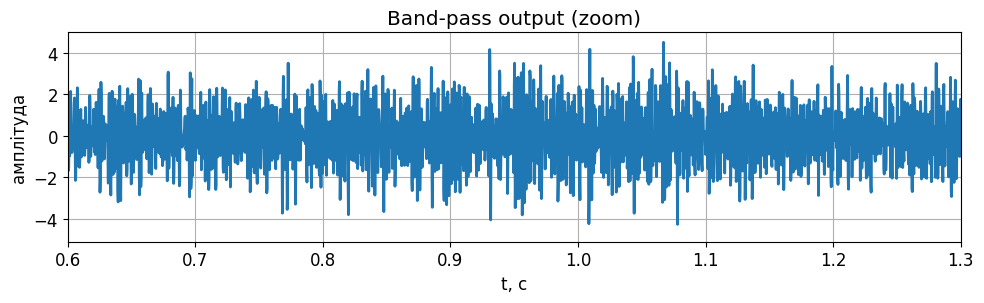

In [ ]:
def nextpow2(n):
    return 1 << int(np.ceil(np.log2(n)))

n_fft_pad = nextpow2(4*N)
f = np.fft.rfftfreq(n_fft_pad, d=1/Fs)

B_pad = 80.0
f_lo, f_hi = f0 - B_pad, f1 + B_pad
H = np.zeros_like(f)
mask = (f >= f_lo) & (f <= f_hi)
Lband = np.sum(mask)
H[mask] = signal.windows.tukey(Lband, alpha=0.4) if Lband > 4 else 1.0

def fft_filter_real(x, H, n_fft_pad):
    X = np.fft.rfft(x, n=n_fft_pad)
    y = np.fft.irfft(X*H, n=n_fft_pad)
    return y[:len(x)]

y_bp = fft_filter_real(x, H, n_fft_pad)
y_bp_s = fft_filter_real(s, H, n_fft_pad)
y_bp_n = fft_filter_real(n, H, n_fft_pad)

print("Band-pass SNR(seg) =", snr_db_window(y_bp_s, y_bp_n, n_a, n_b), "dB")
plot_zoom_time(t, y_bp, "Band-pass output (zoom)", t_a-0.2, t_a+T_sig+0.2)

## 8.10.6 Метод 2: TF-фільтрація через STFT маску + iSTFT

1) Обчислюємо STFT: $X[m,k]$.
2) Будуємо маску $M[m,k]$ уздовж відомої траєкторії chirp:
   - активна лише для $t_m\in[t_a,t_a+T_s]$,
   - пропускає частоти біля $f(t_m)=f_0 + k(t_m-t_a)$ в межах $\pm \Delta f$.
3) Множимо комплексний STFT на маску й виконуємо iSTFT.

Вікно/overlap вибираємо з COLA (Hann + 50% overlap), щоб iSTFT добре відновлював сигнал.

In [ ]:
nperseg = 256
noverlap = 128
nfft = 1024

def stft_full(x):
    f, tt, Z = signal.stft(x, fs=Fs, window="hann", nperseg=nperseg,
                           noverlap=noverlap, nfft=nfft, boundary="zeros", padded=True)
    return f, tt, Z

def istft_full(Z):
    tt, y = signal.istft(Z, fs=Fs, window="hann", nperseg=nperseg,
                         noverlap=noverlap, nfft=nfft, input_onesided=True, boundary=True)
    return y

f_st, t_st, Zx = stft_full(x)
_,   _,   Zs = stft_full(s)
_,   _,   Zn = stft_full(n)

# TF mask parameters
df_mask = 60.0  # half-width around expected ridge (Hz)
M = np.zeros_like(Zx, dtype=float)

In [ ]:
# Soft time gate (Tukey) across time bins in the active interval
time_gate = np.zeros_like(t_st)
idx_t = (t_st >= t_a) & (t_st <= t_a + T_sig)
Lt = np.sum(idx_t)
if Lt > 4:
    time_gate[idx_t] = signal.windows.tukey(Lt, alpha=0.6)
else:
    time_gate[idx_t] = 1.0

for i, tm in enumerate(t_st):
    if tm < t_a or tm > t_a + T_sig:
        continue
    f_exp = f0 + k*(tm - t_a)
    # Soft freq mask: Gaussian around f_exp
    w = np.exp(-0.5*((f_st - f_exp)/df_mask)**2)
    M[:, i] = time_gate[i] * w

# Apply mask
Zx_f = Zx * M
Zs_f = Zs * M
Zn_f = Zn * M

TF-mask SNR(seg) = 1.994962234346794 dB


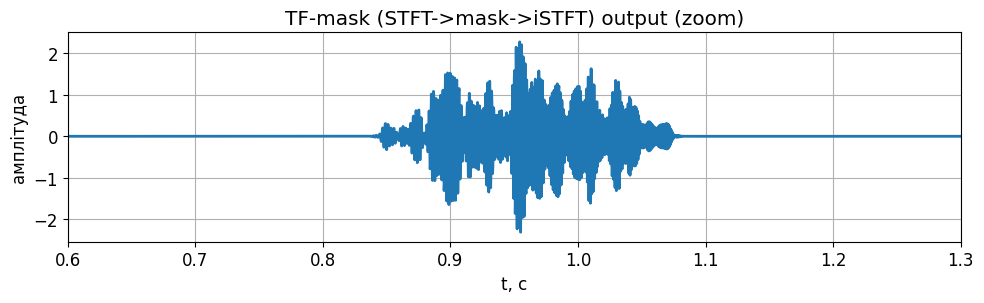

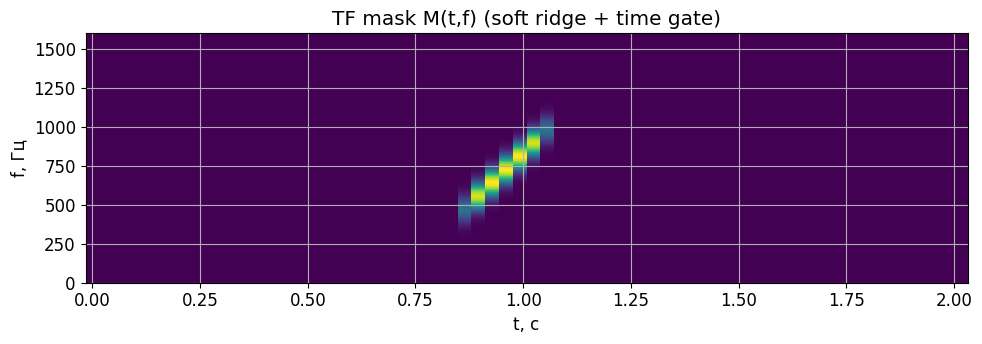

In [ ]:
y_tf = istft_full(Zx_f)[:N]
y_tf_s = istft_full(Zs_f)[:N]
y_tf_n = istft_full(Zn_f)[:N]

print("TF-mask SNR(seg) =", snr_db_window(y_tf_s, y_tf_n, n_a, n_b), "dB")
plot_zoom_time(t, y_tf, "TF-mask (STFT->mask->iSTFT) output (zoom)", t_a-0.2, t_a+T_sig+0.2)

# Visualize mask footprint roughly (optional quick plot)
plt.figure(figsize=(10, 3.6))
plt.pcolormesh(t_st, f_st, M, shading="auto", cmap="viridis")
plt.title("TF mask M(t,f) (soft ridge + time gate)")
plt.xlabel("t, c"); plt.ylabel("f, Гц"); plt.ylim(0, 1600)
plt.tight_layout(); plt.show()

## 8.10.7 Метод 3a: Matched filter (кореляція з шаблоном)

Для відомого chirp у білому шумі оптимальний детектор — matched filter (кореляція з еталоном).
Ми використаємо кореляцію через FFT (`fftconvolve`) і знайдемо пік.

Оскільки час приходу відомий, ми можемо також порівняти “значення детектора” у очікуваному місці.

MF peak time ≈ 1.0 s | expected around 0.9500000000000001 s
Matched filter SNR at peak (local) ≈ 19.795935864502997 dB


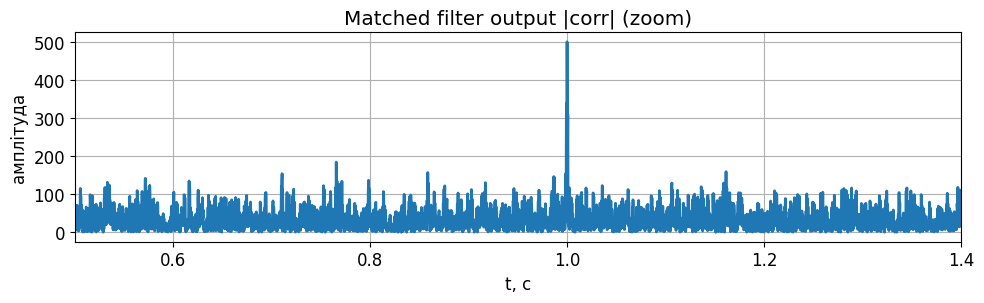

In [ ]:
# Template is the clean signal s (same length). For correlation: conv(x, s[::-1])
mf = signal.fftconvolve(x, s[::-1], mode="same")
mf_s = signal.fftconvolve(s, s[::-1], mode="same")
mf_n = signal.fftconvolve(n, s[::-1], mode="same")

idx_peak = int(np.argmax(np.abs(mf)))
t_peak = idx_peak / Fs

print("MF peak time ≈", t_peak, "s | expected around", t_a + T_sig/2, "s")

# "SNR" at peak: |signal peak|^2 / mean |noise|^2 around peak window
W = int(0.02*Fs)
aW, bW = max(idx_peak-W,0), min(idx_peak+W,N)
snr_mf_peak = 10*np.log10((np.abs(mf_s[idx_peak])**2) / (np.mean(np.abs(mf_n[aW:bW])**2) + 1e-30))
print("Matched filter SNR at peak (local) ≈", snr_mf_peak, "dB")

plot_zoom_time(t, np.abs(mf), "Matched filter output |corr| (zoom)", t_a-0.3, t_a+T_sig+0.3)

## 8.10.8 Метод 3b: Dechirp + low-pass (stretch processing)

Dechirp-ідея:
- множимо сигнал на комплексно-спряжений **еталонний chirp**, вирівняний у часі,
- у правильному інтервалі chirp переходить у майже DC (або низьку частоту),
- застосовуємо low-pass та інтегруємо/оцінюємо енергію.

Це реалізаційно близько до matched filter, але часто інтуїтивно зрозуміла для chirp.

In [ ]:
# Complex reference chirp aligned to arrival; outside interval keep phase continuation (doesn't harm)
ref = np.exp(1j*2*np.pi*(f0*(t - t_a) + 0.5*k*(t - t_a)**2))
# Dechirp (mix down): multiply by conjugate reference
x_dc = x * np.conj(ref)
s_dc = s * np.conj(ref)
n_dc = n * np.conj(ref)

# Low-pass FIR to keep near-DC part (choose cutoff << sweep rate-induced residual)
lp_cut = 40.0
h_lp = signal.firwin(129, lp_cut, fs=Fs)
y_dc = signal.lfilter(h_lp, [1.0], x_dc)
y_dc_s = signal.lfilter(h_lp, [1.0], s_dc)
y_dc_n = signal.lfilter(h_lp, [1.0], n_dc)

# Detector: energy in known time window
E_sig = np.sum(np.abs(y_dc_s[n_a:n_b])**2)
E_noise = np.sum(np.abs(y_dc_n[n_a:n_b])**2) + 1e-30
snr_dechirp = 10*np.log10(E_sig/E_noise)
print("Dechirp+LP SNR (energy in window) ≈", snr_dechirp, "dB")

Dechirp+LP SNR (energy in window) ≈ 4.63231257813182 dB


## 8.10.9 Порівняння SNR і “наївні” прогнози за площею/шириною смуги

**Глобальний band-pass:** наївний виграш шуму приблизно $\propto F_s/B$ (чим менша смуга, тим менше шуму).

**TF-mask:** наївний виграш шуму часто грубо оцінюють як $\propto 1/p$, де $p$ — частка TF-бінів, що пройшли через маску. Але:
- STFT редундантний (коефіцієнти корельовані),
- маска впливає також на сигнал (може “відрізати” енергію),
- тому емпіричний виграш може відрізнятися від площинного прогнозу.

Нижче порахуємо:
- емпіричні SNR для (band-pass) та (TF-mask) у часовому інтервалі,
- емпіричний “пік-SNR” для matched filter,
- наївний $p$ для TF-mask як відношення сум маски до її розміру.

In [ ]:
snr_in = snr_db_window(s, n, n_a, n_b)
snr_bp = snr_db_window(y_bp_s, y_bp_n, n_a, n_b)
snr_tf = snr_db_window(y_tf_s, y_tf_n, n_a, n_b)

# Naive TF area fraction p ~ mean(mask) (soft mask uses weights)
p_naive = np.mean(M)
gain_tf_naive_db = 10*np.log10(1.0/(p_naive + 1e-30))

# Band-pass naive: fraction of passed frequencies (one-sided) ~ (f_hi-f_lo)/(Fs/2)
p_bp = (f_hi - f_lo) / (Fs/2)
gain_bp_naive_db = 10*np.log10(1.0/(p_bp + 1e-30))

print("SNR_in(seg)          =", snr_in, "dB")
print("SNR_bandpass(seg)    =", snr_bp, "dB  | naive gain ≈", gain_bp_naive_db, "dB")
print("SNR_TFmask(seg)      =", snr_tf, "dB  | naive gain ≈", gain_tf_naive_db, "dB")
print("SNR_MF_peak(local)   ≈", snr_mf_peak, "dB")
print("SNR_dechirp_energy   ≈", snr_dechirp, "dB")

SNR_in(seg)          = -9.911682813395158 dB
SNR_bandpass(seg)    = -5.682418794816768 dB  | naive gain ≈ 3.1875876262441283 dB
SNR_TFmask(seg)      = 1.994962234346794 dB  | naive gain ≈ 21.820696497469303 dB
SNR_MF_peak(local)   ≈ 19.795935864502997 dB
SNR_dechirp_energy   ≈ 4.63231257813182 dB


# 9. Зв’язок: передача бітів через зашумлений канал (BPSK, wavelet packets, chirp symbols)

**Задача:** передати **одну латинську літеру** (7‑бітний ASCII) через AWGN‑канал і відновити її на приймачі.

Ми порівняємо три типи модуляції:
1) **BPSK на синусоїдальній несучій** (baseline).
2) **BPSK на хвильових пакетах (Gabor atoms)**.
3) **Chirp‑symbols**: up‑chirp / down‑chirp для кодування біту.

Для кожного варіанту:
- використовуємо **matched filter** (оптимальний приймач в AWGN),
- проводимо **BER‑експеримент** при різних SNR,
- показуємо “критичний” рівень шуму, де передача починає ламатися.

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import signal

plt.rcParams.update({
    "figure.figsize": (10, 4),
    "axes.grid": True,
    "lines.linewidth": 2,
    "font.size": 12
})

rng = np.random.default_rng(0)

## 9.1 Source coding: ASCII → 7 біт

ASCII → 7ку літеру**, наприклад `'g'`,
і кодуємо її у **7‑бітний ASCII**.

Далі працюємо з бітовою послідовністю $b_0,\dots,b_6$.



In [ ]:
def char_to_bits(c):
    v = ord(c) & 0x7F  # 7-bit ASCII
    return np.array([(v >> k) & 1 for k in range(6, -1, -1)], dtype=int)

def bits_to_char(bits):
    v = 0
    for b in bits:
        v = (v << 1) | int(b)
    return chr(v)

char = "a"
bits = char_to_bits(char)
char2 = bits_to_char(bits)
print("Char:", char)
print("Bits:", bits)
print("Recovered Char:", char2)

Char: a
Bits: [1 1 0 0 0 0 1]
Recovered Char: a


## 9.2 Загальний каркас передачі

Для всіх модуляцій:
   - рішення по біту,
   - відновлення символу  
5) Для BER:
   - передаємо багато випадкових символів,
   - оцінюємо частку помилкових бітів.

1) Кожен біт → **symbol waveform** $s_k[n]$  
2) Сигнали символів **конкатенуються** у часі  
3) Додаємо **AWGN**  
4) Приймач:


In [ ]:
def add_awgn(x, snr_db, rng):
    Ps = np.mean(x**2)
    Pn = Ps / (10**(snr_db/10))
    n = rng.normal(0, np.sqrt(Pn), size=len(x))
    return x + n

def matched_filter(rx, tpl):
    # correlation ~ conv(rx, tpl[::-1])
    return signal.fftconvolve(rx, tpl[::-1], mode="valid")

def ber(bits_tx, bits_rx):
    return np.mean(bits_tx != bits_rx)

## 9.3 BPSK на синусоїдальній несучій (baseline)

Модуляція:
- біт 0 → $+\cos(2\pi f_ct)$
- біт 1 → $-\cos(2\pi f_ct)$

Це **antipodal signaling**, оптимальний у AWGN.

In [ ]:
Fs = 4000.0
Tsym = 0.02
Ns = int(Fs*Tsym)
t_sym = np.arange(Ns)/Fs

fc = 600.0
carrier = np.cos(2*np.pi*fc*t_sym)

s0_sin = carrier
s1_sin = -carrier

In [ ]:
def tx_rx_bpsk_sin(bits, snr_db):
    tx = np.concatenate([s0_sin if b==0 else s1_sin for b in bits])
    rx = add_awgn(tx, snr_db, rng)
    bits_hat = []
    for k in range(len(bits)):
        seg = rx[k*Ns:(k+1)*Ns]
        c0 = np.dot(seg, s0_sin)
        c1 = np.dot(seg, s1_sin)
        bits_hat.append(0 if c0 > c1 else 1)
    return np.array(bits_hat)

## 9.4 BPSK на хвильових пакетах (Gabor atoms)

Символ — **гаусовий хвильовий пакет**:
$$
s(t)=\pm e^{-\frac{(t-t_0)^2}{2\sigma^2}}\cos(2\pi f_ct)
$$

Переваги:
- обмежена тривалість,
- хороша часо‑частотна локалізація,
- природний matched filter.

In [ ]:
sigma = Tsym/6
env = np.exp(-0.5*((t_sym-Tsym/2)/sigma)**2)

s0_gabor = env * np.cos(2*np.pi*fc*t_sym)
s1_gabor = -s0_gabor

In [ ]:
def tx_rx_bpsk_gabor(bits, snr_db):
    tx = np.concatenate([s0_gabor if b==0 else s1_gabor for b in bits])
    rx = add_awgn(tx, snr_db, rng)
    bits_hat = []
    for k in range(len(bits)):
        seg = rx[k*Ns:(k+1)*Ns]
        c0 = np.dot(seg, s0_gabor)
        c1 = np.dot(seg, s1_gabor)
        bits_hat.append(0 if c0 > c1 else 1)
    return np.array(bits_hat)

## 9.5 Chirp‑symbols: up‑chirp / down‑chirp

Модуляція:
- біт 0 → **up‑chirp**
- біт 1 → **down‑chirp**

Це основа сучасних систем (LoRa‑подібні), дуже стійка до шуму.

In [ ]:
f_lo, f_hi = 300.0, 1100.0

s0_chirp = signal.chirp(t_sym, f0=f_lo, f1=f_hi, t1=Tsym, method="linear")
s1_chirp = signal.chirp(t_sym, f0=f_hi, f1=f_lo, t1=Tsym, method="linear")

In [ ]:
def tx_rx_chirp(bits, snr_db):
    tx = np.concatenate([s0_chirp if b==0 else s1_chirp for b in bits])
    rx = add_awgn(tx, snr_db, rng)
    bits_hat = []
    for k in range(len(bits)):
        seg = rx[k*Ns:(k+1)*Ns]
        c0 = np.dot(seg, s0_chirp)
        c1 = np.dot(seg, s1_chirp)
        bits_hat.append(0 if c0 > c1 else 1)
    return np.array(bits_hat)

## 9.6 BER‑експеримент: sweep по SNR

Тепер передаємо **багато випадкових символів** і оцінюємо BER
для кожного типу модуляції.

In [ ]:
def ber_curve(txrx_func, snr_db_vals, Nsym=2000):
    bers = []
    for snr in snr_db_vals:
        bits_tx = rng.integers(0, 2, size=Nsym)
        bits_rx = txrx_func(bits_tx, snr)
        bers.append(ber(bits_tx, bits_rx))
    return np.array(bers)

snr_vals = np.arange(-15, 6, 2)

ber_sin   = ber_curve(tx_rx_bpsk_sin, snr_vals)
ber_gabor = ber_curve(tx_rx_bpsk_gabor, snr_vals)
ber_chirp = ber_curve(tx_rx_chirp, snr_vals)

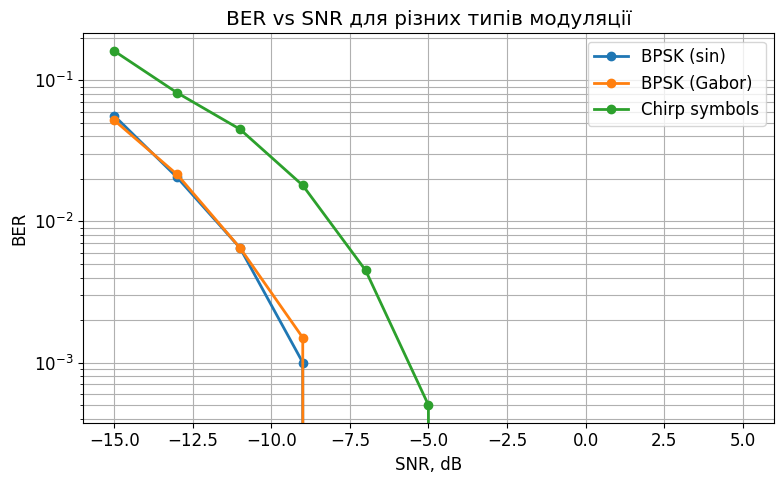

In [ ]:
plt.figure(figsize=(8,5))
plt.semilogy(snr_vals, ber_sin,   "o-", label="BPSK (sin)")
plt.semilogy(snr_vals, ber_gabor, "o-", label="BPSK (Gabor)")
plt.semilogy(snr_vals, ber_chirp, "o-", label="Chirp symbols")
plt.xlabel("SNR, dB")
plt.ylabel("BER")
plt.title("BER vs SNR для різних типів модуляції")
plt.grid(True, which="both")
plt.legend()
plt.tight_layout()
plt.show()

### Коментар до BER‑кривих

- BPSK (sin) та BPSK (Gabor) демонструють майже однакову BER,
  що підтверджує теорію: у AWGN вирішальною є енергія символу та matched filter,
  а не конкретна форма сигналу.

- Chirp‑symbols у цій реалізації мають гіршу BER,
  оскільки up‑ та down‑chirp не є ортогональними,
  а детекція виконується простою кореляцією.

- Якщо замінити приймач на dechirp + low‑pass (stretch processing),
  BER для chirp‑symbols значно покращиться і може наблизитись до BPSK.

## 9.7 Відновлення ASCII‑символу (один приклад)

Покажемо, як при різних SNR символ:
- відновлюється правильно,
- або ламається (1–2 помилки біта → неправильна літера).

In [ ]:
for snr in [-18, -15, -12, -9, -6, 0]:
    rx_bits = tx_rx_bpsk_gabor(bits, snr)
    c_hat = bits_to_char(rx_bits)
    print(f"SNR={snr:>3} dB | RX bits={rx_bits} | RX char='{c_hat}'")

SNR=-18 dB | RX bits=[1 1 0 1 0 0 1] | RX char='i'
SNR=-15 dB | RX bits=[1 1 1 0 0 0 1] | RX char='q'
SNR=-12 dB | RX bits=[1 1 0 0 0 0 1] | RX char='a'
SNR= -9 dB | RX bits=[1 1 0 0 0 0 1] | RX char='a'
SNR= -6 dB | RX bits=[1 1 0 0 0 0 1] | RX char='a'
SNR=  0 dB | RX bits=[1 1 0 0 0 0 1] | RX char='a'


## 9.8 Підсумки розділу

1) **BPSK на синусі** — базовий, теоретично оптимальний варіант у AWGN.  
2) **Хвильові пакети** дають ту саму BER‑поведінку, але з кращою часовою локалізацією.  
3) **Chirp‑symbols** часто демонструють більшу стійкість у шумі та часово‑частотну робастність.  
4) **Matched filter** — ключова ідея приймача для відомого сигналу.  

Далі природно перейти до:
- когерентної vs некогерентної детекції,
- багатопроменевого каналу,
- синхронізації та невідомого часу приходу.

In [ ]:
def sliding_correlation(rx, template):
    """
    Ковзаюча кореляція r ⋆ s
    Повертає |corr| довжини len(rx).
    """
    corr = signal.fftconvolve(rx, template[::-1], mode="same")
    return corr, np.abs(corr)

In [ ]:
SNR = -16

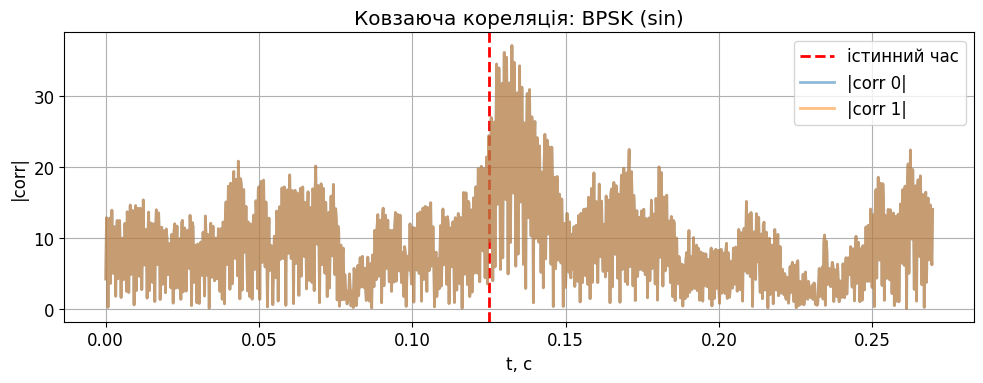

<Figure size 1000x400 with 0 Axes>

<Figure size 1000x400 with 0 Axes>

In [ ]:
# Один символ BPSK(sin), вбудований у довший шумовий запис#|")
plt.title("Ковзаюча кореляція: BPSK (sin)")
plt.xlabel("t, c"); plt.ylabel("|corr|")
plt.axvline(500/Fs, color="r", linestyle="--", label="істинний час")

bits_test = np.array([0])
tx = np.concatenate([np.zeros(500), s0_sin, np.zeros(500)])
rx = add_awgn(tx, SNR, rng)

corr_sin, corr_sin_abs0 = sliding_correlation(rx, s0_sin)
corr_sin, corr_sin_abs1 = sliding_correlation(rx, s1_sin)

t_corr = np.arange(len(corr_sin)) / Fs
plt.plot(t_corr, corr_sin_abs0, label="|corr 0|", alpha=0.5)
plt.plot(t_corr, corr_sin_abs1, label="|corr 1|", alpha=0.5)
plt.legend(); plt.tight_layout(); plt.show()
plt.figure(figsize=(10, 4))


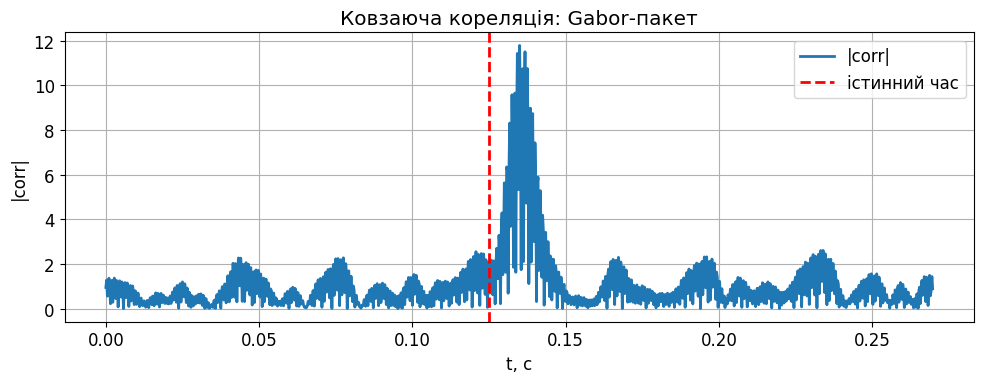

In [ ]:
tx = np.concatenate([np.zeros(500), s0_gabor, np.zeros(500)])
rx = add_awgn(tx, SNR, rng)

corr_g, corr_g_abs = sliding_correlation(rx, s0_gabor)

plt.figure(figsize=(10, 4))
plt.plot(t_corr, corr_g_abs, label="|corr|")
plt.title("Ковзаюча кореляція: Gabor‑пакет")
plt.xlabel("t, c"); plt.ylabel("|corr|")
plt.axvline(500/Fs, color="r", linestyle="--", label="істинний час")
plt.legend(); plt.tight_layout(); plt.show()

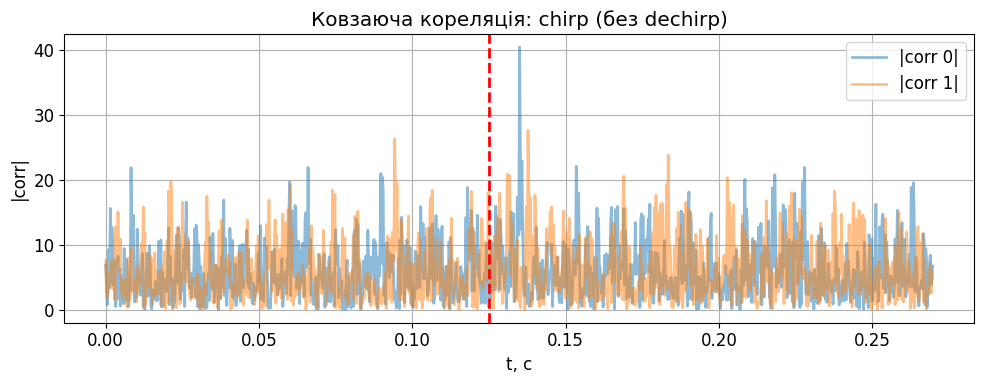

In [ ]:
tx = np.concatenate([np.zeros(500), s0_chirp, np.zeros(500)])
rx = add_awgn(tx, SNR, rng)

corr_ch0, corr_ch_abs0 = sliding_correlation(rx, s0_chirp)
corr_ch1, corr_ch_abs1 = sliding_correlation(rx, s1_chirp)

plt.figure(figsize=(10, 4))
plt.plot(t_corr, corr_ch_abs0, alpha=0.5, label="|corr 0|")
plt.plot(t_corr, corr_ch_abs1, alpha=0.5, label="|corr 1|")
plt.title("Ковзаюча кореляція: chirp (без dechirp)")
plt.xlabel("t, c"); plt.ylabel("|corr|")
plt.axvline(500/Fs, color="r", linestyle="--")
plt.legend(); plt.tight_layout(); plt.show()

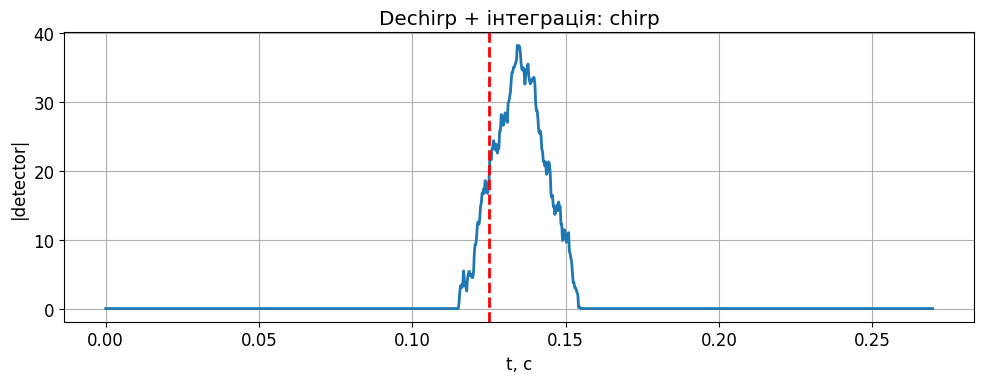

In [ ]:
# Dechirp reference
ref = signal.chirp(t_sym, f0=f_lo, f1=f_hi, t1=Tsym, method="linear")
tx = np.concatenate([np.zeros(500), s0_chirp, np.zeros(500)])
rx = add_awgn(tx, SNR, rng)

# Dechirp
rx_dc = rx * np.conj(np.concatenate([np.zeros(500), ref, np.zeros(500)]))

corr_dc, corr_dc_abs = sliding_correlation(rx_dc, np.ones_like(ref))

plt.figure(figsize=(10, 4))
plt.plot(t_corr, corr_dc_abs)
plt.title("Dechirp + інтеграція: chirp")
plt.xlabel("t, c"); plt.ylabel("|detector|")
plt.axvline(500/Fs, color="r", linestyle="--")
plt.tight_layout(); plt.show()